# **Interaction Level Analysis (Non Clipped Scores)**

In [ ]:
!pip install pingouin

In [1]:
scores = "non_clipped"

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import 
from scipy.stats import ttest_ind
from scipy.stats import pearsonr, norm
import pingouin as pg
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.colors as mcolors

# **Data**

In [3]:
# import EMI data
df_all = pd.read_csv(f"../../data/analysis_data/df_all_{scores}.csv")
df_all

/tmp/ipykernel_551/3485382557.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df_all = pd.read_csv(f"../../data/analysis_data/df_all_{scores}.csv")


,msg_id_parent,msg_id_child,submission_id,subreddit,exact_time_child,author_child,author_parent,author_submission,finetuned_child_E_norm,finetuned_child_I_norm,...,finetuned_parent_len_norm_z_trans_EMI,finetuned_child_len_norm_z_trans_EMI,finetuned_submission_len_norm_z_trans_EMI,self_parent_len_norm_z_trans_EMI,self_child_len_norm_z_trans_EMI,self_submission_len_norm_z_trans_EMI,predictions_label_ft,predictions_score_ft,predictions_prob_disagree,predictions_ft
0,c7ecp8d,c7ecs2n,14m325,Ask_Politics,1355166551.0,karmanaut,Ramblin_Dash,karmanaut,0.053025,0.072843,...,0.514532,-0.116730,0.594431,0.624110,-0.011457,0.172262,0,0.6180,0.38180,no_disagreement
1,c7ecp8d,c7ecxpk,14m325,Ask_Politics,1355167049.0,zoolander951,Ramblin_Dash,karmanaut,0.040605,0.001874,...,0.514532,0.363800,0.594431,0.624110,0.012864,0.172262,0,0.7134,0.28640,no_disagreement
2,c7ecp8d,c7eflag,14m325,Ask_Politics,1355175187.0,zossima,Ramblin_Dash,karmanaut,0.037034,-0.026841,...,0.514532,0.571814,0.594431,0.624110,0.600814,0.172262,0,0.6580,0.34180,no_disagreement
3,c7efx8q,c7ejh1d,14m325,Ask_Politics,1355187644.0,fathermocker,senatorskeletor,karmanaut,0.046751,0.040446,...,0.269966,0.096978,0.594431,0.130100,0.070296,0.172262,1,0.9507,0.95070,disagree
4,c7efx8q,c7f8140,14m325,Ask_Politics,1355286254.0,PKMKII,senatorskeletor,karmanaut,0.029991,-0.043360,...,0.269966,0.644853,0.594431,0.130100,0.612353,0.172262,0,0.8580,0.14180,no_disagreement
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4938799,kfkh5ib,kfmd52k,18uirzt,politics,1970-01-01 00:00:01.703977996,Knightforlife,freddiethebaer,optimalg,0.289315,0.222072,...,1.250681,0.671616,-0.580210,1.062374,0.498045,-0.857240,0,0.9550,0.04495,no_disagreement
4938800,kfklsb6,kforzbx,18uirzt,politics,1970-01-01 00:00:01.704023024,bakerfredricka,4blockhead,optimalg,0.192579,0.210383,...,1.367783,-0.043416,-0.580210,1.165189,-0.381238,-0.857240,0,0.9920,0.00774,no_disagreement
4938801,kfmq5kr,kfp6tzv,18uirzt,politics,1970-01-01 00:00:01.704032059,glassjar1,DoubleTFan,optimalg,0.078374,0.101258,...,-0.197753,-0.140261,-0.580210,0.242695,-0.122822,-0.857240,1,0.8500,0.85000,disagree
4938802,kfp3d4v,kfp8xh8,18uirzt,politics,1970-01-01 00:00:01.704033069,HaulinBoats,4blockhead,optimalg,0.137089,0.224533,...,0.600514,-0.617072,-0.580210,0.207855,-0.789836,-0.857240,0,0.9414,0.05875,no_disagreement


### **Heatmap of Correlation of Submission / Comment / Reply EMI scores**

* Also, confidence intervals and CI's

In [8]:
sub_to_comm = df_all.groupby("msg_id_parent").agg(
    ft_EMI_z_submission_EMI=("finetuned_submission_len_EMI_z_trans", "first"),
    ft_EMI_z_comment_EMI=("finetuned_parent_len_EMI_z_trans", "first"),
    ).reset_index()

sub_to_comm[['ft_EMI_z_submission_EMI', 'ft_EMI_z_comment_EMI']].corr()

pg.corr(x=sub_to_comm['ft_EMI_z_submission_EMI'], y=sub_to_comm['ft_EMI_z_comment_EMI'], method='pearson')

,n,r,CI95%,p-val,BF10,power
pearson,1977544,0.168902,"[0.17, 0.17]",0.0,inf,1.0


In [9]:
com_to_rep = df_all.groupby("msg_id_child").agg(
    ft_EMI_z_submission_EMI=("finetuned_submission_len_EMI_z_trans", "first"),
    ft_EMI_z_comment_EMI=("finetuned_parent_len_EMI_z_trans", "first"),
    ft_EMI_z_reply_EMI=("finetuned_child_len_EMI_z_trans", "first"),
    ).reset_index()

com_to_rep[['ft_EMI_z_submission_EMI', 'ft_EMI_z_comment_EMI', 'ft_EMI_z_reply_EMI']].corr()

pg.corr(x=com_to_rep['ft_EMI_z_comment_EMI'], y=com_to_rep['ft_EMI_z_reply_EMI'], method='pearson')

,n,r,CI95%,p-val,BF10,power
pearson,4938577,0.366815,"[0.37, 0.37]",0.0,inf,1.0


In [10]:
com_to_rep[['ft_EMI_z_submission_EMI', 'ft_EMI_z_comment_EMI', 'ft_EMI_z_reply_EMI']].corr()

,ft_EMI_z_submission_EMI,ft_EMI_z_comment_EMI,ft_EMI_z_reply_EMI
ft_EMI_z_submission_EMI,1.000000,0.170239,0.126381
ft_EMI_z_comment_EMI,0.170239,1.000000,0.366815
ft_EMI_z_reply_EMI,0.126381,0.366815,1.000000


In [11]:
pg.corr(x=com_to_rep['ft_EMI_z_submission_EMI'], y=com_to_rep['ft_EMI_z_reply_EMI'], method='pearson')

,n,r,CI95%,p-val,BF10,power
pearson,4938571,0.126381,"[0.13, 0.13]",0.0,inf,1.0


/tmp/ipykernel_405/1128929449.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])  # leave space on right


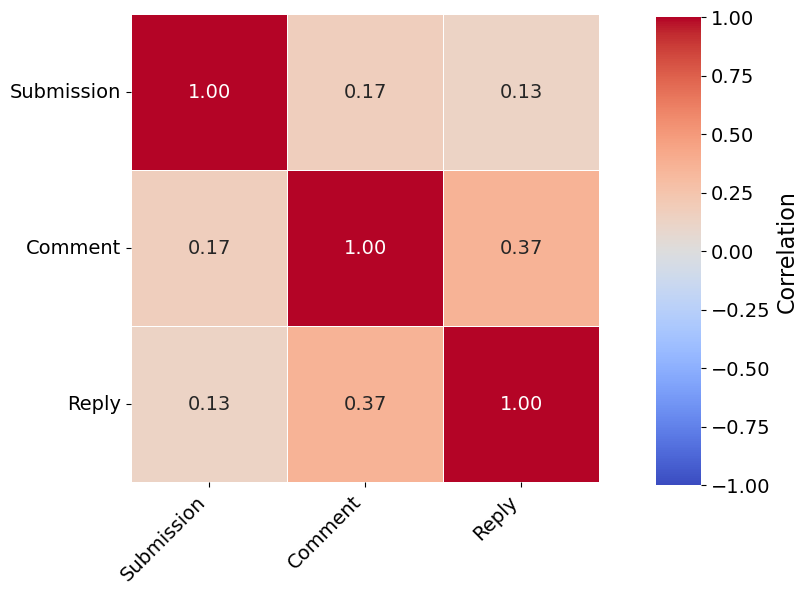

In [ ]:
def plot_len_emi_corr_matrix_paper(
    df,
    save_path='Correlation_Text_Level.pdf',
    figsize=(10, 6),
    cbar_position='right'  # Only 'right' supported in this template
):

    # Font settings
    label_fontsize = 16
    tick_fontsize = 14
    title_fontsize = 18

    # Select and rename relevant columns
    corr_cols = [
        'finetuned_submission_len_EMI_z_trans',
        'finetuned_parent_len_EMI_z_trans',
        'finetuned_child_len_EMI_z_trans'
    ]
    col_rename = {
        'finetuned_submission_len_EMI_z_trans': 'Submission',
        'finetuned_parent_len_EMI_z_trans': 'Comment',
        'finetuned_child_len_EMI_z_trans': 'Reply'
    }

    df_corr = df[corr_cols].rename(columns=col_rename)
    corr = df_corr.corr()

    # Global color limits
    global_min = corr.min().min()
    global_max = corr.max().max()
    max_abs = max(abs(global_min), abs(global_max))

    # Set up plot
    fig, ax = plt.subplots(figsize=figsize)

    sns.heatmap(
        corr,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        vmin=-max_abs,
        vmax=max_abs,
        ax=ax,
        cbar=False,
        square=True,
        linewidths=0.5,
        annot_kws={"size": tick_fontsize}
    )

    #ax.set_title("Correlation Matrix – Document Level (Length-Adjusted EMI)", fontsize=title_fontsize)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=tick_fontsize)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=tick_fontsize)

    # Custom colorbar placement
    if cbar_position == 'right':
        cbar_ax = fig.add_axes([0.75, 0.19, 0.05, 0.78])  # [left, bottom, width, height]
    else:
        raise NotImplementedError("Only 'right' is currently implemented for colorbar position.")

    norm = mcolors.Normalize(vmin=-max_abs, vmax=max_abs)
    sm = cm.ScalarMappable(cmap="coolwarm", norm=norm)
    sm.set_array([])

    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label("Correlation", fontsize=label_fontsize)
    cbar.ax.tick_params(labelsize=tick_fontsize)
    cbar.outline.set_visible(False)

    # Reserve space for colorbar
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # leave space on right
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()

plot_len_emi_corr_matrix_paper(df_all, figsize=(9, 6), save_path="plots/Correlation_Text_Level_Final.pdf")


### **Add probability for disagreement**

In [4]:
# rename

df_all = df_all.rename(columns = {"predictions_prob_disagree" : 'prob_disagree'})
df_all

,msg_id_parent,msg_id_child,submission_id,subreddit,exact_time_child,author_child,author_parent,author_submission,finetuned_child_E_norm,finetuned_child_I_norm,...,finetuned_parent_len_norm_z_trans_EMI,finetuned_child_len_norm_z_trans_EMI,finetuned_submission_len_norm_z_trans_EMI,self_parent_len_norm_z_trans_EMI,self_child_len_norm_z_trans_EMI,self_submission_len_norm_z_trans_EMI,predictions_label_ft,predictions_score_ft,prob_disagree,predictions_ft
0,c7ecp8d,c7ecs2n,14m325,Ask_Politics,1355166551.0,karmanaut,Ramblin_Dash,karmanaut,0.053025,0.072843,...,0.514532,-0.116730,0.594431,0.624110,-0.011457,0.172262,0,0.6180,0.38180,no_disagreement
1,c7ecp8d,c7ecxpk,14m325,Ask_Politics,1355167049.0,zoolander951,Ramblin_Dash,karmanaut,0.040605,0.001874,...,0.514532,0.363800,0.594431,0.624110,0.012864,0.172262,0,0.7134,0.28640,no_disagreement
2,c7ecp8d,c7eflag,14m325,Ask_Politics,1355175187.0,zossima,Ramblin_Dash,karmanaut,0.037034,-0.026841,...,0.514532,0.571814,0.594431,0.624110,0.600814,0.172262,0,0.6580,0.34180,no_disagreement
3,c7efx8q,c7ejh1d,14m325,Ask_Politics,1355187644.0,fathermocker,senatorskeletor,karmanaut,0.046751,0.040446,...,0.269966,0.096978,0.594431,0.130100,0.070296,0.172262,1,0.9507,0.95070,disagree
4,c7efx8q,c7f8140,14m325,Ask_Politics,1355286254.0,PKMKII,senatorskeletor,karmanaut,0.029991,-0.043360,...,0.269966,0.644853,0.594431,0.130100,0.612353,0.172262,0,0.8580,0.14180,no_disagreement
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4938799,kfkh5ib,kfmd52k,18uirzt,politics,1970-01-01 00:00:01.703977996,Knightforlife,freddiethebaer,optimalg,0.289315,0.222072,...,1.250681,0.671616,-0.580210,1.062374,0.498045,-0.857240,0,0.9550,0.04495,no_disagreement
4938800,kfklsb6,kforzbx,18uirzt,politics,1970-01-01 00:00:01.704023024,bakerfredricka,4blockhead,optimalg,0.192579,0.210383,...,1.367783,-0.043416,-0.580210,1.165189,-0.381238,-0.857240,0,0.9920,0.00774,no_disagreement
4938801,kfmq5kr,kfp6tzv,18uirzt,politics,1970-01-01 00:00:01.704032059,glassjar1,DoubleTFan,optimalg,0.078374,0.101258,...,-0.197753,-0.140261,-0.580210,0.242695,-0.122822,-0.857240,1,0.8500,0.85000,disagree
4938802,kfp3d4v,kfp8xh8,18uirzt,politics,1970-01-01 00:00:01.704033069,HaulinBoats,4blockhead,optimalg,0.137089,0.224533,...,0.600514,-0.617072,-0.580210,0.207855,-0.789836,-0.857240,0,0.9414,0.05875,no_disagreement


### **User Ideology**

* take interaction level
* text level is distorted as unique comments are associated with different stance labels $\to$ distorts analysis

In [5]:
texts = pd.read_csv(f"../../data/analysis_data/texts_ideology_{scores}.csv")
texts

,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,predictions_prob_disagree,type,Partisan_Score
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,0.017145
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,0.013507
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,0.035521
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,0.182155
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,0.024481
...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,-0.024883
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,-0.082393
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,-0.024883
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,-0.024883


In [6]:
# incl mods
interactions_all = pd.read_csv(f"../../data/analysis_data/interactions_ideology_{scores}.csv")
interactions_all = interactions_all.merge(df_all[['msg_id_child', 'prob_disagree']], how = "left", right_on = "msg_id_child", left_on = "msg_id_child")

# some submissions no ideology
print(len(interactions_all))
print("Nr. of interactions without submission ideology:", len(interactions_all[interactions_all["submission_partisan"].isnull()]))

/tmp/ipykernel_551/1644968003.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactions_all = pd.read_csv(f"../../data/analysis_data/interactions_ideology_{scores}.csv")


4933855
Nr. of interactions without submission ideology: 3306444


### **Check No-Ideology Submissions**

* parent and child all users have an ideology score
* only submissions missing $\to$ MODERATORS

In [7]:
interactions_all[interactions_all["submission_partisan"].isnull()]["author_submission"].value_counts().sort_values(ascending = False)[:10]

author_submission
politicsmoderatorbot    3289370
politicsmod               12423
automoderator               148
asapientllama               147
direction_dull              128
mmcdonald1442               122
teh_speedster789             84
burakbarannn                 82
ibphysicshl                  52
lastfall                     48
Name: count, dtype: int64

In [8]:
# share of moderators among missing

(3289370 + 12423 + 148) / len(interactions_all[interactions_all["submission_partisan"].isnull()])

0.9986381139375111

In [9]:
# from which subreddits

mod_interactions = interactions_all[interactions_all["author_submission"].isin(["politicsmoderatorbot", "politicsmod", "automoderator"])]
mod_interactions["subreddit"].value_counts()

subreddit
politics           3301841
Ask_Politics            71
PoliticalDebate         29
Name: count, dtype: int64

In [10]:
# add a dummy variable, indicating moderator submissions
interactions_all["Mod_Dummy"] = np.where(interactions_all["author_submission"].isin(["politicsmoderatorbot", "politicsmod", "automoderator"]), 1, 0)
interactions_all["Mod_Dummy"].value_counts()

# drop empty submission_
interactions_all = interactions_all[~(interactions_all['submission_partisan'].isna() & (interactions_all['Mod_Dummy'] == 0))]
interactions_all

,msg_id_parent,msg_id_child,submission_id,subreddit,exact_time_child,author_child,author_parent,author_submission,finetuned_child_E_norm,finetuned_child_I_norm,...,self_submission_len_norm_z_trans_EMI,predictions_label_ft,predictions_score_ft,predictions_prob_disagree,predictions_ft,parent_partisan,child_partisan,submission_partisan,prob_disagree,Mod_Dummy
0,c7ecp8d,c7ecs2n,14m325,Ask_Politics,1355166551.0,karmanaut,ramblin_dash,karmanaut,0.053025,0.072843,...,0.172262,0,0.6180,0.38180,no_disagreement,0.017145,0.004449,0.004449,0.38180,0
1,c7ecp8d,c7ecxpk,14m325,Ask_Politics,1355167049.0,zoolander951,ramblin_dash,karmanaut,0.040605,0.001874,...,0.172262,0,0.7134,0.28640,no_disagreement,0.017145,0.030790,0.004449,0.28640,0
2,c7ecp8d,c7eflag,14m325,Ask_Politics,1355175187.0,zossima,ramblin_dash,karmanaut,0.037034,-0.026841,...,0.172262,0,0.6580,0.34180,no_disagreement,0.017145,-0.037449,0.004449,0.34180,0
3,c7efx8q,c7ejh1d,14m325,Ask_Politics,1355187644.0,fathermocker,senatorskeletor,karmanaut,0.046751,0.040446,...,0.172262,1,0.9507,0.95070,disagree,0.013507,-0.063784,0.004449,0.95070,0
4,c7efx8q,c7f8140,14m325,Ask_Politics,1355286254.0,pkmkii,senatorskeletor,karmanaut,0.029991,-0.043360,...,0.172262,0,0.8580,0.14180,no_disagreement,0.013507,-0.007571,0.004449,0.14180,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4933850,kfkh5ib,kfmd52k,18uirzt,politics,1970-01-01 00:00:01.703977996,knightforlife,freddiethebaer,optimalg,0.289315,0.222072,...,-0.857240,0,0.9550,0.04495,no_disagreement,-0.073672,0.013192,-0.024883,0.04495,0
4933851,kfklsb6,kforzbx,18uirzt,politics,1970-01-01 00:00:01.704023024,bakerfredricka,4blockhead,optimalg,0.192579,0.210383,...,-0.857240,0,0.9920,0.00774,no_disagreement,-0.030104,-0.066138,-0.024883,0.00774,0
4933852,kfmq5kr,kfp6tzv,18uirzt,politics,1970-01-01 00:00:01.704032059,glassjar1,doubletfan,optimalg,0.078374,0.101258,...,-0.857240,1,0.8500,0.85000,disagree,-0.024183,-0.019897,-0.024883,0.85000,0
4933853,kfp3d4v,kfp8xh8,18uirzt,politics,1970-01-01 00:00:01.704033069,haulinboats,4blockhead,optimalg,0.137089,0.224533,...,-0.857240,0,0.9414,0.05875,no_disagreement,-0.030104,0.033772,-0.024883,0.05875,0


In [11]:
# share of mod discussions among my sample

len(interactions_all[interactions_all["Mod_Dummy"]== 1]) /len(interactions_all)

0.6698529543031214

* three out of 722 accounting for 99.9% of the interactions
* is it a question of submissions by mods, or a question of the subreddit?
* 3,301,941 / 4,929,352 =  0.6699 sind mod submissions, only 33% human 


In [12]:
# human only: full because I have full scores for all three authors

interactions = pd.read_csv(f"../../data/analysis_data/full_interactions_ideology_{scores}.csv")
interactions = interactions.merge(df_all[['msg_id_child', 'prob_disagree']], how = "left", right_on = "msg_id_child", left_on = "msg_id_child")
interactions

/tmp/ipykernel_551/1714313812.py:4: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactions = pd.read_csv(f"../../data/analysis_data/full_interactions_ideology_{scores}.csv")


,msg_id_parent,msg_id_child,submission_id,subreddit,exact_time_child,author_child,author_parent,author_submission,finetuned_child_E_norm,finetuned_child_I_norm,...,self_child_len_norm_z_trans_EMI,self_submission_len_norm_z_trans_EMI,predictions_label_ft,predictions_score_ft,predictions_prob_disagree,predictions_ft,parent_partisan,child_partisan,submission_partisan,prob_disagree
0,c7ecp8d,c7ecs2n,14m325,Ask_Politics,1355166551.0,karmanaut,ramblin_dash,karmanaut,0.053025,0.072843,...,-0.011457,0.172262,0,0.6180,0.38180,no_disagreement,0.017145,0.004449,0.004449,0.38180
1,c7ecp8d,c7ecxpk,14m325,Ask_Politics,1355167049.0,zoolander951,ramblin_dash,karmanaut,0.040605,0.001874,...,0.012864,0.172262,0,0.7134,0.28640,no_disagreement,0.017145,0.030790,0.004449,0.28640
2,c7ecp8d,c7eflag,14m325,Ask_Politics,1355175187.0,zossima,ramblin_dash,karmanaut,0.037034,-0.026841,...,0.600814,0.172262,0,0.6580,0.34180,no_disagreement,0.017145,-0.037449,0.004449,0.34180
3,c7efx8q,c7ejh1d,14m325,Ask_Politics,1355187644.0,fathermocker,senatorskeletor,karmanaut,0.046751,0.040446,...,0.070296,0.172262,1,0.9507,0.95070,disagree,0.013507,-0.063784,0.004449,0.95070
4,c7efx8q,c7f8140,14m325,Ask_Politics,1355286254.0,pkmkii,senatorskeletor,karmanaut,0.029991,-0.043360,...,0.612353,0.172262,0,0.8580,0.14180,no_disagreement,0.013507,-0.007571,0.004449,0.14180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1627406,kfkh5ib,kfmd52k,18uirzt,politics,1970-01-01 00:00:01.703977996,knightforlife,freddiethebaer,optimalg,0.289315,0.222072,...,0.498045,-0.857240,0,0.9550,0.04495,no_disagreement,-0.073672,0.013192,-0.024883,0.04495
1627407,kfklsb6,kforzbx,18uirzt,politics,1970-01-01 00:00:01.704023024,bakerfredricka,4blockhead,optimalg,0.192579,0.210383,...,-0.381238,-0.857240,0,0.9920,0.00774,no_disagreement,-0.030104,-0.066138,-0.024883,0.00774
1627408,kfmq5kr,kfp6tzv,18uirzt,politics,1970-01-01 00:00:01.704032059,glassjar1,doubletfan,optimalg,0.078374,0.101258,...,-0.122822,-0.857240,1,0.8500,0.85000,disagree,-0.024183,-0.019897,-0.024883,0.85000
1627409,kfp3d4v,kfp8xh8,18uirzt,politics,1970-01-01 00:00:01.704033069,haulinboats,4blockhead,optimalg,0.137089,0.224533,...,-0.789836,-0.857240,0,0.9414,0.05875,no_disagreement,-0.030104,0.033772,-0.024883,0.05875


### **Add Mean Interactions EMI**

In [13]:
# add interactions EMI --> mean of parent and child

# pure interactions
interactions["mean_EMI_interaction_ft_EMI_z"] = (
    interactions["finetuned_parent_len_EMI_z_trans"] +
    interactions["finetuned_child_len_EMI_z_trans"]
) / 2
interactions["mean_EMI_interaction_ft_z_EMI"] = (
    interactions["finetuned_parent_len_norm_z_trans_EMI"] +
    interactions["finetuned_child_len_norm_z_trans_EMI"]
) / 2
interactions["mean_EMI_interaction_sb_EMI_z"] = (
    interactions["self_parent_len_EMI_z_trans"] +
    interactions["self_child_len_EMI_z_trans"]
) / 2
interactions["mean_EMI_interaction_sb_z_EMI"] = (
    interactions["self_parent_len_norm_z_trans_EMI"] +
    interactions["self_child_len_norm_z_trans_EMI"]
) / 2


# mod interactions
mod_interactions["mean_EMI_interaction_ft_EMI_z"] = (
    mod_interactions["finetuned_parent_len_EMI_z_trans"] +
    mod_interactions["finetuned_child_len_EMI_z_trans"]
) / 2
mod_interactions["mean_EMI_interaction_ft_z_EMI"] = (
    mod_interactions["finetuned_parent_len_norm_z_trans_EMI"] +
    mod_interactions["finetuned_child_len_norm_z_trans_EMI"]
) / 2
mod_interactions["mean_EMI_interaction_sb_EMI_z"] = (
    mod_interactions["self_parent_len_EMI_z_trans"] +
    mod_interactions["self_child_len_EMI_z_trans"]
) / 2
mod_interactions["mean_EMI_interaction_sb_z_EMI"] = (
    mod_interactions["self_parent_len_norm_z_trans_EMI"] +
    mod_interactions["self_child_len_norm_z_trans_EMI"]
) / 2



# all interactions
interactions_all["mean_EMI_interaction_ft_EMI_z"] = (
    interactions_all["finetuned_parent_len_EMI_z_trans"] +
    interactions_all["finetuned_child_len_EMI_z_trans"]
) / 2
interactions_all["mean_EMI_interaction_ft_z_EMI"] = (
    interactions_all["finetuned_parent_len_norm_z_trans_EMI"] +
    interactions_all["finetuned_child_len_norm_z_trans_EMI"]
) / 2
interactions_all["mean_EMI_interaction_sb_EMI_z"] = (
    interactions_all["self_parent_len_EMI_z_trans"] +
    interactions_all["self_child_len_EMI_z_trans"]
) / 2
interactions_all["mean_EMI_interaction_sb_z_EMI"] = (
    interactions_all["self_parent_len_norm_z_trans_EMI"] +
    interactions_all["self_child_len_norm_z_trans_EMI"]
) / 2

# **Distribution of EMI across texts**

In [14]:
def plot_EMI_grid(df, title="Distribution of EMI Scores", model = "finetuned", save = False, filepath = "plots/Distribution_EMI_Mod_noMod_finetuned.pdf"):


    fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
    fig.suptitle(title, fontsize=16)

    row_labels = ['Human Started Discussions', 'Moderator Started Discussions']
    col_labels = ['Submission', 'Comment', 'Reply']
    text_types = ['submission', 'parent', 'child']
    
    total_submissions = df.drop_duplicates('submission_id').shape[0]
    total_interactions = df.drop_duplicates(['msg_id_parent', 'msg_id_child']).shape[0]

    for row_idx, mod_value in enumerate([0, 1]):  # 0 for unmoderated, 1 for moderated
        # Filter the dataframe for the current Mod_Dummy value
        filtered_df = df[df["Mod_Dummy"] == mod_value]

        # Ensure only unique messages per type
        unique_df = {
            "submission": filtered_df.drop_duplicates(subset="submission_id"),
            "parent": filtered_df.drop_duplicates(subset="msg_id_parent"),
            "child": filtered_df.drop_duplicates(subset="msg_id_child")
        }

        n_subs = unique_df["submission"].shape[0]
        subs_pct = n_subs / total_submissions * 100
    
        n_interactions = unique_df["child"].shape[0] 
        interactions_pct = n_interactions / total_interactions * 100

        for col_idx, text_type in enumerate(text_types):
            
            ax = axes[row_idx, col_idx]

            sns.kdeplot(data=unique_df[text_type][f"{model}_{text_type}_len_EMI_z_trans"], ax=ax, label='First EMI, then z-trans', color='steelblue', fill=True, alpha=0.5)
            sns.kdeplot(data=unique_df[text_type][f"{model}_{text_type}_len_norm_z_trans_EMI"], ax=ax, label='First z-trans, then EMI', color='salmon', fill=True, alpha=0.5)

           
            if row_idx == 0:
                ax.set_title(col_labels[col_idx], fontsize=14)
            if col_idx == 0:
                ax.set_ylabel(row_labels[row_idx], fontsize=12)

            if row_idx == 0 and col_idx == 2:
                ax.legend(loc='upper right')

            ax.grid(True)
            ax.set_xlabel("")
            
            if col_idx == 0:
                #text = f"{n_subs:,} ({subs_pct:.1f}%)\nof submissions\n\n"
                text = f"{subs_pct:.1f}%, (#{n_subs:})\nof submissions\n\n"
                #text += f"{n_interactions:,} ({interactions_pct:.1f}%)\nof interactions"
                text += f"{interactions_pct:.1f}%, (#{n_interactions:})\nof interactions"
                ax.text(0.95, 0.95, text,
                        transform=ax.transAxes,
                        ha='right', va='top',
                        fontsize=10, bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))
            

    # Common X label
    fig.text(0.5, -0.002, 'EMI Score', ha='center', fontsize=12)
    plt.tight_layout(rect=[0.03, 0.03, 1, 0.95])
    if save == True:
        plt.savefig(filepath)
    plt.show()



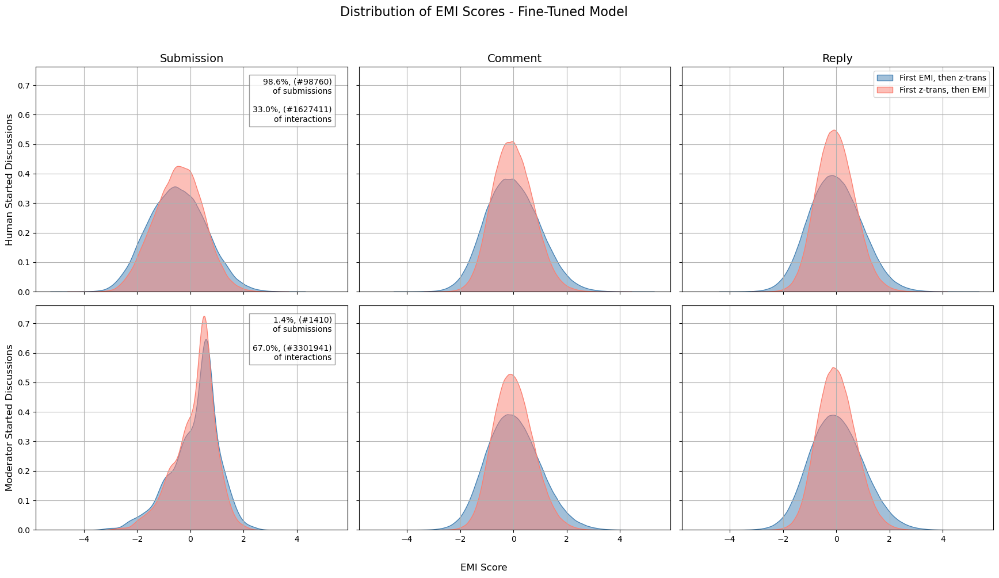

In [16]:
plot_EMI_grid(interactions_all, title = "Distribution of EMI Scores - Fine-Tuned Model", model = "finetuned", save = True, filepath = "plots/Distribution_EMI_Mod_noMod_finetuned.pdf")

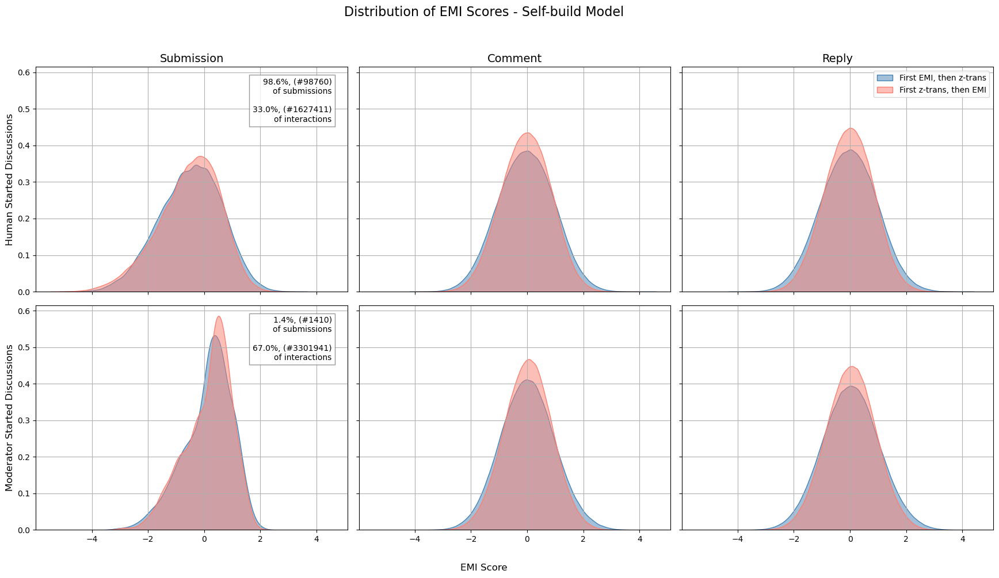

In [17]:
# robustness check on self build model

plot_EMI_grid(interactions_all, title = "Distribution of EMI Scores - Self-build Model", model = "self", save = True, filepath = "plots/Distribution_EMI_Mod_noMod_self.pdf")

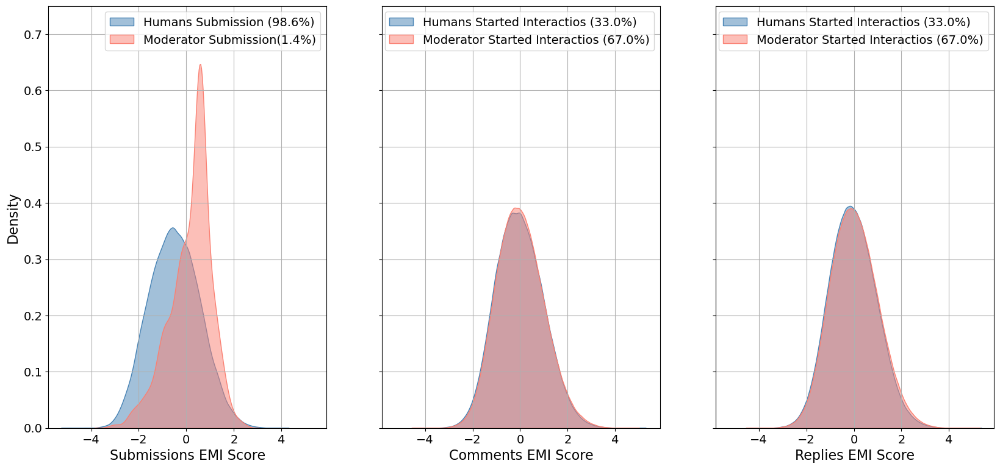

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(20, 9), sharex=True, sharey=True)
#fig.suptitle("Distribution of EMI Scores across between Humans and Moderators", fontsize=16)

human_sub_share = (len(interactions_all[interactions_all["Mod_Dummy"] == 0].drop_duplicates(subset = "submission_id")) / len(interactions_all.drop_duplicates(subset = "submission_id"))) * 100
mod_sub_share = (len(interactions_all[interactions_all["Mod_Dummy"] == 1].drop_duplicates(subset = "submission_id")) / len(interactions_all.drop_duplicates(subset = "submission_id"))) * 100

human_interact_share = (len(interactions_all[interactions_all["Mod_Dummy"] == 0]) / len(interactions_all)) * 100
mod_interact_share = (len(interactions_all[interactions_all["Mod_Dummy"] == 1]) / len(interactions_all)) * 100

sns.kdeplot(data=interactions_all[interactions_all["Mod_Dummy"] == 0].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"], ax = axes[0], label=f'Humans Submission ({human_sub_share:.1f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all["Mod_Dummy"] == 1].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"], ax = axes[0], label=f'Moderator Submission({mod_sub_share:.1f}%)', color='salmon', fill=True, alpha=0.5)

axes[0].set_xlabel("Submissions EMI Score", fontsize = 16)
axes[0].set_ylabel("Density", fontsize = 16)
axes[0].legend(fontsize = 14)
#axes[0].set_title(f"Submissions EMI Score", fontsize = 14)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=14)
axes[0].set_ylim(0, 0.7)



sns.kdeplot(data=interactions_all[interactions_all["Mod_Dummy"] == 0].drop_duplicates(subset = "msg_id_parent")[f"finetuned_parent_len_EMI_z_trans"], ax = axes[1], label=f'Humans Started Interactios ({human_interact_share:.1f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all["Mod_Dummy"] == 1].drop_duplicates(subset = "msg_id_parent")[f"finetuned_parent_len_EMI_z_trans"], ax = axes[1], label=f'Moderator Started Interactios ({mod_interact_share:.1f}%)', color='salmon', fill=True, alpha=0.5)

axes[1].set_xlabel("Comments EMI Score", fontsize = 16)
axes[1].set_ylabel("Density", fontsize = 16)
axes[1].legend(fontsize = 14)
#axes[1].set_title(f"Comments EMI Score", fontsize = 14)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=14)
axes[1].set_ylim(0, 0.7)


sns.kdeplot(data=interactions_all[interactions_all["Mod_Dummy"] == 0][f"finetuned_child_len_EMI_z_trans"], ax = axes[2], label=f'Humans Started Interactios ({human_interact_share:.1f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all["Mod_Dummy"] == 1][f"finetuned_child_len_EMI_z_trans"], ax = axes[2], label=f'Moderator Started Interactios ({mod_interact_share:.1f}%)', color='salmon', fill=True, alpha=0.5)

axes[2].set_xlabel("Replies EMI Score", fontsize = 16)
axes[2].set_ylabel("Density", fontsize = 16)
axes[2].legend(fontsize = 14)
#axes[2].set_title(f"Replies EMI Score", fontsize = 14)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=14)
axes[2].set_ylim(0, 0.75)


#sns.kdeplot(data=interactions_all[interactions_all["Mod_Dummy"] == 0][f"mean_EMI_interaction_ft_EMI_z"], ax = axes[3], label=f'Humans Started Interactios ({human_interact_share:.1f}%)', color='steelblue', fill=True, alpha=0.5)
#sns.kdeplot(data=interactions_all[interactions_all["Mod_Dummy"] == 1][f"mean_EMI_interaction_ft_EMI_z"], ax = axes[3], label=f'Moderator Started Interactios ({mod_interact_share:.1f}%)', color='salmon', fill=True, alpha=0.5)
#axes[3].set_xlabel("Interactions Mean EMI Score", fontsize = 12)
#axes[3].set_ylabel("Density", fontsize = 12)
#axes[3].legend()
#axes[3].set_title(f"Interactions Mean EMI", fontsize = 14)
#axes[3].grid(True)

plt.savefig("plots/Distribution_EMI_Human_Moderator.pdf", bbox_inches='tight')


In [15]:
print("Number of unique mod submissions", len(interactions_all[interactions_all["Mod_Dummy"] == 1].drop_duplicates(subset = "submission_id")))
print("Number of unique human submissions", len(interactions_all[interactions_all["Mod_Dummy"] == 0].drop_duplicates(subset = "submission_id")))

Number of unique mod submissions 1410
Number of unique human submissions 98760


In [20]:
# 1410 submissions of 100.170 are a share of
len(interactions_all[interactions_all["Mod_Dummy"] == 1].drop_duplicates(subset = "submission_id")) / len(interactions_all.drop_duplicates(subset = "submission_id"))

0.014076070679844266

In [21]:
print("Number of interactions, resulting from the", len(interactions_all[interactions_all["Mod_Dummy"] == 1].drop_duplicates(subset = "submission_id")),  "mod-started discussions", len(interactions_all[interactions_all["Mod_Dummy"] == 1]))

print("Number of interactions, resulting from the", len(interactions_all[interactions_all["Mod_Dummy"] == 0].drop_duplicates(subset = "submission_id")),  "human-started discussions", len(interactions_all[interactions_all["Mod_Dummy"] == 0]))


Number of interactions, resulting from the 1410 mod-started discussions 3301941
Number of interactions, resulting from the 98760 human-started discussions 1627411


In [22]:
# share of interactions 
print(len(interactions_all[interactions_all["Mod_Dummy"] == 1]) / len(interactions_all))
print(len(interactions_all[interactions_all["Mod_Dummy"] == 0]) / len(interactions_all))

0.6698529543031214
0.33014704569687864


In [16]:
len(interactions_all)
len(interactions_all[interactions_all["Mod_Dummy"] == 1])

len(interactions_all.drop_duplicates(subset = "submission_id"))

100170

**Interpretation**

* Few moderator submissions (#1410):
    * these 1410 submissions are a share of 1,5% of all submissions
    * but their share of interactions is 67%
 
* Human startes discussions (#98.760):
    * share of 98,5 %
    * their share of interactions is 33%
 
***

* EMI distribution of moderators is clearly different from the non-moderators
    * Mod Submission is way more evidence based speaking 
* EMI Score of Comment & replies EMI however is almost equal

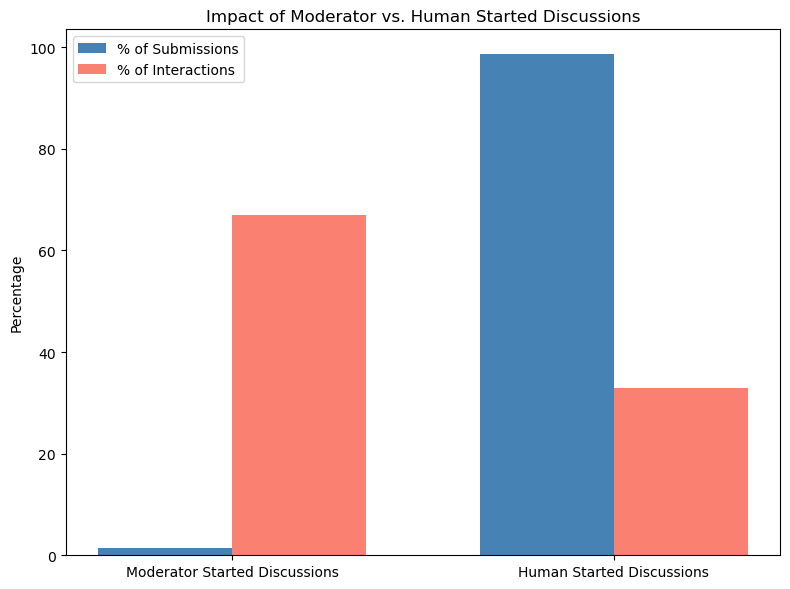

In [17]:

# Example data
data = pd.DataFrame({
    'submission_type': ['Moderator Started Discussions', 'Human Started Discussions'],
    'submission_share': [len(interactions_all[interactions_all["Mod_Dummy"] == 1].drop_duplicates(subset = "submission_id")) / len(interactions_all.drop_duplicates(subset = "submission_id")),
                         len(interactions_all[interactions_all["Mod_Dummy"] == 0].drop_duplicates(subset = "submission_id")) / len(interactions_all.drop_duplicates(subset = "submission_id"))],
    'interaction_share': [len(interactions_all[interactions_all["Mod_Dummy"] == 1]) / len(interactions_all), 
                          len(interactions_all[interactions_all["Mod_Dummy"] == 0]) / len(interactions_all)]
})

# Convert to %
data[['submission_share', 'interaction_share']] *= 100

# Plot
plt.figure(figsize=(8, 6))
bar_width = 0.35
x = range(len(data))

plt.bar(x, data['submission_share'], width=bar_width, label='% of Submissions', color='steelblue')
plt.bar([p + bar_width for p in x], data['interaction_share'], width=bar_width, label='% of Interactions', color='salmon')

plt.xticks([p + bar_width/2 for p in x], data['submission_type'])
plt.ylabel('Percentage')
plt.title('Impact of Moderator vs. Human Started Discussions')
plt.legend()
plt.tight_layout()
plt.show()


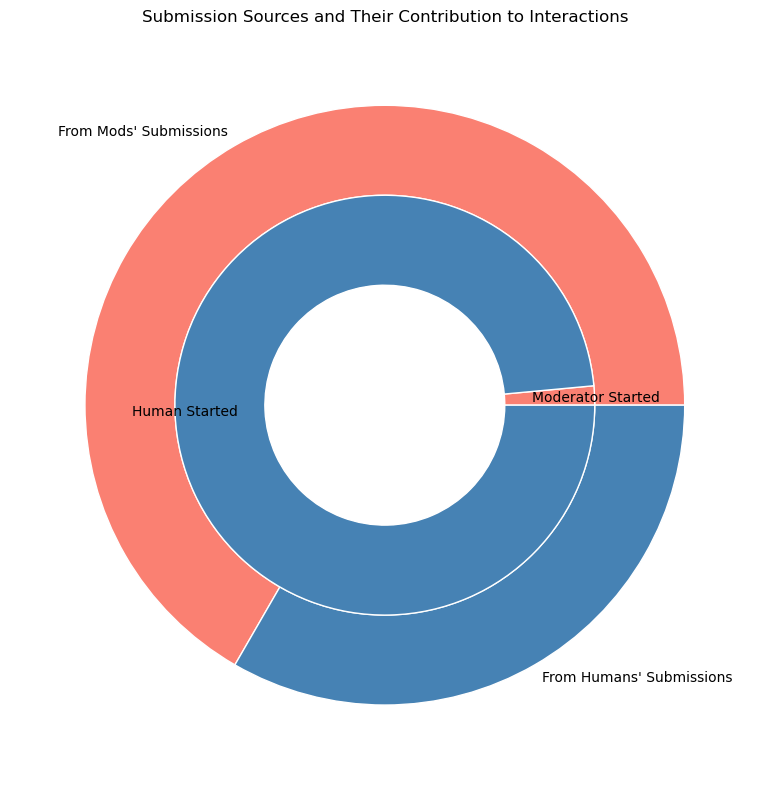

In [25]:
# Example data (replace with your actual counts)
submission_labels = ['Moderator Started', 'Human Started']
submission_counts = [1410, 94150]  # Inner ring (submissions)

interaction_labels = ['From Mods\' Submissions', 'From Humans\' Submissions']
interaction_counts = [62000, 31000]  # Outer ring (interactions)

# Colors for consistency between rings
colors = ['salmon', 'steelblue']

fig, ax = plt.subplots(figsize=(8, 8))

# --- Outer Ring (Interactions) ---
ax.pie(
    interaction_counts,
    radius=1,
    labels=interaction_labels,
    labeldistance=1.05,
    colors=colors,
    wedgeprops=dict(width=0.3, edgecolor='white')
)

# --- Inner Ring (Submissions) ---
ax.pie(
    submission_counts,
    radius=0.7,
    labels=submission_labels,
    labeldistance=0.7,
    colors=colors,
    wedgeprops=dict(width=0.3, edgecolor='white')
)

# Optional: Add a center circle for a cleaner look
centre_circle = plt.Circle((0, 0), 0.4, fc='white')
fig.gca().add_artist(centre_circle)

plt.title("Submission Sources and Their Contribution to Interactions")
plt.tight_layout()
plt.show()

### **Check by Subreddit**

In [96]:
test = interactions_all[interactions_all["subreddit"] == "Ask_Politics"]
test[test["Mod_Dummy"] == 1].drop_duplicates(subset="submission_id")["finetuned_submission_len_EMI_z_trans"]

31241    0.585194
31330    0.585194
31480    0.533273
31746    0.533273
31898    0.585194
32321    0.585194
32924    0.585194
33932    0.585194
34370    0.585194
34518    0.585194
35539    0.585194
35674    0.585194
36008    0.585194
36159    0.585194
36266    0.585194
36340    0.533273
36564    0.533273
37328    0.585194
38619    0.533273
39243    0.533273
39682    0.533273
39768    0.585194
40795    0.585194
41104    0.585194
42270    0.585194
45106    0.585194
45319    0.533273
45497    0.585194
45587    0.533273
45876    0.533273
45949    0.585194
46140    0.585194
46501    0.585194
Name: finetuned_submission_len_EMI_z_trans, dtype: float64

In [90]:
def plot_EMI_grid_subreddit(df, title="Distribution of EMI Scores", model = "finetuned", save = False, filepath = "plots/Distribution_EMI_by_Subr_finetuned.pdf"):


    fig, axes = plt.subplots(6, 3, figsize=(17, 17), sharex=True)
    axes = np.atleast_2d(axes)
    #fig.suptitle(title, fontsize=16)

    row_labels = ['politics', 'PoliticalDebate', 'Ask_Politics', 'Askpolitics', 'PoliticalDiscussion', 'NeutralPolitics']
    col_labels = ['Submission', 'Comment', 'Reply']
    text_types = ['submission', 'parent', 'child']
    #models = ['finetuned', 'self']

    for row_idx, subr in enumerate(row_labels):  # 0 for unmoderated, 1 for moderated
        # Filter the dataframe for the subreddit only
        filtered_df = df[df["subreddit"] == subr]

        filtered_df_human = filtered_df[filtered_df["Mod_Dummy"] == 0]
        filtered_df_mod = filtered_df[filtered_df["Mod_Dummy"] == 1]

        # Ensure only unique messages per type
        unique_df_human = {
            "submission": filtered_df_human.drop_duplicates(subset="submission_id"),
            "parent": filtered_df_human.drop_duplicates(subset="msg_id_parent"),
            "child": filtered_df_human.drop_duplicates(subset="msg_id_child")
        }

        unique_df_mod = {
            "submission": filtered_df_mod.drop_duplicates(subset="submission_id"),
            "parent": filtered_df_mod.drop_duplicates(subset="msg_id_parent"),
            "child": filtered_df_mod.drop_duplicates(subset="msg_id_child")
        }

        for col_idx, text_type in enumerate(text_types):
            
            ax = axes[row_idx, col_idx]
            ax.tick_params(axis='both', labelsize=16)

            sns.kdeplot(data=unique_df_human[text_type][f"{model}_{text_type}_len_EMI_z_trans"], ax=ax, label='Human', color='steelblue', fill=True, alpha=0.5)

            if len(unique_df_mod) > 0:
                sns.kdeplot(data=unique_df_mod[text_type][f"{model}_{text_type}_len_EMI_z_trans"], ax=ax, label='Moderator', color='salmon', fill=True, alpha=0.5)

            if row_idx == 0:
                ax.set_title(col_labels[col_idx], fontsize=18)
            if col_idx == 0:
                ax.set_ylabel(row_labels[row_idx], fontsize=18)
            if col_idx > 0:
                ax.set_ylabel("")

            if row_idx == 0 and col_idx == 2:
                ax.legend(loc='upper right', fontsize = 16)

            ax.grid(True)
            ax.set_xlabel("")
            

    # Common X label
    fig.text(0.5, -0.002, 'EMI Score', ha='center', fontsize=18)
    plt.tight_layout(rect=[0.03, 0.03, 1, 0.95])
    if save == True:
        plt.savefig(filepath)
    plt.show()



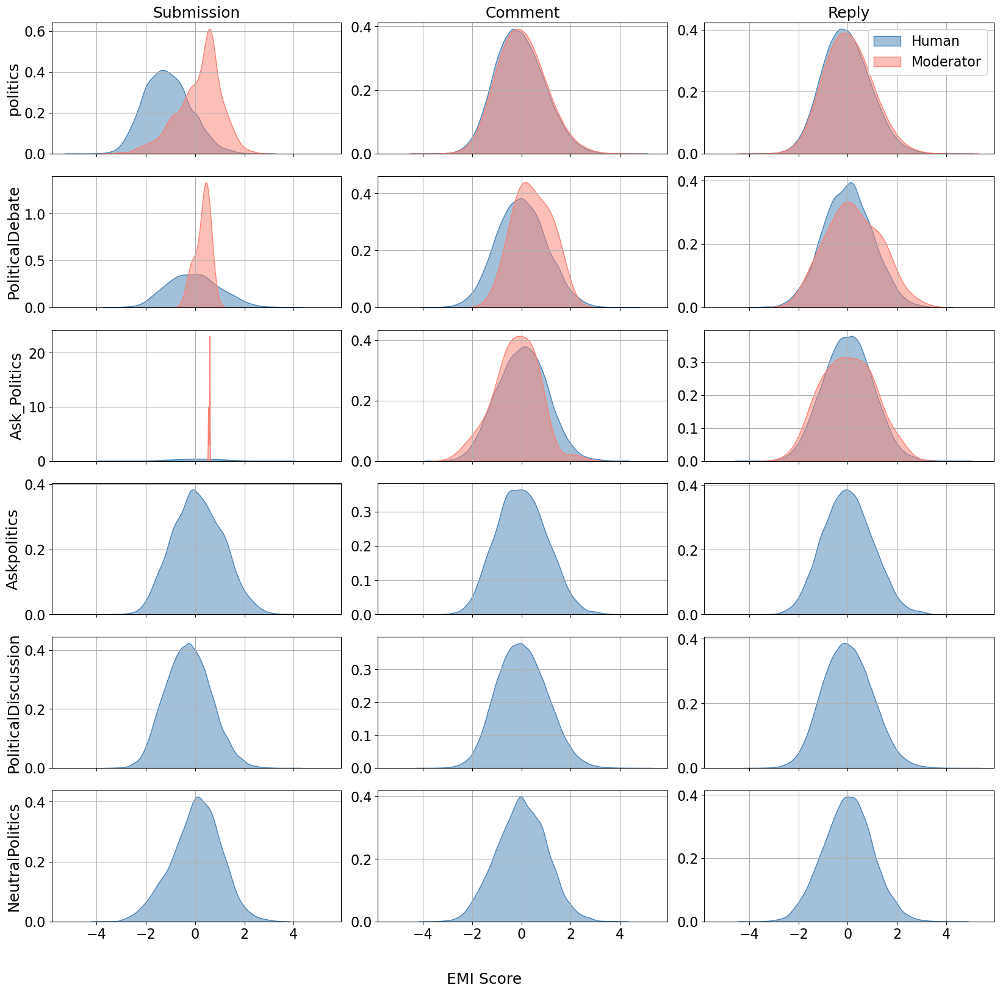

In [91]:
plot_EMI_grid_subreddit(interactions_all, title = "Distribution of EMI Scores per Subreddit\n Fine-tuned Model", model = "finetuned", save = True, filepath = "plots/Distribution_EMI_by_Subr_finetuned.pdf")

##### **By Mods and Subreddit**

In [20]:
politics = interactions_all[interactions_all["subreddit"] == "politics"]
politics["Mod_Dummy"].value_counts()

Mod_Dummy
1    3301841
0     862618
Name: count, dtype: int64

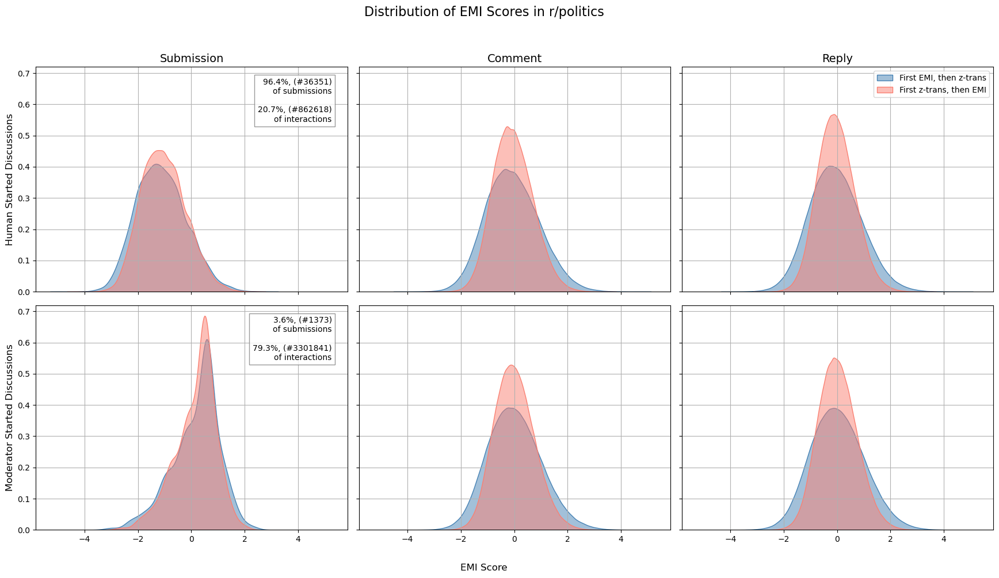

In [22]:
plot_EMI_grid(politics, title = "Distribution of EMI Scores in r/politics", model = "finetuned", save = True, filepath = "plots/Distribution_EMI_politics_finetuned.pdf")

In [15]:

def get_counts_and_shares(df, column):
    return df[column].value_counts().to_frame('Count').join(df[column].value_counts(normalize=True).to_frame('%')).reset_index()


print("Share of Interactions by Subreddit")
interactions_subr = get_counts_and_shares(interactions_all, "subreddit")
interactions_subr

Share of Interactions by Subreddit


,subreddit,Count,%
0,politics,4164459,0.844829
1,PoliticalDiscussion,655653,0.133010
2,Ask_Politics,52308,0.010612
3,NeutralPolitics,42308,0.008583
4,PoliticalDebate,8454,0.001715
5,Askpolitics,6170,0.001252


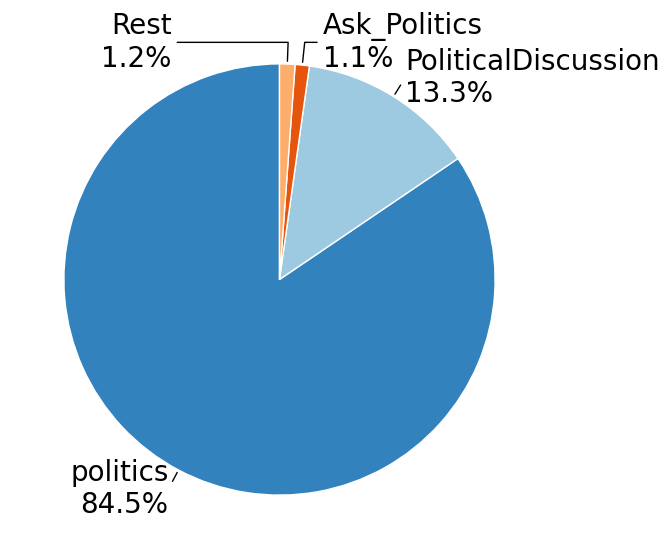

In [76]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

subreddits = interactions_subr['subreddit'].tolist()

def collapse_small_categories(df, label_col='subreddit', value_col='%', threshold=0.01):
    small = df[df[value_col] < threshold]
    large = df[df[value_col] >= threshold]
    if not small.empty:
        other = pd.DataFrame({
            label_col: ['Rest'],
            value_col: [small[value_col].sum()]
        })
        df = pd.concat([large, other], ignore_index=True)
    return df

interactions_clean = collapse_small_categories(interactions_subr.copy(), threshold=0.01)

subreddits = list(interactions_clean['subreddit'])
colors = plt.get_cmap('tab20c')(range(0, 2 * len(subreddits), 2))

fig, ax = plt.subplots(figsize=(14, 7))
ax.set_aspect('equal')

sub_df = interactions_clean.copy().reset_index(drop=True)

# Identify largest 2 and smallest 2 slices
largest_idx = sub_df['%'].nlargest(2).index
smallest_idx = sub_df['%'].nsmallest(2).index

# Draw pie with no labels
wedges, _ = ax.pie(
    sub_df['%'],
    labels=None,
    colors=colors[:len(sub_df)],
    startangle=90,
    wedgeprops=dict(edgecolor='white')
)

# Manual positions for smallest slices
manual_positions = {
    smallest_idx[0]: (.2, 1.1),  # adjust as needed
    smallest_idx[1]: (-.5, 1.1)
}

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1) / 2.0 + p.theta1
    x = np.cos(np.deg2rad(ang))
    y = np.sin(np.deg2rad(ang))

    if i in smallest_idx:
        # Use fixed coordinates
        text_x, text_y = manual_positions[i]
        ha = 'left' if text_x > 0 else 'right'
    elif i in largest_idx:
        # Place close to default position (just outside slice)
        text_x, text_y = 1.1 * x, 1.1 * y
        ha = 'left' if x > 0 else 'right'
    else:
        # Auto placement slightly further outside
        text_x, text_y = 1.35 * x, 1.35 * y
        ha = 'left' if x > 0 else 'right'

    ax.annotate(
        f"{sub_df.loc[i, 'subreddit']}\n{sub_df.loc[i, '%']*100:.1f}%",
        xy=(x, y),
        xytext=(text_x, text_y),
        ha=ha,
        va='center',
        fontsize=20,
        arrowprops=dict(
            arrowstyle='-',
            connectionstyle=f"angle,angleA=0,angleB={ang}",
            lw=1
        )
    )

plt.savefig(
    "plots/Interactions_Shares_Subreddit.pdf",
    bbox_inches='tight',
    pad_inches=0.05
)


In [20]:
def get_counts_and_shares(df, column):
    return df[column].value_counts().to_frame('Count').join(
        df[column].value_counts(normalize=True).to_frame('%')
    ).reset_index().rename(columns={'index': column})

# Step 1: Overall share of interactions by subreddit
interactions_subr = get_counts_and_shares(interactions_all, "subreddit")

# Step 2: Share of moderated interactions (Mod_Dummy == 1) per subreddit
mod_counts = (
    interactions_all[interactions_all['Mod_Dummy'] == 1]
    .groupby('subreddit')
    .size()
    .to_frame('Mod_Count')
)

# Step 3: Merge moderated counts into overall table
interactions_subr = interactions_subr.merge(mod_counts, on='subreddit', how='left')

# Fill NaN (i.e., no mod interactions) with 0
interactions_subr['Mod_Count'] = interactions_subr['Mod_Count'].fillna(0).astype(int)

# Step 4: Calculate share of moderated interactions per subreddit
interactions_subr['Mod_Share_in_Subreddit'] = interactions_subr['Mod_Count'] / interactions_subr['Count']

# Optional: overall moderated interaction share across dataset
overall_mod_share = interactions_subr['Mod_Count'].sum() / interactions_subr['Count'].sum()
print(f"Overall Moderated Interaction Share: {overall_mod_share:.2%}")

# Display the final dataframe
interactions_subr


Overall Moderated Interaction Share: 66.99%


,subreddit,Count,%,Mod_Count,Mod_Share_in_Subreddit
0,politics,4164459,0.844829,3301841,0.792862
1,PoliticalDiscussion,655653,0.133010,0,0.000000
2,Ask_Politics,52308,0.010612,71,0.001357
3,NeutralPolitics,42308,0.008583,0,0.000000
4,PoliticalDebate,8454,0.001715,29,0.003430
5,Askpolitics,6170,0.001252,0,0.000000


In [21]:
print("Share of Submissions by Subreddit")
submissions_subr = get_counts_and_shares(interactions_all.drop_duplicates(subset = "submission_id"), "subreddit")
submissions_subr

Share of Submissions by Subreddit


,subreddit,Count,%
0,PoliticalDiscussion,38476,0.384107
1,politics,37724,0.376600
2,Ask_Politics,16083,0.160557
3,NeutralPolitics,4412,0.044045
4,Askpolitics,2862,0.028571
5,PoliticalDebate,613,0.006120


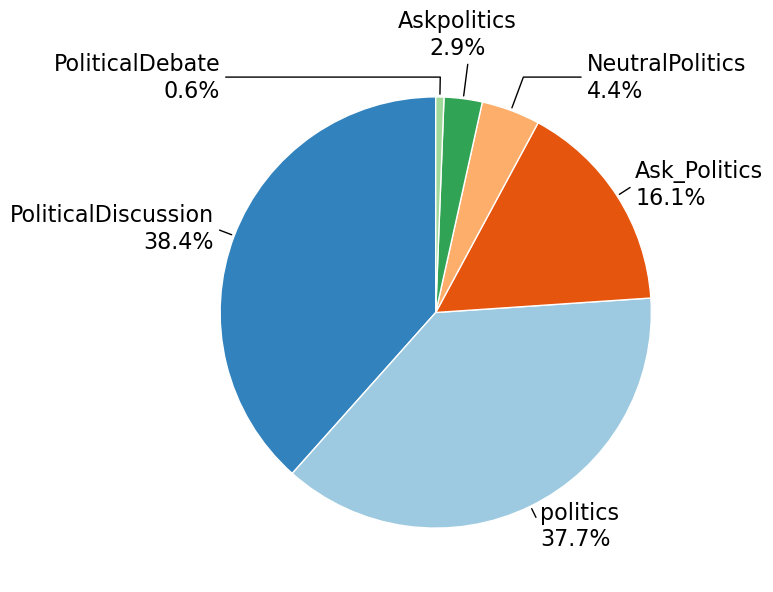

In [77]:
import numpy as np
import matplotlib.pyplot as plt

subreddits = list(submissions_subr['subreddit'])  # use cleaned list for coloring
colors = plt.get_cmap('tab20c')(range(0, 2 * len(subreddits), 2))

fig, ax = plt.subplots(figsize=(14, 7))
ax.set_aspect('equal')

sub_df = submissions_subr.copy().reset_index(drop=True)

# Sort by % to identify top 3
largest_idx = sub_df['%'].nlargest(3).index
small_slices = [i for i in range(len(sub_df)) if i not in largest_idx]

wedges, _ = ax.pie(
    sub_df['%'],
    labels=None,  # no built-in labels at all
    colors=colors[:len(sub_df)],
    startangle=90,
    wedgeprops=dict(edgecolor='white')
)

# Predefine positions for small slices (left, center, right)
positions = {
    "left":  (-1, 1),
    "center": (0.1, 1.2),
    "right": (0.7, 1)
}
pos_keys = ["right", "center", "left"]

# 1️⃣ Small slices → manual fixed positions
for i, slice_idx in enumerate(small_slices):
    p = wedges[slice_idx]
    ang = (p.theta2 - p.theta1) / 2. + p.theta1
    x = np.cos(np.deg2rad(ang))
    y = np.sin(np.deg2rad(ang))

    pos_key = pos_keys[i % len(pos_keys)]
    text_x, text_y = positions[pos_key]

    ax.annotate(
        f"{sub_df.loc[slice_idx, 'subreddit']}\n{sub_df.loc[slice_idx, '%']*100:.1f}%",
        xy=(x, y),
        xytext=(text_x, text_y),
        ha='center' if pos_key == "center" else ('left' if pos_key == "right" else 'right'),
        fontsize=16,
        arrowprops=dict(arrowstyle='-', connectionstyle=f"angle,angleA=0,angleB={ang}", lw=1)
    )

# 2️⃣ Large slices → auto outside placement but with arrows
for slice_idx in largest_idx:
    p = wedges[slice_idx]
    ang = (p.theta2 - p.theta1) / 2. + p.theta1
    x = np.cos(np.deg2rad(ang))
    y = np.sin(np.deg2rad(ang))

    # Position label further out along wedge angle
    label_distance = 1.1
    text_x = label_distance * x
    text_y = label_distance * y

    ax.annotate(
        f"{sub_df.loc[slice_idx, 'subreddit']}\n{sub_df.loc[slice_idx, '%']*100:.1f}%",
        xy=(x, y),
        xytext=(text_x, text_y),
        ha='left' if x > 0 else 'right',
        va='center',
        fontsize=16,
        arrowprops=dict(arrowstyle='-', connectionstyle=f"angle,angleA=0,angleB={ang}", lw=1)
    )

plt.savefig(
    "plots/Submission_Shares_Subreddit.pdf",
    bbox_inches='tight',
    pad_inches=0.05
)


In [35]:
def get_counts_and_shares(df, column):
    return df[column].value_counts().to_frame('Count').join(
        df[column].value_counts(normalize=True).to_frame('%')
    ).reset_index().rename(columns={'index': column})

# Step 1: Overall share of interactions by subreddit
interactions_subr = get_counts_and_shares(interactions_all.drop_duplicates(subset = "submission_id"), "subreddit")

# Step 2: Share of moderated interactions (Mod_Dummy == 1) per subreddit
mod_counts = (
    interactions_all.drop_duplicates(subset = "submission_id")[interactions_all['Mod_Dummy'] == 1]
    .groupby('subreddit')
    .size()
    .to_frame('Mod_Count')
)

# Step 3: Merge moderated counts into overall table
interactions_subr = interactions_subr.merge(mod_counts, on='subreddit', how='left')

# Fill NaN (i.e., no mod interactions) with 0
interactions_subr['Mod_Count'] = interactions_subr['Mod_Count'].fillna(0).astype(int)

# Step 4: Calculate share of moderated interactions per subreddit
interactions_subr['Mod_Share_in_Subreddit'] = interactions_subr['Mod_Count'] / interactions_subr['Count']

# Optional: overall moderated interaction share across dataset
overall_mod_share = interactions_subr['Mod_Count'].sum() / interactions_subr['Count'].sum()
print(f"Overall Moderated Interaction Share: {overall_mod_share:.2%}")

# Display the final dataframe
interactions_subr


Overall Moderated Interaction Share: 1.41%


/tmp/ipykernel_364/2541642712.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  interactions_all.drop_duplicates(subset = "submission_id")[interactions_all['Mod_Dummy'] == 1]


,subreddit,Count,%,Mod_Count,Mod_Share_in_Subreddit
0,PoliticalDiscussion,38476,0.384107,0,0.000000
1,politics,37724,0.376600,1373,0.036396
2,Ask_Politics,16083,0.160557,33,0.002052
3,NeutralPolitics,4412,0.044045,0,0.000000
4,Askpolitics,2862,0.028571,0,0.000000
5,PoliticalDebate,613,0.006120,4,0.006525


In [36]:
# group by mod and id
submission_level = (
    interactions_all
    .groupby(['submission_id', 'Mod_Dummy'])
    .agg(
        num_comments=('msg_id_parent', pd.Series.nunique),
        num_replies=('msg_id_child', pd.Series.nunique)
    )
    .reset_index()
)

# now group by mod
mean_counts_by_mod = (
    submission_level
    .groupby('Mod_Dummy')
    .agg(
        num_submissions=('submission_id', 'count'),  
        mean_comments=('num_comments', 'mean'),
        mean_replies=('num_replies', 'mean')
    )
    .rename(index={0: 'Human', 1: 'Moderator'})
    .T  # Transpose for nice display
)

mean_counts_by_mod

Mod_Dummy,Human,Moderator
num_submissions,98760.000000,1410.000000
mean_comments,8.124797,829.367376
mean_replies,16.478443,2341.802128


### **Shares of Disagreement**

compare EMI distribution of comments and replies below human vs. non human submissions
compare shares of disagreement



In [15]:

def get_counts_and_shares(df, column):
    return df[column].value_counts().to_frame('Count').join(df[column].value_counts(normalize=True).to_frame('%')).reset_index()

print("Human started Discussions")
get_counts_and_shares(interactions, "predictions_ft")

Human started Discussions


,predictions_ft,Count,%
0,no_disagreement,1082700,0.66529
1,disagree,544711,0.33471


In [16]:
print("Moderator started Discussions")
get_counts_and_shares(mod_interactions, "predictions_ft")

Moderator started Discussions


,predictions_ft,Count,%
0,no_disagreement,2528422,0.765738
1,disagree,773519,0.234262


In [17]:
print("All")
get_counts_and_shares(interactions_all, "predictions_ft")

All


,predictions_ft,Count,%
0,no_disagreement,3611122,0.732575
1,disagree,1318230,0.267425


**Final Interpretation**

* Moderator started discussions are different that human started discussion
    * They are a few (1.5% of submissions are moderators), but they account for a huge share of interactions (67%)
    * Even more, at subreddit level: for politics 80% of interactions are below mod submissions, but mod submissions are only 3% of submissions
    * Their level of activenedd is was higher: 100 times more comments
* We see that mod submissions are way more E-speaking than human submissions
* Disrtibution of EMI in comments and replies of mod- vs. human interactions are the same

* Shares of disagreement are lower on mod started interactions

$\to$ treat mod discussions separately

$\to$ in model building, add mod dummy and potentially mod dummy interaction with subreddit and one with EMI (next step suggests: mod discussions: EMI more predictive of stance)

***
# **EMI and Stance**

## **Submissions EMI and Stance**

In [18]:
interactions.columns
interactions_red = interactions[['msg_id_parent', 'msg_id_child', 'submission_id', 'subreddit', 'author_child', 'author_parent', 'author_submission',
                                'predictions_score_ft', 'predictions_ft', 'prob_disagree',
                                 'parent_partisan', 'child_partisan', 'submission_partisan',
                                 'mean_EMI_interaction_ft_EMI_z', 'mean_EMI_interaction_sb_EMI_z']]

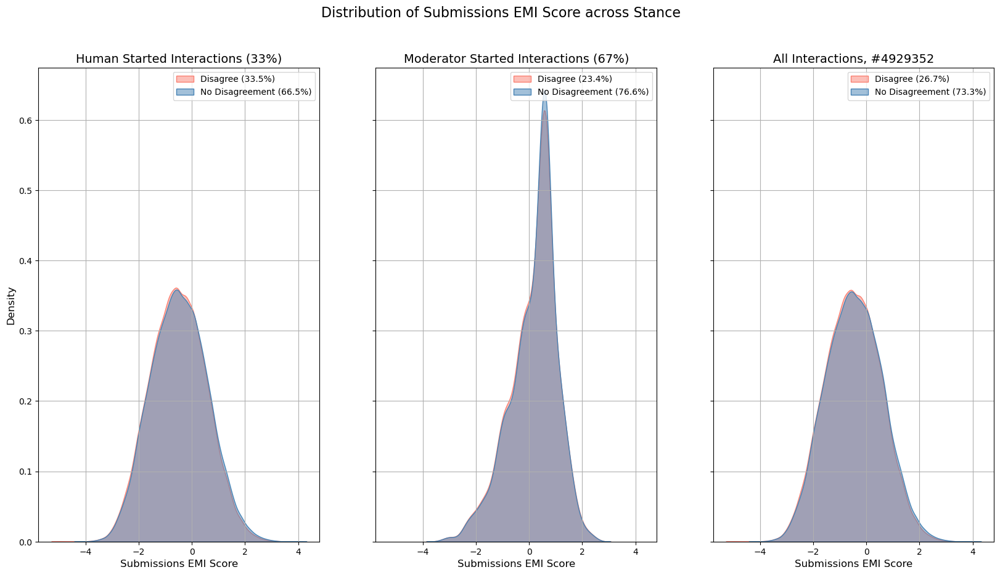

In [41]:
# check: parents EMI score related to interactions stance?
# drop parents by parent_id


fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
fig.suptitle("Distribution of Submissions EMI Score across Stance", fontsize=16)


human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
human_share_no_disagree = len(interactions[interactions['predictions_ft'] == "no_disagreement"]) / len(interactions)

sns.kdeplot(data=interactions[interactions['predictions_ft'] == "disagree"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"], ax = axes[0], label=f'Disagree ({human_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "no_disagreement"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"],  ax = axes[0], label=f'No Disagreement ({human_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[0].set_xlabel("Submissions EMI Score", fontsize = 12)
axes[0].set_ylabel("Density", fontsize = 12)
axes[0].legend()
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[0].grid(True)

mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
mod_share_no_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"]) / len(mod_interactions)

sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "disagree"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"], ax = axes[1], label=f'Disagree ({mod_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"],  ax = axes[1], label=f'No Disagreement ({mod_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[1].set_xlabel("Submissions EMI Score", fontsize = 12)
axes[1].set_ylabel("Density", fontsize = 12)
axes[1].legend()
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[1].grid(True)

all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
all_share_no_disagree = len(interactions_all[interactions_all['predictions_ft'] == "no_disagreement"]) / len(interactions_all)

sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "disagree"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"], ax = axes[2], label=f'Disagree ({all_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "no_disagreement"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"],  ax = axes[2], label=f'No Disagreement ({all_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[2].set_xlabel("Submissions EMI Score", fontsize = 12)
axes[2].set_ylabel("Density", fontsize = 12)
axes[2].legend()
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize = 14)
axes[2].grid(True)

plt.savefig("plots/Distribution_Submissions_EMI_by_Stance.pdf")


**Interpretation**

* Moderator Submissions are a lot more evidence based, compared to human started discussions
* Across Stance, distribution of EMI scores of submission sis equal
* No tendency of submissions EMI to influence the stance
* $\to$ the moderator submissions will be the same for plotting both density curves.
* $\to$ the same submission appears in disagree and no disagree interactions, and duplicates are dropped
* (correlation of submissions EMI and mean disagreement probability, over all below interactions?)

$\to$ kind of useless, as submissions can feature both, agreement and disacgreement interactions so they add to the distribution of both = no patterns

In [97]:
interactions = interactions.rename(columns = {"predictions_label_ft" :'disagreement_label'}) 
interactions

mod_interactions = mod_interactions.rename(columns = {"predictions_label_ft" :'disagreement_label'}) 
mod_interactions

interactions_all = interactions_all.rename(columns = {"predictions_label_ft" :'disagreement_label'}) 
interactions_all

,msg_id_parent,msg_id_child,submission_id,subreddit,exact_time_child,author_child,author_parent,author_submission,finetuned_child_E_norm,finetuned_child_I_norm,...,predictions_ft,parent_partisan,child_partisan,submission_partisan,prob_disagree,Mod_Dummy,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI
0,c7ecp8d,c7ecs2n,14m325,Ask_Politics,1355166551.0,karmanaut,ramblin_dash,karmanaut,0.053025,0.072843,...,no_disagreement,0.017145,0.004449,0.004449,0.38180,0,0.121790,0.198901,0.355153,0.306327
1,c7ecp8d,c7ecxpk,14m325,Ask_Politics,1355167049.0,zoolander951,ramblin_dash,karmanaut,0.040605,0.001874,...,no_disagreement,0.017145,0.030790,0.004449,0.28640,0,0.465924,0.439166,0.368204,0.318487
2,c7ecp8d,c7eflag,14m325,Ask_Politics,1355175187.0,zossima,ramblin_dash,karmanaut,0.037034,-0.026841,...,no_disagreement,0.017145,-0.037449,0.004449,0.34180,0,0.613707,0.543173,0.718835,0.612462
3,c7efx8q,c7ejh1d,14m325,Ask_Politics,1355187644.0,fathermocker,senatorskeletor,karmanaut,0.046751,0.040446,...,disagree,0.013507,-0.063784,0.004449,0.95070,0,0.171908,0.183472,0.126254,0.100198
4,c7efx8q,c7f8140,14m325,Ask_Politics,1355286254.0,pkmkii,senatorskeletor,karmanaut,0.029991,-0.043360,...,no_disagreement,0.013507,-0.007571,0.004449,0.14180,0,0.565981,0.457409,0.438123,0.371227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4933850,kfkh5ib,kfmd52k,18uirzt,politics,1970-01-01 00:00:01.703977996,knightforlife,freddiethebaer,optimalg,0.289315,0.222072,...,no_disagreement,-0.073672,0.013192,-0.024883,0.04495,0,1.222498,0.961148,0.986940,0.780210
4933851,kfklsb6,kforzbx,18uirzt,politics,1970-01-01 00:00:01.704023024,bakerfredricka,4blockhead,optimalg,0.192579,0.210383,...,no_disagreement,-0.030104,-0.066138,-0.024883,0.00774,0,0.873822,0.662183,0.528504,0.391975
4933852,kfmq5kr,kfp6tzv,18uirzt,politics,1970-01-01 00:00:01.704032059,glassjar1,doubletfan,optimalg,0.078374,0.101258,...,disagree,-0.024183,-0.019897,-0.024883,0.85000,0,-0.171104,-0.169007,0.051980,0.059937
4933853,kfp3d4v,kfp8xh8,18uirzt,politics,1970-01-01 00:00:01.704033069,haulinboats,4blockhead,optimalg,0.137089,0.224533,...,no_disagreement,-0.030104,0.033772,-0.024883,0.05875,0,-0.083372,-0.008279,-0.250893,-0.290990


In [98]:
human_submission_disagreement_stats = (
    interactions
    .groupby('submission_id')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_submission_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

human_submission_disagreement_stats

mod_submission_disagreement_stats = (
    mod_interactions
    .groupby('submission_id')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_submission_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

mod_submission_disagreement_stats


all_submission_disagreement_stats = (
    interactions_all
    .groupby('submission_id')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_submission_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

all_submission_disagreement_stats

,submission_id,num_interactions,num_disagree,EMI_score,share_disagree
0,1001a3h,30,2,-0.584611,0.066667
1,1001mh,2,1,0.522836,0.500000
2,1003k02,65,26,-1.131063,0.400000
3,10045jv,7,3,0.422146,0.428571
4,1004fx,2,0,-1.040226,0.000000
...,...,...,...,...,...
100165,zzlqg,2,0,1.127682,0.000000
100166,zzmjp,1,1,-0.848453,1.000000
100167,zznjb,1,0,0.866848,0.000000
100168,zzpai,1,1,0.337770,1.000000


In [99]:
# get correlation and CIs

def get_r_p_CI(df, x_col, y_col):
    # Clean data
    x = df[x_col]
    y = df[y_col]
    
    mask = (~np.isnan(x)) & (~np.isnan(y)) & (~np.isinf(x)) & (~np.isinf(y))
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Compute Pearson r and p
    r, p = pearsonr(x_clean, y_clean)
    
    # Compute 95% CI using Fisher z-transformation
    n = len(x_clean)
    z = np.arctanh(r)  # Fisher transformation
    se = 1 / np.sqrt(n - 3)
    z_crit = norm.ppf(0.975)  # 95% CI
    
    ci_low_z = z - z_crit * se
    ci_high_z = z + z_crit * se
    ci_low = np.tanh(ci_low_z)  
    ci_high = np.tanh(ci_high_z)
    
    # Format (APA style)
    df = n - 2
    p_str = "p < .001" if p < 0.001 else f"p = {p:.3f}"
    
    print(f"r({df}) = {r:.2f}, 95% CI [{ci_low:.2f}, {ci_high:.2f}], {p_str}")

get_r_p_CI(human_submission_disagreement_stats, "EMI_score", "share_disagree")

get_r_p_CI(mod_submission_disagreement_stats, "EMI_score", "share_disagree")

get_r_p_CI(all_submission_disagreement_stats, "EMI_score", "share_disagree")

r(98750) = -0.06, 95% CI [-0.07, -0.06], p < .001
r(1408) = -0.34, 95% CI [-0.39, -0.30], p < .001
r(100160) = -0.07, 95% CI [-0.07, -0.06], p < .001


Humans: mean comments per submission 8.124797488861887
Humans: mean replies per submission 16.478442689347915
Mods: mean comments per submission 829.3673758865248
Mods: mean replies per submission 2341.8021276595746
Overall: mean comments per submission 19.684666067684937
Overall: mean replies per submission 49.209863232504745


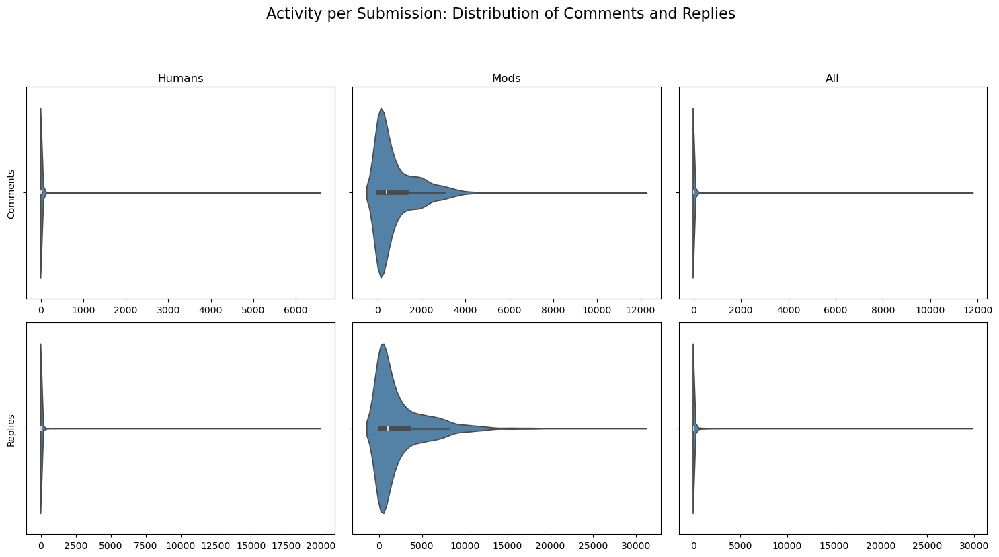

In [100]:
# define a map of submission_id to activity 

activity_human = (
    interactions
    .groupby('submission_id')
    .agg(
        num_comments=('msg_id_parent', 'nunique'),
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)
activity_human

activity_mods = (
    mod_interactions
    .groupby('submission_id')
    .agg(
        num_comments=('msg_id_parent', 'nunique'),
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)

activity_mods

activity_all = (
    interactions_all
    .groupby('submission_id')
    .agg(
        num_comments=('msg_id_parent', 'nunique'),
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)

activity_all

print("Humans: mean comments per submission", activity_human["num_comments"].mean())
print("Humans: mean replies per submission", activity_human["num_replies"].mean())

print("Mods: mean comments per submission", activity_mods["num_comments"].mean())
print("Mods: mean replies per submission", activity_mods["num_replies"].mean())

print("Overall: mean comments per submission", activity_all["num_comments"].mean())
print("Overall: mean replies per submission", activity_all["num_replies"].mean())


datasets = [
    (activity_human, "Humans"),
    (activity_mods, "Mods"),
    (activity_all, "All")
]

# Setup subplots: 2 rows (num_comments, num_replies) x 3 columns (humans, mods, all)
fig, axes = plt.subplots(2, 3, figsize=(15, 8), sharey='row')

for col, (df, title) in enumerate(datasets):
    # Top row: num_comments
    sns.violinplot(
        x=df["num_comments"],
        ax=axes[0, col],
        color="steelblue"
    )
    axes[0, col].set_title(title)
    axes[0, col].set_xlabel("")
    axes[0, col].set_ylabel("Comments" if col == 0 else "")

    # Bottom row: num_replies
    sns.violinplot(
        x=df["num_replies"],
        ax=axes[1, col],
        color="steelblue"
    )
    axes[1, col].set_xlabel("")
    axes[1, col].set_ylabel("Replies" if col == 0 else "")

# Global layout
plt.tight_layout()
plt.suptitle("Activity per Submission: Distribution of Comments and Replies", fontsize=16, y=1.03)
plt.subplots_adjust(top=0.88)
plt.show()

In [120]:
def plot_emi_vs_disagreement(activity_human, activity_mods, activity_all,
                              human_submission_disagreement_stats,
                              mod_submission_disagreement_stats,
                              all_submission_disagreement_stats,
                              interactions, mod_interactions, interactions_all,
                              filter_mode = "mean", quantile=0.8,
                              save_path="plots/Scatter_Submissions_EMI_Stance.png"):
    """
    Plot EMI score vs. disagreement share for human, mod, and all interactions
    based on activity filters (mean or quantile).
    
    Parameters:
        filter_mode (str): 'mean' or 'quantile'
        quantile (float): quantile threshold if filter_mode='quantile'
    """

    # Filtering logic
    if filter_mode == 'mean':
        active_humans = activity_human[activity_human["num_comments"] >= activity_human["num_comments"].mean()]
        active_mods = activity_mods[activity_mods["num_comments"] >= activity_mods["num_comments"].mean()]
        active_all = activity_all[activity_all["num_comments"] >= activity_all["num_comments"].mean()]
        filter_title = "Submissions with More than Average Comments"
    elif filter_mode == 'quantile':
        active_humans = activity_human[activity_human["num_comments"] >= activity_human["num_comments"].quantile(quantile)]
        active_mods = activity_mods[activity_mods["num_comments"] >= activity_mods["num_comments"].quantile(quantile)]
        active_all = activity_all[activity_all["num_comments"] >= activity_all["num_comments"].quantile(quantile)]
        filter_title = f"Submissions with Top {int(quantile * 100)}% Comment Count"
    elif filter_mode == "None":
        active_humans = activity_human.copy()
        active_mods = activity_mods.copy()
        active_all = activity_all.copy()
        filter_title = f"All Submissions"
    else:
        raise ValueError("filter_mode must be 'mean' or 'quantile'")

    # Filter disagreement data
    active_human_interactions = human_submission_disagreement_stats[
        human_submission_disagreement_stats["submission_id"].isin(active_humans["submission_id"])]
    active_mod_interactions = mod_submission_disagreement_stats[
        mod_submission_disagreement_stats["submission_id"].isin(active_mods["submission_id"])]
    active_all_interactions = all_submission_disagreement_stats[
        all_submission_disagreement_stats["submission_id"].isin(active_all["submission_id"])]

    fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
    #fig.suptitle(f"Relation of Submissions EMI Score and Stance\n{filter_title}", fontsize=16)

    # Shared plotting logic
    datasets = [
        ("Human Started Interactions", interactions, active_human_interactions, axes[0], (len(interactions) / len(interactions_all)) * 100),
        ("Moderator Started Interactions", mod_interactions, active_mod_interactions, axes[1], (len(mod_interactions) / len(interactions_all)) * 100),
        ("All Interactions", interactions_all, active_all_interactions, axes[2], None)
    ]

    for title, base_data, active_data, ax, percent in datasets:
        share_disagree = len(base_data[base_data['predictions_ft'] == "disagree"]) / len(base_data)

        sns.regplot(
            data=active_data,
            x="EMI_score", y="share_disagree", ax=ax,
            label=f'Disagreement ({share_disagree*100:.1f}%)',
            scatter_kws={'alpha': 0.5},
            line_kws={'color': 'red'}
        )
        
        valid_data = active_data[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
        if len(valid_data) >= 2:
            r, _ = pearsonr(valid_data["EMI_score"], valid_data["share_disagree"])
            ax.annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18,
                        ha='left', va='top', bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
        else:
            ax.annotate("r = N/A", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18,
                        ha='left', va='top', bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))

        ax.set_xlabel("Submissions EMI Score", fontsize=20)
        ax.set_ylabel("Share of Disagreement", fontsize=20)
        if percent is not None:
            ax.set_title(f"{title} ({percent:.0f}%)", fontsize=20)
        else:
            ax.set_title(f"{title}, #{len(base_data)}", fontsize=20)
        ax.legend(fontsize=18, loc='upper right')  
        ax.grid(True)
        ax.tick_params(axis='both', labelsize=18)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(save_path, dpi=300)
    plt.show()

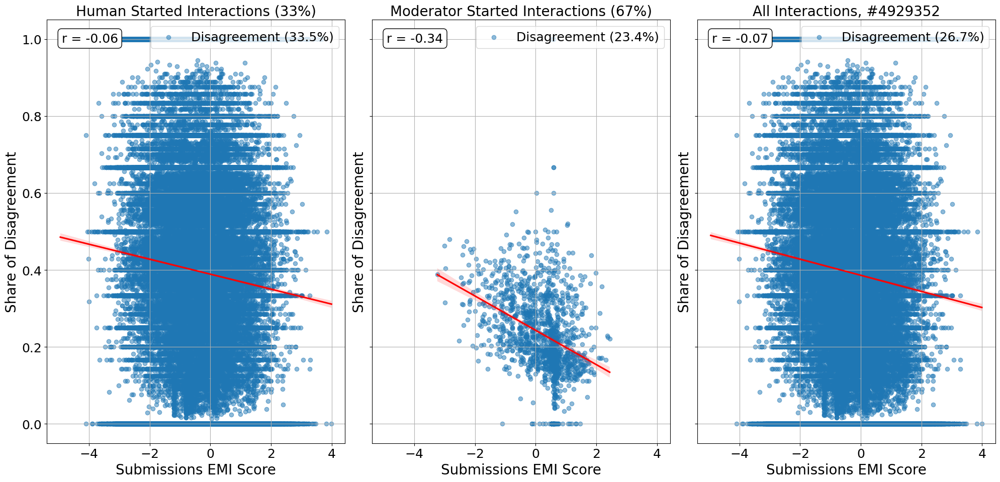

In [121]:
plot_emi_vs_disagreement(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all,
    filter_mode = "None",
    save_path="plots/Scatter_Submissions_EMI_Stance.png"
)


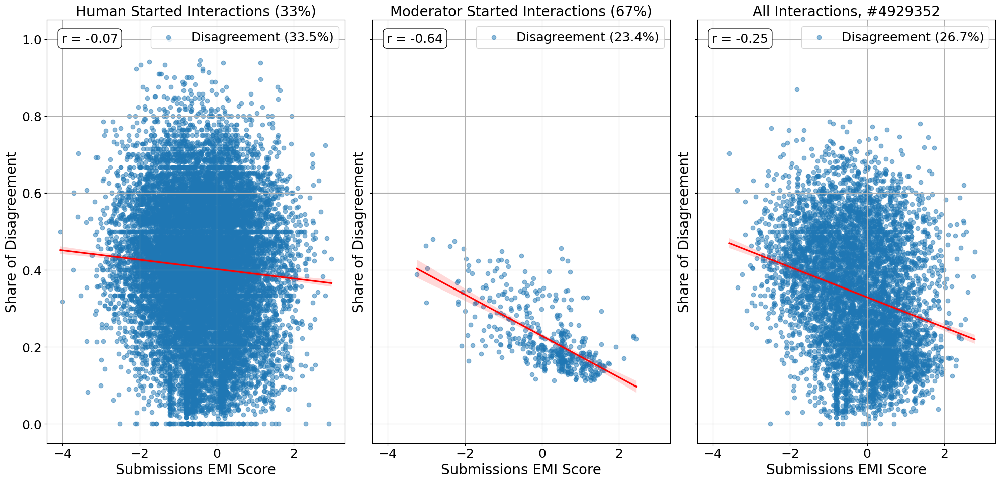

In [122]:
plot_emi_vs_disagreement(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all,
    filter_mode = "mean",
    save_path="plots/Scatter_mean_active_Submissions_EMI_Stance.png"
)


In [123]:
active_humans = activity_human[activity_human["num_comments"] >= activity_human["num_comments"].mean()]
active_mods = activity_mods[activity_mods["num_comments"] >= activity_mods["num_comments"].mean()]
active_all = activity_all[activity_all["num_comments"] >= activity_all["num_comments"].mean()]

active_human_interactions = human_submission_disagreement_stats[
    human_submission_disagreement_stats["submission_id"].isin(active_humans["submission_id"])]
active_mod_interactions = mod_submission_disagreement_stats[
    mod_submission_disagreement_stats["submission_id"].isin(active_mods["submission_id"])]
active_all_interactions = all_submission_disagreement_stats[
    all_submission_disagreement_stats["submission_id"].isin(active_all["submission_id"])]


get_r_p_CI(active_human_interactions, "EMI_score", "share_disagree")

get_r_p_CI(active_mod_interactions, "EMI_score", "share_disagree")

get_r_p_CI(active_all_interactions, "EMI_score", "share_disagree")

r(15706) = -0.07, 95% CI [-0.08, -0.05], p < .001
r(457) = -0.64, 95% CI [-0.69, -0.58], p < .001
r(6206) = -0.25, 95% CI [-0.27, -0.22], p < .001


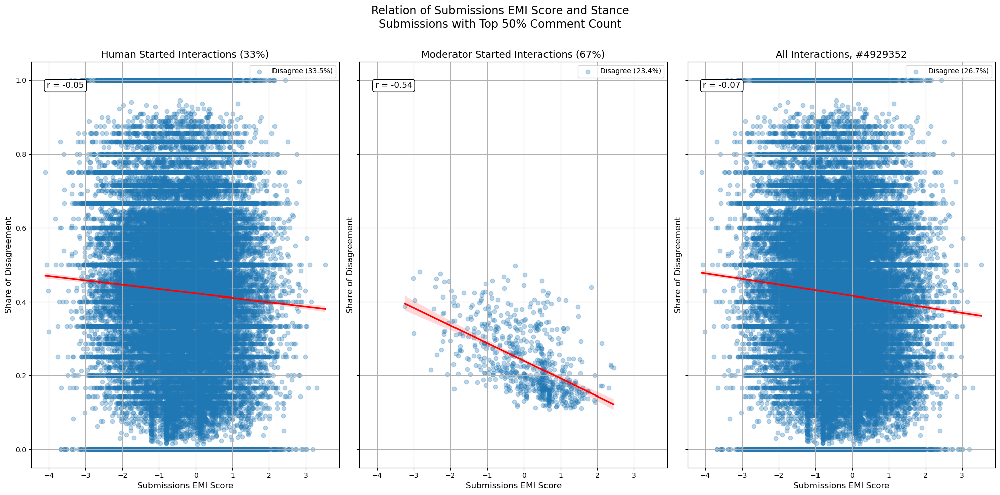

In [71]:
plot_emi_vs_disagreement(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all,
    filter_mode = "quantile", quantile = 0.5,
    save_path= "plots/Scatter_median_active_Submissions_EMI_Stance.png")


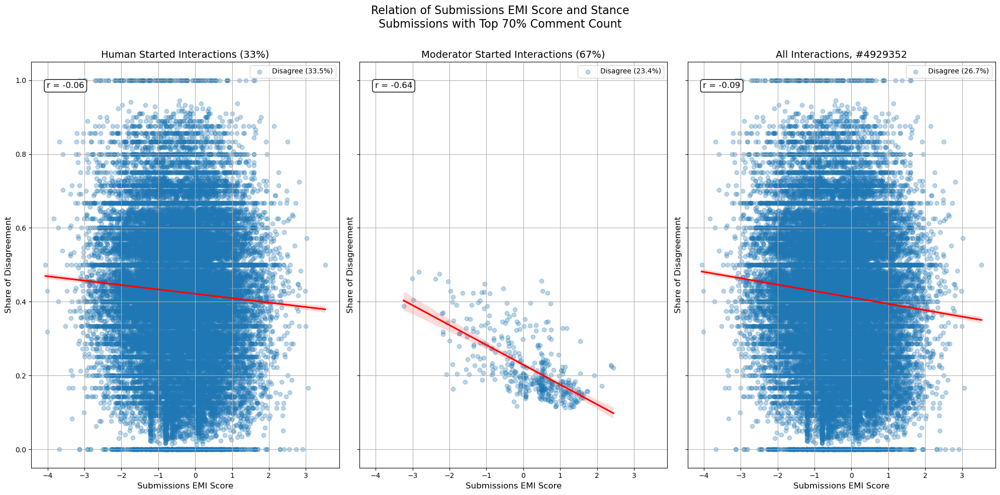

In [72]:
plot_emi_vs_disagreement(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all,
    filter_mode = "quantile", quantile = 0.7,
    save_path= "plots/Scatter_7_quantile_active_Submissions_EMI_Stance.png")


In [35]:
def plot_correlation_by_activity_quantile(
    activity_human, activity_mods, activity_all,
    human_stats, mod_stats, all_stats,
    interactions, mod_interactions, interactions_all,
    quantiles=np.linspace(0, 1, 11)  # 0%, 10%, ..., 100%
):
    results = []

    for q in quantiles:
        # Apply quantile filtering
        def filter_by_quantile(df, q_val):
            if q_val == 0:
                return df.copy()
            return df[df["num_comments"] >= df["num_comments"].quantile(q_val)]

        active_h = filter_by_quantile(activity_human, q)
        active_m = filter_by_quantile(activity_mods, q)
        active_a = filter_by_quantile(activity_all, q)

        h_data = human_stats[human_stats["submission_id"].isin(active_h["submission_id"])]
        m_data = mod_stats[mod_stats["submission_id"].isin(active_m["submission_id"])]
        a_data = all_stats[all_stats["submission_id"].isin(active_a["submission_id"])]

        # Define helper to compute correlation safely
        def get_corr(df):
            valid = df[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
            if len(valid) >= 2:
                return pearsonr(valid["EMI_score"], valid["share_disagree"])[0]
            return np.nan

        results.extend([
            {"Quantile": q, "Correlation": get_corr(h_data), "Group": "Humans"},
            {"Quantile": q, "Correlation": get_corr(m_data), "Group": "Mods"},
            {"Quantile": q, "Correlation": get_corr(a_data), "Group": "All"},
        ])

    # Create DataFrame
    result_df = pd.DataFrame(results)

    color_dict = {"Mods": "salmon",
                  "Humans" : "steelblue",
                  "All" : "green"}
    # Plot
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=result_df, x="Quantile", y="Correlation", hue="Group", palette = color_dict, alpha = 0.7, marker="o")
    plt.title("Correlation Between EMI Score and Disagreement Share by Activity Quantile", fontsize = 16)
    plt.xlabel("Activity Quantile Threshold (Min % of Comment Activity)", fontsize = 12)
    plt.ylabel("Pearson Correlation (r)", fontsize = 12)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("plots/Correlation_by_Activity_Quantile.pdf")
    plt.show()

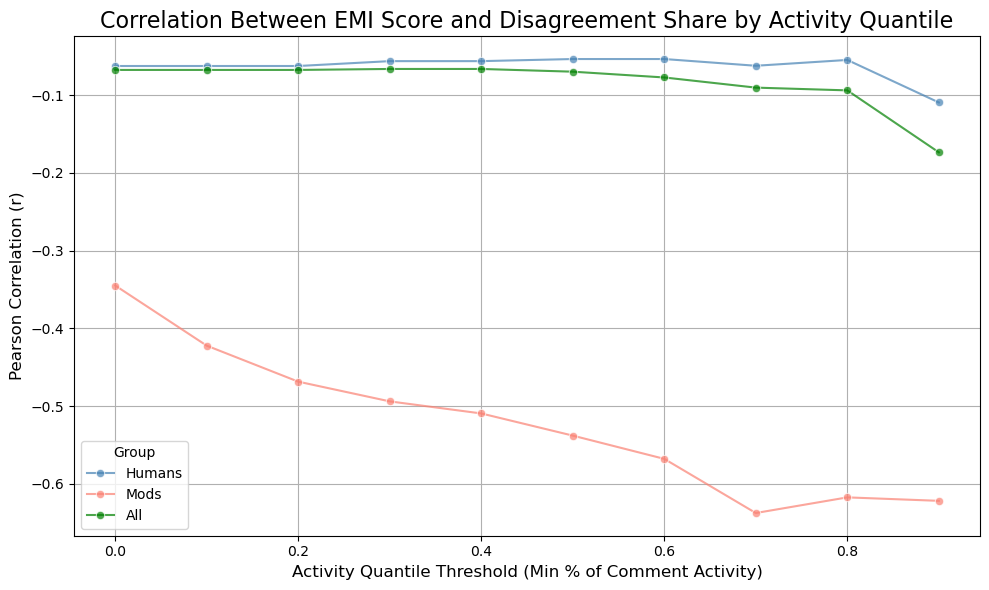

In [36]:
plot_correlation_by_activity_quantile(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all
)


**Interpretation**

* more active discussions have a higher negative correlation of submissions EMI with disagreement share
* visible from more than average number of comments on (among human started discussions)

## **Parent EMI and Stance** 

In [124]:
human_parent_disagreement_stats = (
    interactions
    .groupby('msg_id_parent')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_parent_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

human_parent_disagreement_stats

mod_parent_disagreement_stats = (
    mod_interactions
    .groupby('msg_id_parent')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_parent_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

mod_parent_disagreement_stats


all_parent_disagreement_stats = (
    interactions_all
    .groupby('msg_id_parent')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_parent_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

all_parent_disagreement_stats

,msg_id_parent,num_interactions,num_disagree,EMI_score,share_disagree
0,c0ae9r5,1,0,-0.893057,0.000000
1,c0aecro,1,1,-1.388933,1.000000
2,c0aedc3,1,1,-2.224295,1.000000
3,c0aeds9,3,2,-0.884158,0.666667
4,c0aeh4c,1,0,-0.386597,0.000000
...,...,...,...,...,...
1971808,kfpsken,1,0,-1.450048,0.000000
1971809,kfpv99m,1,1,1.278401,1.000000
1971810,kfpzmgq,1,0,-0.893079,0.000000
1971811,kfqdbma,2,0,0.694854,0.000000


In [125]:
get_r_p_CI(human_parent_disagreement_stats, "EMI_score", "share_disagree")

get_r_p_CI(mod_parent_disagreement_stats, "EMI_score", "share_disagree")

get_r_p_CI(all_parent_disagreement_stats, "EMI_score", "share_disagree")

r(802392) = -0.04, 95% CI [-0.04, -0.04], p < .001
r(1169390) = -0.07, 95% CI [-0.07, -0.07], p < .001
r(1971784) = -0.06, 95% CI [-0.06, -0.06], p < .001


Humans: mean replies per comment 2.0281665742362023
Mods: mean replies per comment 2.8236004884522767
Overall: mean replies per comment 2.499908459879309


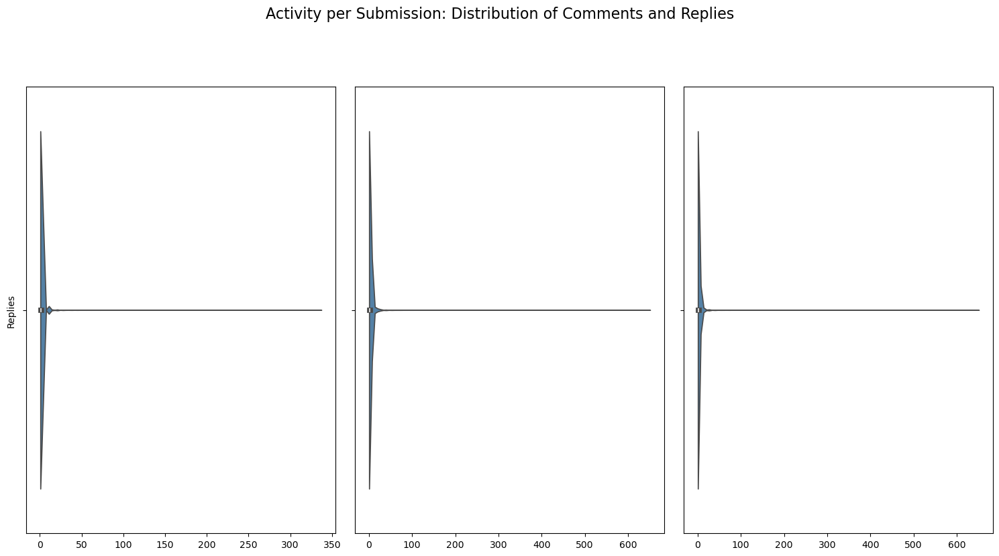

In [126]:
# define a map of submission_id to activity 

activity_human = (
    interactions
    .groupby('msg_id_parent')
    .agg(
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)
activity_human

activity_mods = (
    mod_interactions
    .groupby('msg_id_parent')
    .agg(
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)

activity_mods

activity_all = (
    interactions_all
    .groupby('msg_id_parent')
    .agg(
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)

activity_all


print("Humans: mean replies per comment", activity_human["num_replies"].mean())

print("Mods: mean replies per comment", activity_mods["num_replies"].mean())

print("Overall: mean replies per comment", activity_all["num_replies"].mean())


datasets = [
    (activity_human, "Humans"),
    (activity_mods, "Mods"),
    (activity_all, "All")
]

# Setup subplots: 2 rows (num_comments, num_replies) x 3 columns (humans, mods, all)
fig, axes = plt.subplots(1, 3, figsize=(15, 8), sharey='row')

for col, (df, title) in enumerate(datasets):
    # Top row: num_comments
  
    # Bottom row: num_replies
    sns.violinplot(
        x=df["num_replies"],
        ax=axes[col],
        color="steelblue"
    )
    axes[col].set_xlabel("")
    axes[col].set_ylabel("Replies" if col == 0 else "")

# Global layout
plt.tight_layout()
plt.suptitle("Activity per Submission: Distribution of Comments and Replies", fontsize=16, y=1.03)
plt.subplots_adjust(top=0.88)
plt.show()



# barely different, makes no sense to add an activity threshols on replies

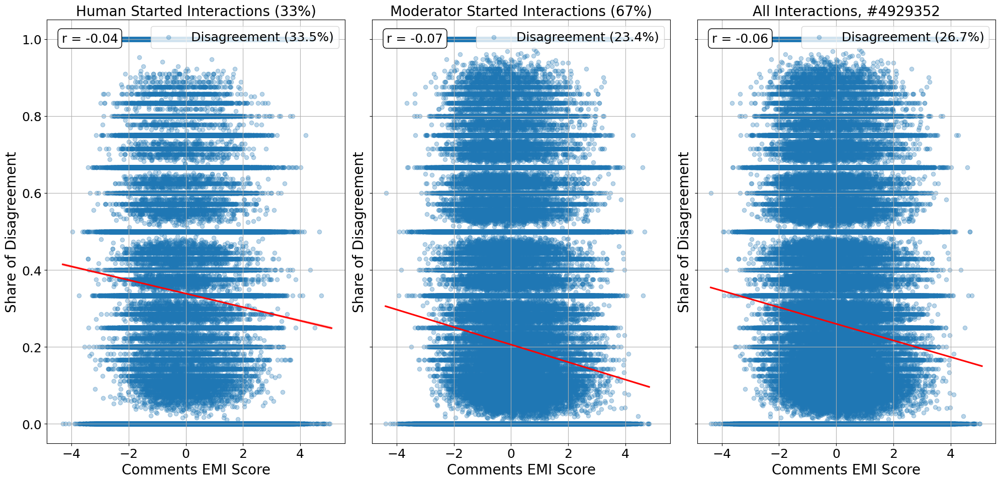

In [133]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of Parents EMI Score and Stance", fontsize=16)

# --- Human Started Interactions ---
human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
sns.regplot(
    data=human_parent_disagreement_stats,
    x="EMI_score", y="share_disagree", ax=axes[0],
    label=f'Disagreement ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = human_parent_disagreement_stats[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["EMI_score"], valid_data["share_disagree"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_xlabel("Comments EMI Score", fontsize=20)
axes[0].set_ylabel("Share of Disagreement", fontsize=20)
axes[0].legend(fontsize = 18, loc='upper right')
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)

# --- Moderator Started Interactions ---
mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
sns.regplot(
    data=mod_parent_disagreement_stats,
    x="EMI_score", y="share_disagree", ax=axes[1],
    label=f'Disagreement ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = mod_parent_disagreement_stats[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["EMI_score"], valid_data["share_disagree"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_xlabel("Comments EMI Score", fontsize=20)
axes[1].set_ylabel("Share of Disagreement", fontsize=20)
axes[1].legend(fontsize = 18, loc='upper right')
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

# --- All Interactions ---
all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
sns.regplot(
    data=all_parent_disagreement_stats,
    x="EMI_score", y="share_disagree", ax=axes[2],
    label=f'Disagreement ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = all_parent_disagreement_stats[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["EMI_score"], valid_data["share_disagree"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_xlabel("Comments EMI Score", fontsize=20)
axes[2].set_ylabel("Share of Disagreement", fontsize=20)
axes[2].legend(fontsize = 18, loc='upper right')
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Scatter_Parent_EMI_Stance.png", dpi = 300, bbox_inches='tight')

#plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

## **Interactions EMI and Stance**

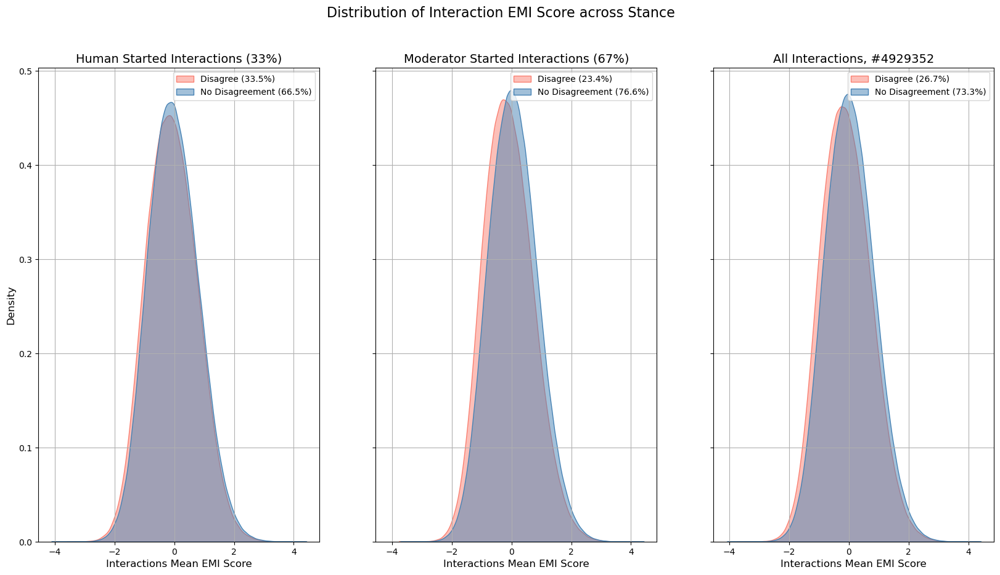

In [40]:
# no drop of rows, because each interaction is unique, the combo of parent & child

fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
fig.suptitle("Distribution of Interaction EMI Score across Stance", fontsize=16)


human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
human_share_no_disagree = len(interactions[interactions['predictions_ft'] == "no_disagreement"]) / len(interactions)

sns.kdeplot(data=interactions[interactions['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], ax = axes[0], label=f'Disagree ({human_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"],  ax = axes[0], label=f'No Disagreement ({human_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[0].set_xlabel("Interactions Mean EMI Score", fontsize = 12)
axes[0].set_ylabel("Density", fontsize = 12)
axes[0].legend()
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[0].grid(True)

mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
mod_share_no_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"]) / len(mod_interactions)

sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], ax = axes[1], label=f'Disagree ({mod_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"],  ax = axes[1], label=f'No Disagreement ({mod_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[1].set_xlabel("Interactions Mean EMI Score", fontsize = 12)
axes[1].set_ylabel("Density", fontsize = 12)
axes[1].legend()
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[1].grid(True)

all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
all_share_no_disagree = len(interactions_all[interactions_all['predictions_ft'] == "no_disagreement"]) / len(interactions_all)

sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], ax = axes[2], label=f'Disagree ({all_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"],  ax = axes[2], label=f'No Disagreement ({all_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[2].set_xlabel("Interactions Mean EMI Score", fontsize = 12)
axes[2].set_ylabel("Density", fontsize = 12)
axes[2].legend()
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize = 14)
axes[2].grid(True)

plt.savefig("plots/Distribution_Interaction_EMI_by_Stance.pdf")

**Interpretations**

* Interactions evolving below Moderator Submissions:
    * no_disagreement are more E based
 
* For human started discussions:
    * all interactions (disagree and no), same EMI distribution 

In [45]:
# interactions EMI correlation with disagree probability
get_r_p_CI(interactions, "mean_EMI_interaction_ft_EMI_z", "prob_disagree")

get_r_p_CI(mod_interactions, "mean_EMI_interaction_ft_EMI_z", "prob_disagree")

get_r_p_CI(interactions_all, "mean_EMI_interaction_ft_EMI_z", "prob_disagree")


r(1627346) = -0.04, 95% CI [-0.04, -0.04], p < .001
r(3301775) = -0.09, 95% CI [-0.09, -0.09], p < .001
r(4929123) = -0.08, 95% CI [-0.08, -0.08], p < .001


KeyboardInterrupt: 

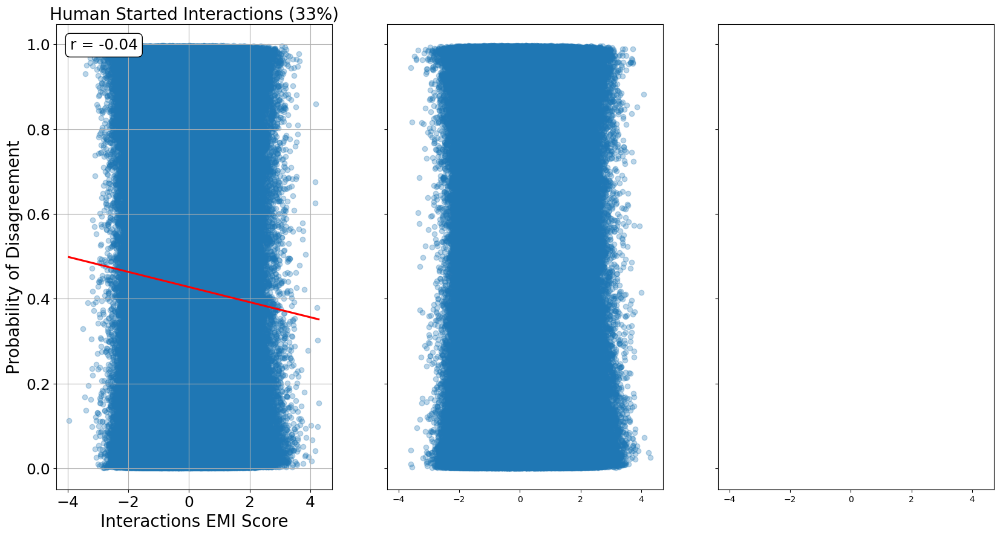

In [130]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of Interactions EMI Score and Stance", fontsize=16)

# --- Human Started Interactions ---
human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
sns.regplot(
    data=interactions,
    x="mean_EMI_interaction_ft_EMI_z", y="prob_disagree", ax=axes[0],
    #label=f'Disagree ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = interactions[["mean_EMI_interaction_ft_EMI_z", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["mean_EMI_interaction_ft_EMI_z"], valid_data["prob_disagree"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_xlabel("Interactions EMI Score", fontsize=20)
axes[0].set_ylabel("Probability of Disagreement", fontsize=20)
#axes[0].legend()
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)

# --- Moderator Started Interactions ---
mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
sns.regplot(
    data=mod_interactions,
    x="mean_EMI_interaction_ft_EMI_z", y="prob_disagree", ax=axes[1],
    #label=f'Disagree ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = mod_interactions[["mean_EMI_interaction_ft_EMI_z", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["mean_EMI_interaction_ft_EMI_z"], valid_data["prob_disagree"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_xlabel("Interactions EMI Score", fontsize=20)
axes[1].set_ylabel("Probability of Disagreement", fontsize=20)
#axes[1].legend()
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

# --- All Interactions ---
all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
sns.regplot(
    data=interactions_all,
    x="finetuned_child_len_EMI_z_trans", y="prob_disagree", ax=axes[2],
    #label=f'Disagree ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = interactions_all[["mean_EMI_interaction_ft_EMI_z", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["mean_EMI_interaction_ft_EMI_z"], valid_data["prob_disagree"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_xlabel("Interactions EMI Score", fontsize=20)
axes[2].set_ylabel("Probability of Disagreement", fontsize=20)
#axes[2].legend()
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.savefig("plots/Scatter_Interactions_EMI_Stance.png", dpi = 300)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

### **Replies EMI and Stance**

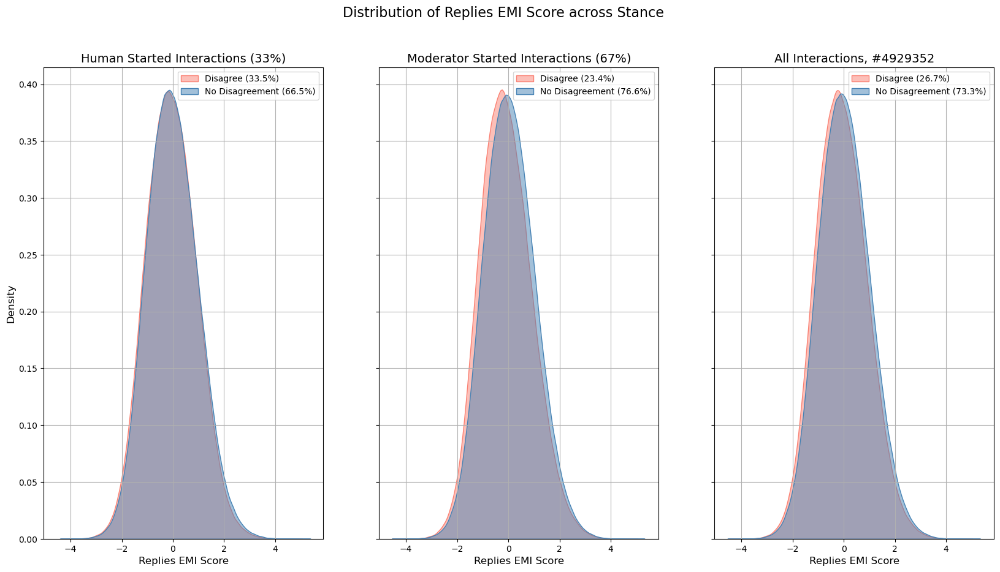

In [43]:
# check: replies EMI score related to interactions stance?
# drop based on child (should be unqiue anyways)

fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
fig.suptitle("Distribution of Replies EMI Score across Stance", fontsize=16)


human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
human_share_no_disagree = len(interactions[interactions['predictions_ft'] == "no_disagreement"]) / len(interactions)

sns.kdeplot(data=interactions[interactions['predictions_ft'] == "disagree"][f"finetuned_child_len_EMI_z_trans"], ax = axes[0], label=f'Disagree ({human_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "no_disagreement"][f"finetuned_child_len_EMI_z_trans"],  ax = axes[0], label=f'No Disagreement ({human_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[0].set_xlabel("Replies EMI Score", fontsize = 12)
axes[0].set_ylabel("Density", fontsize = 12)
axes[0].legend()
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[0].grid(True)

mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
mod_share_no_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"]) / len(mod_interactions)

sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "disagree"][f"finetuned_child_len_EMI_z_trans"], ax = axes[1], label=f'Disagree ({mod_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"][f"finetuned_child_len_EMI_z_trans"],  ax = axes[1], label=f'No Disagreement ({mod_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[1].set_xlabel("Replies EMI Score", fontsize = 12)
axes[1].set_ylabel("Density", fontsize = 12)
axes[1].legend()
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[1].grid(True)

all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
all_share_no_disagree = len(interactions_all[interactions_all['predictions_ft'] == "no_disagreement"]) / len(interactions_all)

sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "disagree"][f"finetuned_child_len_EMI_z_trans"], ax = axes[2], label=f'Disagree ({all_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "no_disagreement"][f"finetuned_child_len_EMI_z_trans"],  ax = axes[2], label=f'No Disagreement ({all_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[2].set_xlabel("Replies EMI Score", fontsize = 12)
axes[2].set_ylabel("Density", fontsize = 12)
axes[2].legend()
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize = 14)
axes[2].grid(True)

plt.savefig("plots/Distribution_Reply_EMI_by_Stance.pdf")


**Interpretation**

* Moderator submissions are more evidence based
* Evidence based submissions lead to lower share of disagreement
* Same holds for evidence based parents
* Among Interactions mean_EMI we also see: no_disagreement distribution shifted to the right
    * driven by parent: higer EMI less disagree
    * checking childrens distribution: same pattern
 
$\to$ across all text types, E based speaking reduced the chances for disagreement

$\to$ stronger for moderators, than humans

* robust to fine-tuned vs. self-build model (see below)

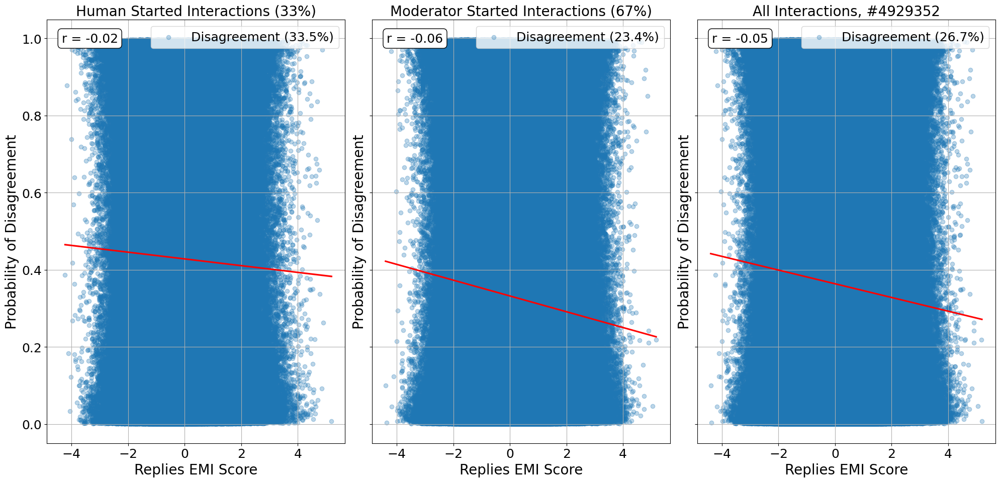

In [134]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of Replies EMI Score and Stance", fontsize=16)

# --- Human Started Interactions ---
human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
sns.regplot(
    data=interactions,
    x="finetuned_child_len_EMI_z_trans", y="prob_disagree", ax=axes[0],
    label=f'Disagreement ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = interactions[["finetuned_child_len_EMI_z_trans", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["finetuned_child_len_EMI_z_trans"], valid_data["prob_disagree"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_xlabel("Replies EMI Score", fontsize=20)
axes[0].set_ylabel("Probability of Disagreement", fontsize=20)
axes[0].legend(fontsize = 18, loc='upper right')
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)


# --- Moderator Started Interactions ---
mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
sns.regplot(
    data=mod_interactions,
    x="finetuned_child_len_EMI_z_trans", y="prob_disagree", ax=axes[1],
    label=f'Disagreement ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = mod_interactions[["finetuned_child_len_EMI_z_trans", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["finetuned_child_len_EMI_z_trans"], valid_data["prob_disagree"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_xlabel("Replies EMI Score", fontsize=20)
axes[1].set_ylabel("Probability of Disagreement", fontsize=20)
axes[1].legend(fontsize = 18, loc='upper right')
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

# --- All Interactions ---
all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
sns.regplot(
    data=interactions_all,
    x="finetuned_child_len_EMI_z_trans", y="prob_disagree", ax=axes[2],
    label=f'Disagreement ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = interactions_all[["finetuned_child_len_EMI_z_trans", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["finetuned_child_len_EMI_z_trans"], valid_data["prob_disagree"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_xlabel("Replies EMI Score", fontsize=20)
axes[2].set_ylabel("Probability of Disagreement", fontsize=20)
axes[2].legend(fontsize = 18, loc='upper right')
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Scatter_Child_EMI_Stance.png", dpi = 300, bbox_inches='tight')

plt.show()

In [25]:

# Correlation of childs EMI with disagree_probabilits: does the childs speaking type predict the label?

get_r_p_CI(interactions, "finetuned_child_len_EMI_z_trans", "prob_disagree")

get_r_p_CI(mod_interactions, "finetuned_child_len_EMI_z_trans", "prob_disagree")

get_r_p_CI(interactions_all, "finetuned_child_len_EMI_z_trans", "prob_disagree")


r(1627363) = -0.02, 95% CI [-0.03, -0.02], p < .001
r(3301799) = -0.06, 95% CI [-0.06, -0.06], p < .001
r(4929164) = -0.05, 95% CI [-0.05, -0.05], p < .001


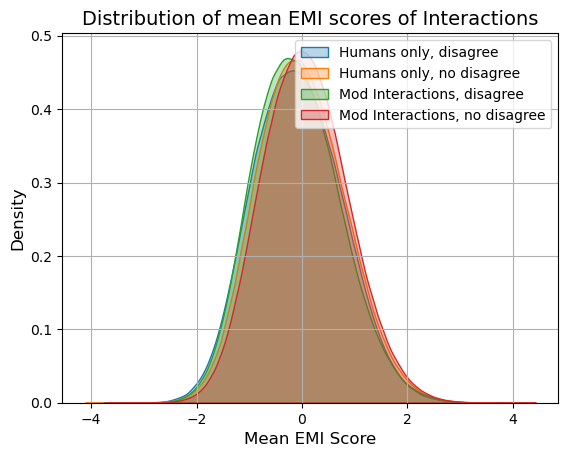

In [80]:
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], label='Humans only, disagree', fill=True, alpha=0.3)
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"], label='Humans only, no disagree',  fill=True, alpha=0.3)


sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], label='Mod Interactions, disagree',  fill=True, alpha=0.3)
sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"], label='Mod Interactions, no disagree',  fill=True, alpha=0.3)


plt.xlabel("Mean EMI Score", fontsize = 12)
plt.ylabel("Density", fontsize = 12)
plt.legend()
plt.title(f"Distribution of mean EMI scores of Interactions", fontsize = 14)
plt.grid(True)

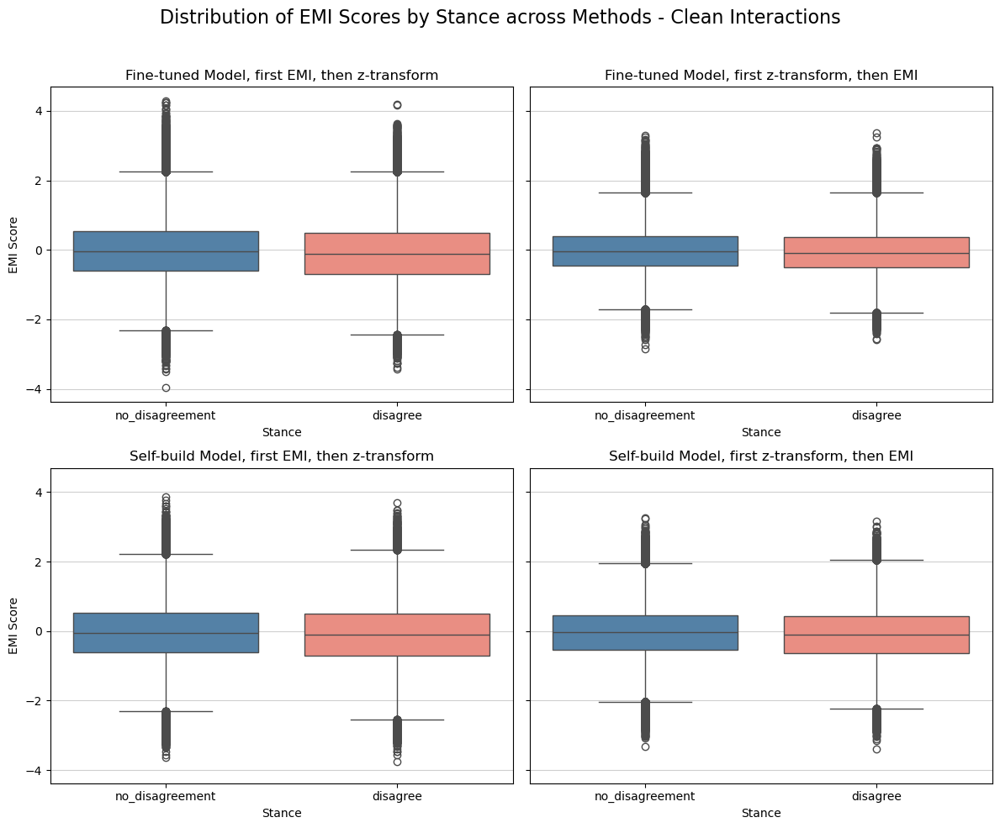

In [82]:
color_dict = {"disagree" : "salmon", "no_disagreement" : "steelblue"}
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharey=True)
axes = axes.flatten()


title_dict = {"mean_EMI_interaction_ft_EMI_z" : "Fine-tuned Model, first EMI, then z-transform",
               "mean_EMI_interaction_ft_z_EMI" : "Fine-tuned Model, first z-transform, then EMI", 
               "mean_EMI_interaction_sb_EMI_z" : "Self-build Model, first EMI, then z-transform", 
               "mean_EMI_interaction_sb_z_EMI" : "Self-build Model, first z-transform, then EMI"}


methods = ["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]

# Plot for each category
for i, method in enumerate(methods):
    sns.boxplot(
        x='predictions_ft',
        y=method,
        data=interactions[interactions["predictions_ft"] != "ambiguous"],
        hue = 'predictions_ft',
        palette=color_dict,
        ax=axes[i]
    )
    axes[i].set_title(f'{title_dict[method]}')
    axes[i].set_xlabel('Stance')
    axes[i].set_ylabel('EMI Score')
    axes[i].grid(True, axis='y', alpha=0.6)

plt.suptitle('Distribution of EMI Scores by Stance across Methods - Clean Interactions', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.savefig("plots/EMI_Box_by_Stance.pdf")
plt.show()

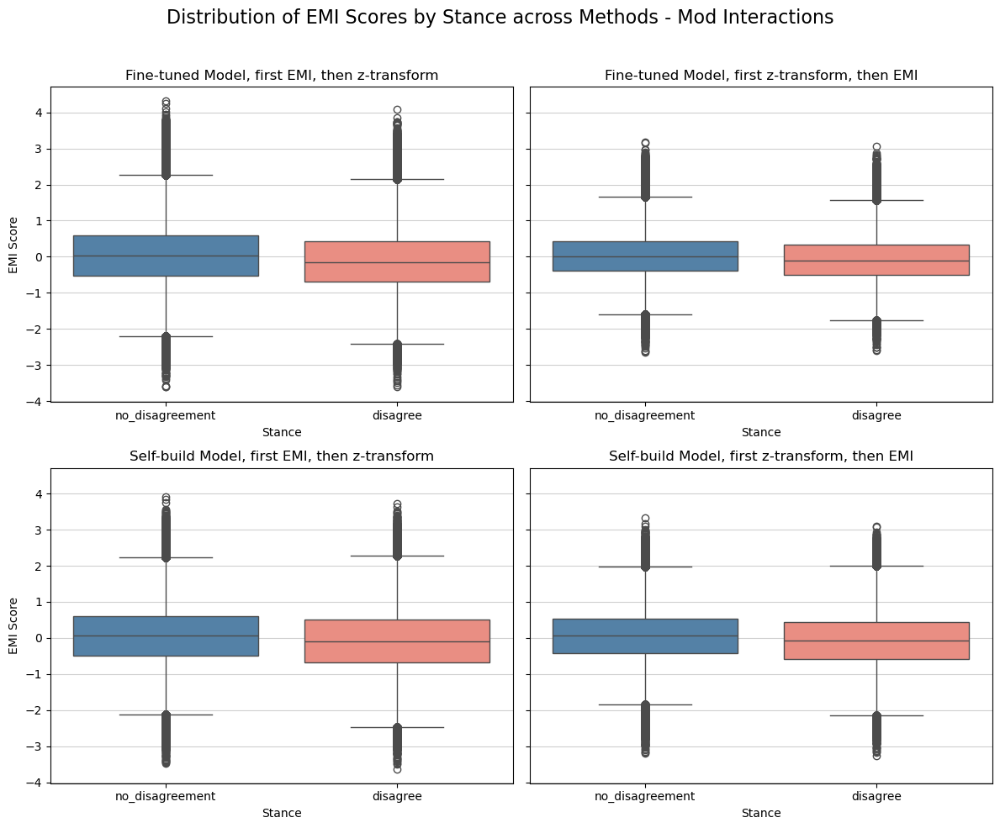

In [83]:
# parent & child, only

color_dict = {"disagree" : "salmon", "no_disagreement" : "steelblue"}
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharey=True)
axes = axes.flatten()


title_dict = {"mean_EMI_interaction_ft_EMI_z" : "Fine-tuned Model, first EMI, then z-transform",
               "mean_EMI_interaction_ft_z_EMI" : "Fine-tuned Model, first z-transform, then EMI", 
               "mean_EMI_interaction_sb_EMI_z" : "Self-build Model, first EMI, then z-transform", 
               "mean_EMI_interaction_sb_z_EMI" : "Self-build Model, first z-transform, then EMI"}


methods = ["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]

# Plot for each category
for i, method in enumerate(methods):
    sns.boxplot(
        x='predictions_ft',
        y=method,
        data=mod_interactions[mod_interactions["predictions_ft"] != "ambiguous"],
        hue = 'predictions_ft',
        palette=color_dict,
        ax=axes[i]
    )
    axes[i].set_title(f'{title_dict[method]}')
    axes[i].set_xlabel('Stance')
    axes[i].set_ylabel('EMI Score')
    axes[i].grid(True, axis='y', alpha=0.6)

plt.suptitle('Distribution of EMI Scores by Stance across Methods - Mod Interactions', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  
#plt.savefig("plots/EMI_Box_by_Stance.pdf")
plt.show()

In [26]:

def make_t_test(df, EMI_method):
    group1 = df[df["predictions_ft"] == "disagree"][EMI_method].dropna()
    group2 = df[df["predictions_ft"] == "no_disagreement"][EMI_method].dropna()

    # Standard t-test (equal variance assumed)
    #t_stat, p_value = ttest_ind(group1, group2)
    
    # Welch's t-test (no equal variance assumption)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Determine significance level
    if p_value < 0.001:
        sig = "***"
    elif p_value < 0.01:
        sig = "**"
    elif p_value < 0.05:
        sig = "*"
    else:
        sig = "ns"  # not significant

    return f"{EMI_method}: t = {t_stat:.3f}, p = {p_value:.4f} ({sig})"


In [ ]:
# Human

In [85]:
interactions.groupby("predictions_ft")[["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", 
                                        "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]].mean().reset_index()


,predictions_ft,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI
0,disagree,-0.086959,-0.060329,-0.105023,-0.100709
1,no_disagreement,-0.019366,-0.015829,-0.042399,-0.040532


In [ ]:
# Mod

In [86]:
mod_interactions.groupby("predictions_ft")[["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", 
                                        "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]].mean().reset_index()


,predictions_ft,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI
0,disagree,-0.105165,-0.070616,-0.079630,-0.072914
1,no_disagreement,0.056925,0.039592,0.062855,0.059455


In [87]:
interactions_all.groupby("predictions_ft")[["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", 
                                        "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]].mean().reset_index()


,predictions_ft,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI
0,disagree,-0.097642,-0.066366,-0.090123,-0.084399
1,no_disagreement,0.034051,0.022975,0.031297,0.029477


In [27]:
# significant differende in mean EMI between disagree and no disagreement

methods = ["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", 
           "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]



print("Clean Interactions:")
print("--------------------")
for method in methods:
    print(make_t_test(interactions, method))
print("")

print("Mod Interactions:")
print("--------------------")
for method in methods:
    print(make_t_test(mod_interactions, method))
print("")


print("All Interactions:")
print("--------------------")
for method in methods:
    print(make_t_test(interactions_all, method))


Clean Interactions:
--------------------
mean_EMI_interaction_ft_EMI_z: t = -48.592, p = 0.0000 (***)
mean_EMI_interaction_ft_z_EMI: t = -43.005, p = 0.0000 (***)
mean_EMI_interaction_sb_EMI_z: t = -43.985, p = 0.0000 (***)
mean_EMI_interaction_sb_z_EMI: t = -48.331, p = 0.0000 (***)

Mod Interactions:
--------------------
mean_EMI_interaction_ft_EMI_z: t = -151.454, p = 0.0000 (***)
mean_EMI_interaction_ft_z_EMI: t = -140.509, p = 0.0000 (***)
mean_EMI_interaction_sb_EMI_z: t = -128.735, p = 0.0000 (***)
mean_EMI_interaction_sb_z_EMI: t = -137.500, p = 0.0000 (***)

All Interactions:
--------------------
mean_EMI_interaction_ft_EMI_z: t = -156.071, p = 0.0000 (***)
mean_EMI_interaction_ft_z_EMI: t = -143.627, p = 0.0000 (***)
mean_EMI_interaction_sb_EMI_z: t = -139.752, p = 0.0000 (***)
mean_EMI_interaction_sb_z_EMI: t = -150.306, p = 0.0000 (***)


In [89]:
# significant mean EMI difference in disagree between humand and mod?

def make_t_test(df_1, df_2, label = "disagree", EMI_method = "mean_EMI_interaction_ft_EMI_z"):
    
    group1 = df_1[df_1["predictions_ft"] == label][EMI_method].dropna()
    group2 = df_2[df_2["predictions_ft"] == label][EMI_method].dropna()

    # Standard t-test (equal variance assumed)
    #t_stat, p_value = ttest_ind(group1, group2)
    
    # Welch's t-test (no equal variance assumption)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Determine significance level
    if p_value < 0.001:
        sig = "***"
    elif p_value < 0.01:
        sig = "**"
    elif p_value < 0.05:
        sig = "*"
    else:
        sig = "ns"  # not significant

    print(group1.mean())
    print(group2.mean())

    return f"{label}: t = {t_stat:.3f}, p = {p_value:.4f} ({sig})"


print(make_t_test(interactions, mod_interactions, label = "disagree"))

print("----------")

print(make_t_test(interactions, mod_interactions, label = "no_disagreement"))

-0.08695857097239408
-0.10516507255469716
disagree: t = 12.336, p = 0.0000 (***)
----------
-0.019366140486237735
0.0569252273892329
no_disagreement: t = -80.329, p = 0.0000 (***)


In [ ]:
# For submissions and parents EMI, we need to get disagreement share (majority stance), because they are not unique

In [28]:
all_submission_disagreement_stats
all_parent_disagreement_stats

,msg_id_parent,num_interactions,num_disagree,EMI_score,share_disagree
0,c0ae9r5,1,0,-0.893057,0.000000
1,c0aecro,1,1,-1.388933,1.000000
2,c0aedc3,1,1,-2.224295,1.000000
3,c0aeds9,3,2,-0.884158,0.666667
4,c0aeh4c,1,0,-0.386597,0.000000
...,...,...,...,...,...
1971808,kfpsken,1,0,-1.450048,0.000000
1971809,kfpv99m,1,1,1.278401,1.000000
1971810,kfpzmgq,1,0,-0.893079,0.000000
1971811,kfqdbma,2,0,0.694854,0.000000


In [24]:
# make column majorty disagree, majorty no disagree, equal and add mean EMI Score

def make_majority(df):
    conditions = [
        df['share_disagree'] > 0.5,
        df['share_disagree'] < 0.5,
        df['share_disagree'] == 0.5
    ]
    
    choices = [
        'majority_disagree',
        'majority_no_disagreement',
        'indifferent'
    ]
    
    # Apply the conditions
    df['disagreement_status'] = np.select(conditions, choices)
    return df


all_submission_disagreement_stats = make_majority(all_submission_disagreement_stats)
all_parent_disagreement_stats = make_majority(all_parent_disagreement_stats)


In [25]:

def make_t_test(df, EMI_method = "mean_EMI_interaction_ft_EMI_z"):
    group1 = df[df["disagreement_status"] == "majority_disagree"]["EMI_score"].dropna()
    group2 = df[df["disagreement_status"] == "majority_no_disagreement"]["EMI_score"].dropna()

    # Standard t-test (equal variance assumed)
    #t_stat, p_value = ttest_ind(group1, group2)
    
    # Welch's t-test (no equal variance assumption)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Determine significance level
    if p_value < 0.001:
        sig = "***"
    elif p_value < 0.01:
        sig = "**"
    elif p_value < 0.05:
        sig = "*"
    else:
        sig = "ns"  # not significant

    return f"{EMI_method}: t = {t_stat:.3f}, p = {p_value:.4f} ({sig})"



print("Submissions:")
print("--------------------")

print(all_submission_disagreement_stats.groupby("disagreement_status")[["EMI_score"]].mean().reset_index())

print(make_t_test(all_submission_disagreement_stats, EMI_method = "mean_EMI_interaction_ft_EMI_z"))

print("")

print("Parents:")
print("--------------------")

print(all_parent_disagreement_stats.groupby("disagreement_status")[["EMI_score"]].mean().reset_index())


print(make_t_test(all_parent_disagreement_stats, EMI_method = "mean_EMI_interaction_ft_EMI_z"))

print("")



Submissions:
--------------------
        disagreement_status  EMI_score
0               indifferent  -0.566863
1         majority_disagree  -0.574258
2  majority_no_disagreement  -0.429057
mean_EMI_interaction_ft_EMI_z: t = -19.365, p = 0.0000 (***)

Parents:
--------------------
        disagreement_status  EMI_score
0               indifferent  -0.081761
1         majority_disagree  -0.101354
2  majority_no_disagreement   0.029281
mean_EMI_interaction_ft_EMI_z: t = -73.979, p = 0.0000 (***)



***
# **EMI by Ideology**

* Use texts, because label does not matter, so unique comments, unique ideology and EMI

In [135]:
texts = pd.read_csv(f"../../data/analysis_data/texts_ideology_{scores}.csv")


texts['ideology'] = texts['Partisan_Score'].apply(lambda x: "left" if x < 0 else "right")
texts['emi'] = texts['finetuned_len_EMI_z_trans'].apply(lambda x: "I" if x < 0 else "E")
texts

,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,predictions_prob_disagree,type,Partisan_Score,ideology,emi
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,0.017145,right,E
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,0.013507,right,E
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,0.035521,right,I
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,0.182155,right,E
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,0.024481,right,I
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,-0.024883,left,I
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,-0.082393,left,I
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,-0.024883,left,I
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,-0.024883,left,I


<Axes: >

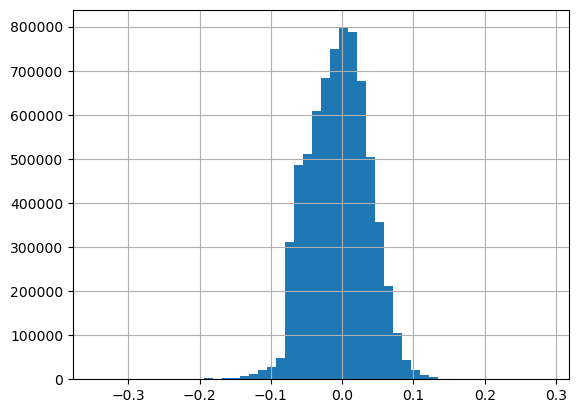

In [136]:
texts['Partisan_Score'].hist(bins = 50)

In [137]:

texts['sure_ideology'] = texts['Partisan_Score'].apply(
    lambda x: "left" if x < -0.03 else ("right" if x > 0.03 else "None")
)
texts

,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,predictions_prob_disagree,type,Partisan_Score,ideology,emi,sure_ideology
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,0.017145,right,E,None
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,0.013507,right,E,None
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,0.035521,right,I,right
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,0.182155,right,E,right
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,0.024481,right,I,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,-0.024883,left,I,None
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,-0.082393,left,I,left
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,-0.024883,left,I,None
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,-0.024883,left,I,None


In [138]:
texts['ideology'].value_counts().to_frame('Count').join(texts['ideology'].value_counts(normalize=True).to_frame('%')).reset_index()

,ideology,Count,%
0,left,3757281,0.535931
1,right,3253478,0.464069


In [139]:
texts['sure_ideology'].value_counts().to_frame('Count').join(texts['sure_ideology'].value_counts(normalize=True).to_frame('%')).reset_index()

,sure_ideology,Count,%
0,None,3541540,0.505158
1,left,2034185,0.290152
2,right,1435034,0.204690


In [140]:
texts['emi'].value_counts().to_frame('Count').join(texts['emi'].value_counts(normalize=True).to_frame('%')).reset_index()

,emi,Count,%
0,I,3635375,0.518542
1,E,3375384,0.481458


In [141]:
texts["E_speaking"] = texts["finetuned_len_EMI_z_trans"].apply(lambda x: 1 if x >= 0 else 0)
texts

texts_summary = (
    texts
    .groupby('type')
    .agg(E_share=('E_speaking', 'mean'),
         count=('E_speaking', 'count'))
    .reset_index()
)

total_interactions = texts.shape[0]
texts_summary['interaction_share'] = texts_summary['count'] / total_interactions
texts_summary = texts_summary.sort_values('E_share', ascending=False)


texts_summary['I_share'] = 1 - texts_summary["E_share"]
texts_summary

,type,E_share,count,interaction_share,I_share
0,child,0.484927,4936035,0.704066,0.515073
1,parent,0.480651,1975873,0.281834,0.519349
2,submission,0.324327,98851,0.014100,0.675673


In [142]:
texts["right_leaning"] = texts["ideology"].apply(lambda x: 1 if x == "right" else 0)

texts_ideology_summary = (
    texts
    .groupby('type')
    .agg(right_share=('right_leaning', 'mean'),
         count=('right_leaning', 'count'))
    .reset_index()
)

total_interactions = texts.shape[0]
texts_ideology_summary['interaction_share'] = texts_ideology_summary['count'] / total_interactions
texts_ideology_summary = texts_ideology_summary.sort_values('right_share', ascending=False)


texts_ideology_summary['left_share'] = 1 - texts_ideology_summary["right_share"]
texts_ideology_summary

,type,right_share,count,interaction_share,left_share
2,submission,0.558780,98851,0.014100,0.441220
1,parent,0.471773,1975873,0.281834,0.528227
0,child,0.459089,4936035,0.704066,0.540911


In [143]:
texts["sure_leaning"] = texts["sure_ideology"].apply(lambda x: "r" if x == "right" else "l" if x == "left" else "indif")

texts

,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,predictions_prob_disagree,type,Partisan_Score,ideology,emi,sure_ideology,E_speaking,right_leaning,sure_leaning
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,0.017145,right,E,None,1,1,indif
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,0.013507,right,E,None,1,1,indif
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,0.035521,right,I,right,0,1,r
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,0.182155,right,E,right,1,1,r
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,0.024481,right,I,None,0,1,indif
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,-0.024883,left,I,None,0,0,indif
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,-0.082393,left,I,left,0,0,l
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,-0.024883,left,I,None,0,0,indif
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,-0.024883,left,I,None,0,0,indif


In [144]:
counts = (
    texts
    .groupby(['type', 'sure_leaning'])
    .size()
    .reset_index(name='count')
)
counts

total_by_type = (
    texts
    .groupby('type')
    .size()
    .reset_index(name='total')
)

total_by_type

,type,total
0,child,4936035
1,parent,1975873
2,submission,98851


In [145]:
texts_ideology_summary_sure = counts.merge(total_by_type, on='type')
texts_ideology_summary_sure['share'] = (
    texts_ideology_summary_sure['count'] / texts_ideology_summary_sure['total']
)

# Optional: Sort for readability
texts_ideology_summary_sure = texts_ideology_summary_sure.sort_values(
    ['type', 'sure_leaning']
)
texts_ideology_summary_sure

,type,sure_leaning,count,total,share
0,child,indif,2526928,4936035,0.511935
1,child,l,1432513,4936035,0.290215
2,child,r,976594,4936035,0.197850
3,parent,indif,961428,1975873,0.486584
4,parent,l,581058,1975873,0.294077
5,parent,r,433387,1975873,0.219340
6,submission,indif,53184,98851,0.538022
7,submission,l,20614,98851,0.208536
8,submission,r,25053,98851,0.253442


In [146]:
summary_pivot = texts_ideology_summary_sure.pivot(
    index='type', columns='sure_leaning', values='share'
).fillna(0)
summary_pivot

sure_leaning,indif,l,r
type,,,
child,0.511935,0.290215,0.197850
parent,0.486584,0.294077,0.219340
submission,0.538022,0.208536,0.253442


In [147]:

texts = texts.rename(columns = {"predictions_prob_disagree" : "prob_disagree"})


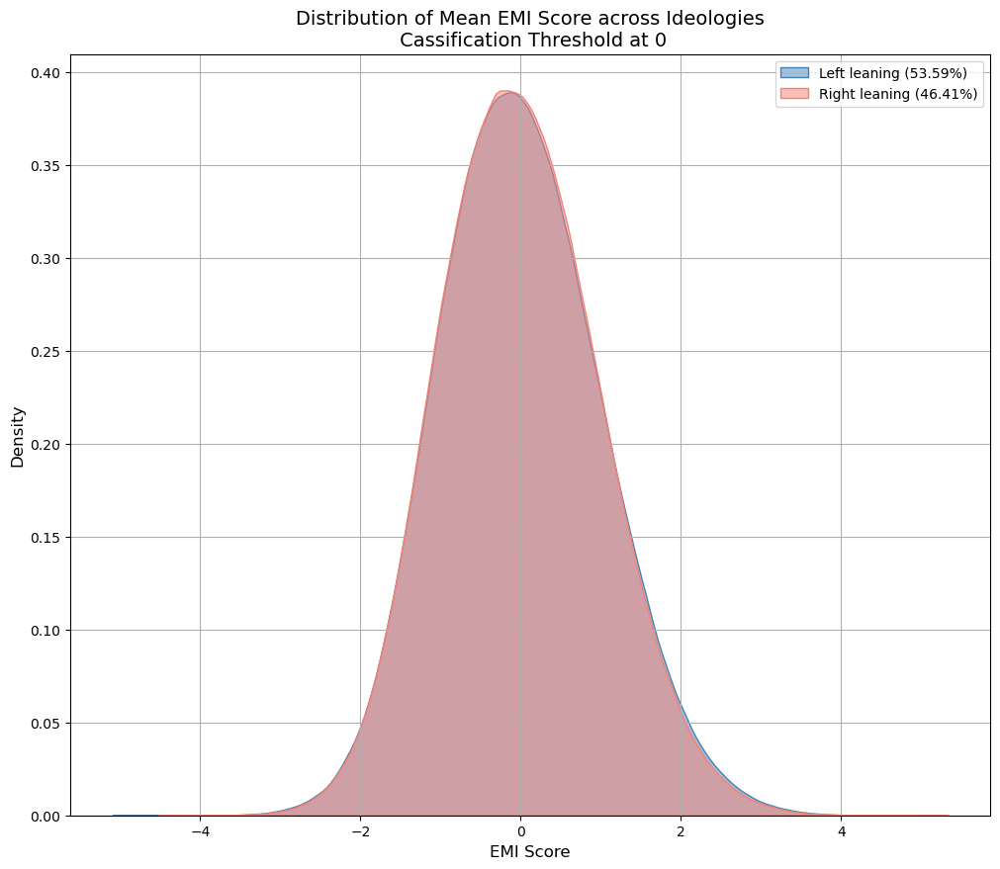

In [74]:
fig = plt.subplots(figsize=(12, 10))

share_right = len(texts[texts['ideology'] == "right"]) / len(texts) * 100
share_left = len(texts[texts['ideology'] == "left"]) / len(texts) * 100



sns.kdeplot(data=texts[texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"],  label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['ideology'] == "right"][f"finetuned_len_EMI_z_trans"],  label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)


plt.xlabel("EMI Score", fontsize = 12)
plt.ylabel("Density", fontsize = 12)
plt.legend()
plt.grid(True)
plt.title("Distribution of Mean EMI Score across Ideologies\n Cassification Threshold at 0", fontsize = 14)

plt.savefig("plots/Distribution_EMI_by_Ideology.pdf")

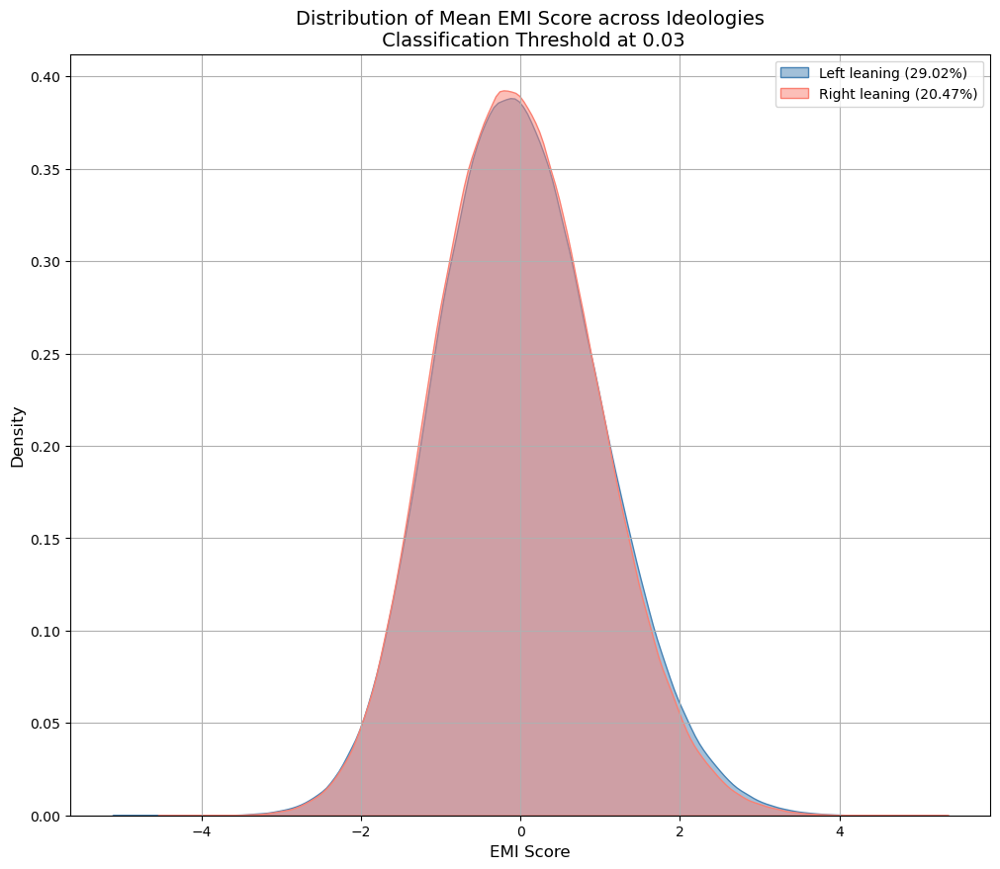

In [73]:
fig = plt.subplots(figsize=(12, 10))

share_right = len(texts[texts['sure_ideology'] == "right"]) / len(texts) * 100
share_left = len(texts[texts['sure_ideology'] == "left"]) / len(texts) * 100



sns.kdeplot(data=texts[texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"],  label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['sure_ideology'] == "right"][f"finetuned_len_EMI_z_trans"],  label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)


plt.xlabel("EMI Score", fontsize = 12)
plt.ylabel("Density", fontsize = 12)
plt.legend()
plt.grid(True)
plt.title("Distribution of Mean EMI Score across Ideologies\n Classification Threshold at 0.03", fontsize = 14)

plt.savefig("plots/Distribution_EMI_by_Ideology_sure.pdf")

/tmp/ipykernel_551/3949189446.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  share_right = len(texts[texts['type'] == "submission"][texts['ideology'] == "right"]) / len(texts[texts['type'] == "submission"]) * 100
/tmp/ipykernel_551/3949189446.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  share_left = len(texts[texts['type'] == "submission"][texts['ideology'] == "left"]) / len(texts[texts['type'] == "submission"]) * 100
/tmp/ipykernel_551/3949189446.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.kdeplot(data=texts[texts['type'] == "submission"][texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
/tmp/ipykernel_551/3949189446.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.kdeplot(data=texts[texts['type'] == "submission"][texts['

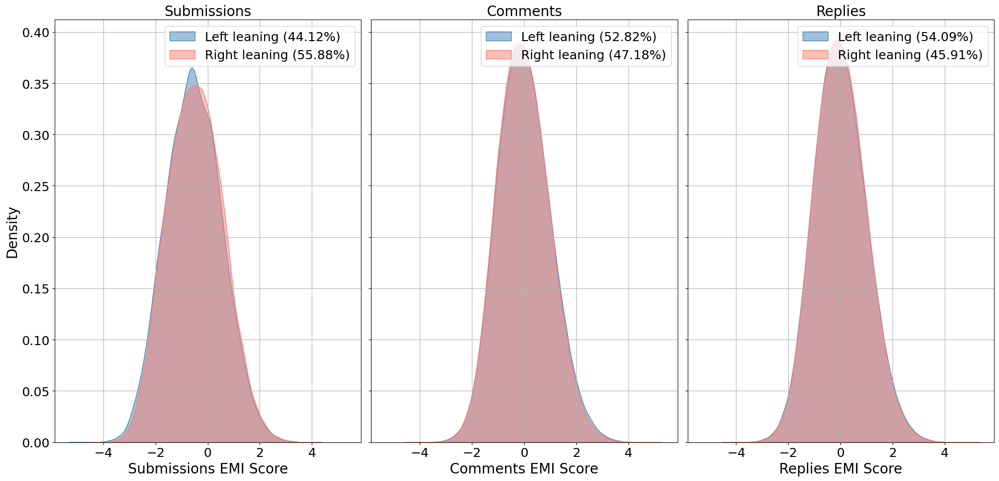

In [151]:

fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Distribution of EMI Score by Ideology\n Classification Threshold at 0", fontsize=16)



share_right = len(texts[texts['type'] == "submission"][texts['ideology'] == "right"]) / len(texts[texts['type'] == "submission"]) * 100
share_left = len(texts[texts['type'] == "submission"][texts['ideology'] == "left"]) / len(texts[texts['type'] == "submission"]) * 100

sns.kdeplot(data=texts[texts['type'] == "submission"][texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "submission"][texts['ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)

axes[0].set_xlabel("Submissions EMI Score", fontsize = 20)
axes[0].set_ylabel("Density", fontsize = 20)
axes[0].legend(fontsize = 18, loc = "upper right")
axes[0].set_title(f"Submissions", fontsize = 20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)


share_right = len(texts[texts['type'] == "parent"][texts['ideology'] == "right"]) / len(texts[texts['type'] == "parent"]) * 100
share_left = len(texts[texts['type'] == "parent"][texts['ideology'] == "left"]) / len(texts[texts['type'] == "parent"]) * 100

sns.kdeplot(data=texts[texts['type'] == "parent"][texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[1], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "parent"][texts['ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[1], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[1].set_xlabel("Comments EMI Score", fontsize = 20)
axes[1].set_ylabel("Density", fontsize = 20)
axes[1].legend(fontsize = 18, loc = "upper right")
axes[1].set_title(f"Comments", fontsize = 20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

share_right = len(texts[texts['type'] == "child"][texts['ideology'] == "right"]) / len(texts[texts['type'] == "child"]) * 100
share_left = len(texts[texts['type'] == "child"][texts['ideology'] == "left"]) / len(texts[texts['type'] == "child"]) * 100

sns.kdeplot(data=texts[texts['type'] == "child"][texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[2], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "child"][texts['ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[2], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[2].set_xlabel("Replies EMI Score", fontsize = 20)
axes[2].set_ylabel("Density", fontsize = 20)
axes[2].legend(fontsize = 18, loc = "upper right")
axes[2].set_title(f"Replies", fontsize = 20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Distribution_EMI_Ideology_Texttype.pdf", bbox_inches='tight')


/tmp/ipykernel_551/1953797336.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  share_right = len(texts[texts['type'] == "submission"][texts['sure_ideology'] == "right"]) / len(texts[texts['type'] == "submission"]) * 100
/tmp/ipykernel_551/1953797336.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  share_left = len(texts[texts['type'] == "submission"][texts['sure_ideology'] == "left"]) / len(texts[texts['type'] == "submission"]) * 100
/tmp/ipykernel_551/1953797336.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.kdeplot(data=texts[texts['type'] == "submission"][texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
/tmp/ipykernel_551/1953797336.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.kdeplot(data=texts[texts['type'] == "submi

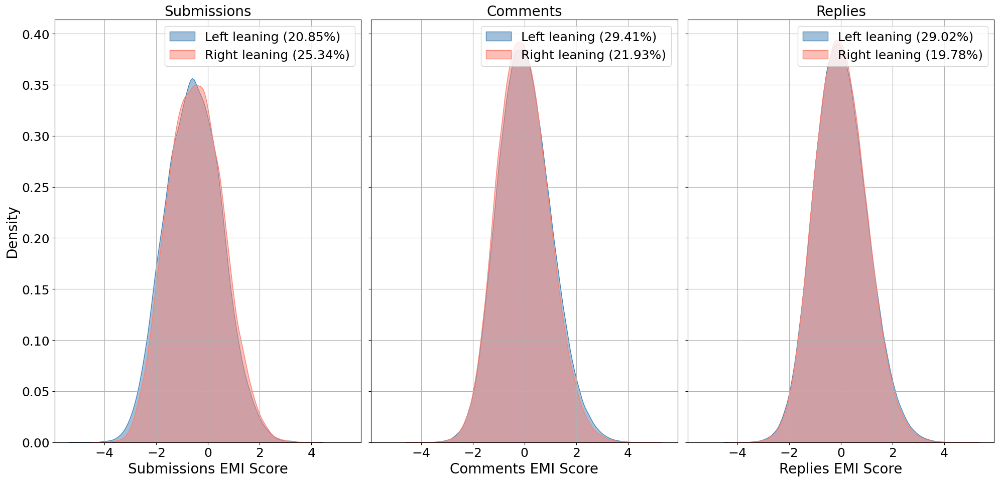

In [152]:

fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Distribution of EMI Score by Ideology\n Classification Threshold at 0.03", fontsize=16)



share_right = len(texts[texts['type'] == "submission"][texts['sure_ideology'] == "right"]) / len(texts[texts['type'] == "submission"]) * 100
share_left = len(texts[texts['type'] == "submission"][texts['sure_ideology'] == "left"]) / len(texts[texts['type'] == "submission"]) * 100

sns.kdeplot(data=texts[texts['type'] == "submission"][texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "submission"][texts['sure_ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[0].set_xlabel("Submissions EMI Score", fontsize = 20)
axes[0].set_ylabel("Density", fontsize = 20)
axes[0].legend(fontsize = 18, loc = "upper right")
axes[0].set_title(f"Submissions", fontsize = 20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)


share_right = len(texts[texts['type'] == "parent"][texts['sure_ideology'] == "right"]) / len(texts[texts['type'] == "parent"]) * 100
share_left = len(texts[texts['type'] == "parent"][texts['sure_ideology'] == "left"]) / len(texts[texts['type'] == "parent"]) * 100

sns.kdeplot(data=texts[texts['type'] == "parent"][texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[1], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "parent"][texts['sure_ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[1], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[1].set_xlabel("Comments EMI Score", fontsize = 20)
axes[1].set_ylabel("Density", fontsize = 20)
axes[1].legend(fontsize = 18, loc = "upper right")
axes[1].set_title(f"Comments", fontsize = 20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

share_right = len(texts[texts['type'] == "child"][texts['sure_ideology'] == "right"]) / len(texts[texts['type'] == "child"]) * 100
share_left = len(texts[texts['type'] == "child"][texts['sure_ideology'] == "left"]) / len(texts[texts['type'] == "child"]) * 100

sns.kdeplot(data=texts[texts['type'] == "child"][texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[2], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "child"][texts['sure_ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[2], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[2].set_xlabel("Replies EMI Score", fontsize = 20)
axes[2].set_ylabel("Density", fontsize = 20)
axes[2].legend(fontsize = 18, loc = "upper right")
axes[2].set_title(f"Replies", fontsize = 20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Distribution_EMI_sure_Ideology_Texttype.pdf", bbox_inches='tight')


In [78]:
texts[["finetuned_len_EMI_z_trans", "Partisan_Score"]].corr()

,finetuned_len_EMI_z_trans,Partisan_Score
finetuned_len_EMI_z_trans,1.00000,-0.00499
Partisan_Score,-0.00499,1.00000


In [82]:
# get correlation and CIs

def get_r_p_CI(df, x_col, y_col):
    # Clean data
    x = df[x_col]
    y = df[y_col]
    
    mask = (~np.isnan(x)) & (~np.isnan(y)) & (~np.isinf(x)) & (~np.isinf(y))
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Compute Pearson r and p
    r, p = pearsonr(x_clean, y_clean)
    
    # Compute 95% CI using Fisher z-transformation
    n = len(x_clean)
    z = np.arctanh(r)  # Fisher transformation
    se = 1 / np.sqrt(n - 3)
    z_crit = norm.ppf(0.975)  # 95% CI
    
    ci_low_z = z - z_crit * se
    ci_high_z = z + z_crit * se
    ci_low = np.tanh(ci_low_z)  
    ci_high = np.tanh(ci_high_z)
    
    # Format (APA style)
    df = n - 2
    p_str = "p < .001" if p < 0.001 else f"p = {p:.3f}"
    
    print(f"r({df}) = {r:.2f}, 95% CI [{ci_low:.2f}, {ci_high:.2f}], {p_str}")

get_r_p_CI(texts, "finetuned_len_EMI_z_trans", "Partisan_Score")


r(7010757) = -0.00, 95% CI [-0.01, -0.00], p < .001


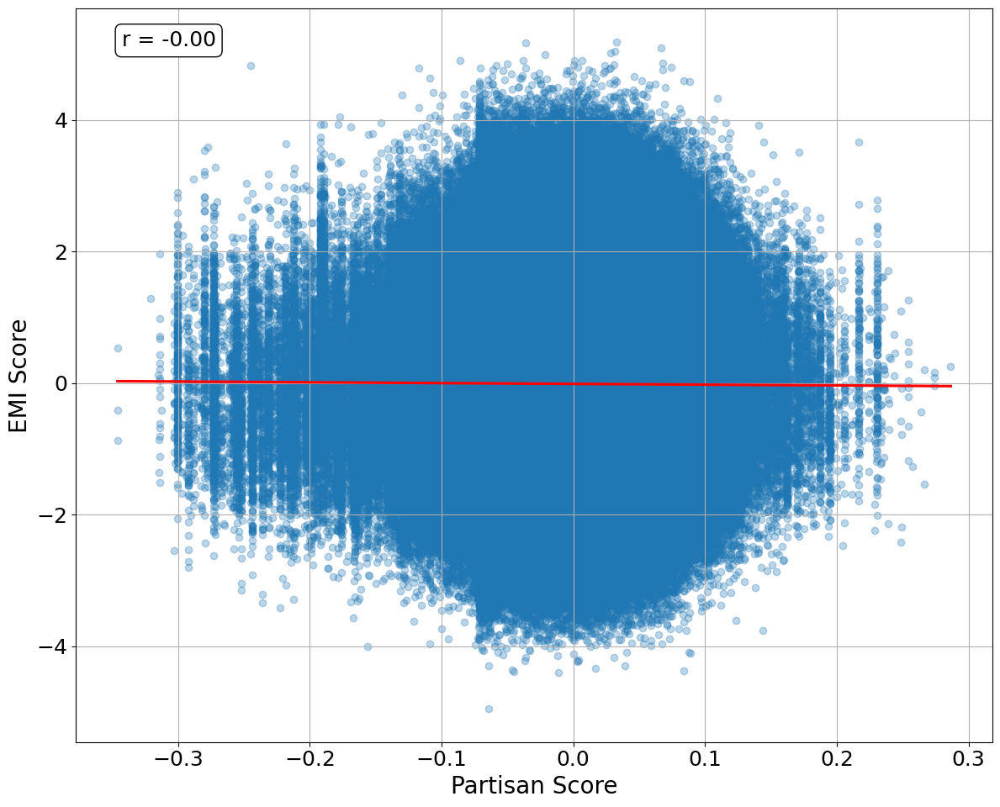

In [154]:
fig = plt.subplots(figsize=(12, 10))
sns.regplot(data=texts, x = "Partisan_Score", y = "finetuned_len_EMI_z_trans", scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'})

plt.xlabel("Partisan Score", fontsize = 20)
plt.ylabel("EMI Score", fontsize = 20)
plt.grid(True)
#plt.title("Scatterplot of Partisan Score vs. EMI Score", fontsize = 14)

plt.tick_params(axis='both', labelsize=18)


#valid_data = all_parent_disagreement_stats[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(texts["finetuned_len_EMI_z_trans"], texts["Partisan_Score"])
plt.annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
            bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))

plt.tight_layout(rect=[0, 0, 1, 0.97])

plt.savefig("plots/Partisan_EMI_Scatter.png", dpi = 300, bbox_inches='tight')


In [79]:
texts.groupby("ideology")[["finetuned_len_EMI_z_trans", "finetuned_len_norm_z_trans_EMI",
                           "self_len_EMI_z_trans", "self_len_norm_z_trans_EMI"]].mean().reset_index()


,ideology,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI
0,left,-0.005011,-0.005827,-0.003358,-0.004888
1,right,-0.014234,-0.011217,-0.019035,-0.017719


In [132]:
texts.groupby("sure_ideology")[["finetuned_len_EMI_z_trans", "finetuned_len_norm_z_trans_EMI",
                                "self_len_EMI_z_trans", "self_len_norm_z_trans_EMI"]].mean().reset_index()


,sure_ideology,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI
0,None,-0.005413,-0.005192,-0.007497,-0.008548
1,left,-0.003735,-0.005547,-0.000818,-0.002437
2,right,-0.026737,-0.020011,-0.032288,-0.028418


In [80]:

def make_t_test(EMI_method):
    group1 = texts[texts["ideology"] == "right"][EMI_method].dropna()
    group2 = texts[texts["ideology"] == "left"][EMI_method].dropna()

    # Standard t-test (equal variance assumed)
    #t_stat, p_value = ttest_ind(group1, group2)
    
    # Welch's t-test (no equal variance assumption)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Determine significance level
    if p_value < 0.001:
        sig = "***"
    elif p_value < 0.01:
        sig = "**"
    elif p_value < 0.05:
        sig = "*"
    else:
        sig = "ns"  # not significant

    return f"{EMI_method}: t = {t_stat:.3f}, p = {p_value:.4f} ({sig})"



methods = ["finetuned_len_EMI_z_trans", "finetuned_len_norm_z_trans_EMI",
                           "self_len_EMI_z_trans", "self_len_norm_z_trans_EMI"]

for method in methods:
    print(make_t_test(method))

# difference in mean EMI between right and left is significant (across all models)
# right: mean EMI is negative (intuition based)
# left: mean EMI is positive

# BUT super low scale, still: significant

finetuned_len_EMI_z_trans: t = -12.143, p = 0.0000 (***)
finetuned_len_norm_z_trans_EMI: t = -9.710, p = 0.0000 (***)
self_len_EMI_z_trans: t = -20.794, p = 0.0000 (***)
self_len_norm_z_trans_EMI: t = -19.388, p = 0.0000 (***)


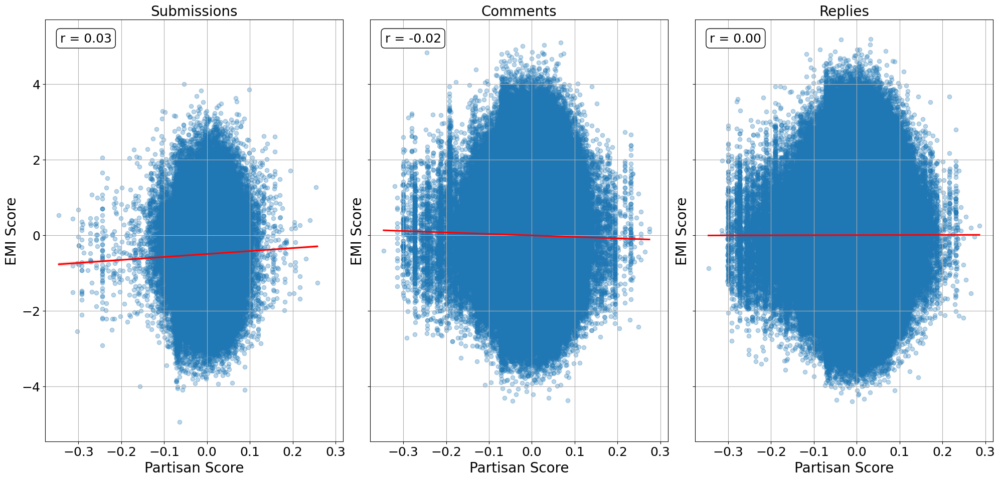

In [153]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of EMI Score and Ideology", fontsize=16)

# --- Submissions ---
sns.regplot(
    data=texts[texts['type'] == 'submission'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[0],
    #label=f'Disagree ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'submission'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_ylabel("EMI Score", fontsize=20)
axes[0].set_xlabel("Partisan Score", fontsize=20)
#axes[0].legend()
axes[0].set_title(f"Submissions", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)

# --- Comments ---
sns.regplot(
    data=texts[texts['type'] == 'parent'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[1],
    #label=f'Disagree ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'parent'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_ylabel("EMI Score", fontsize=20)
axes[1].set_xlabel("Partisan Score", fontsize=20)
#axes[1].legend()
axes[1].set_title(f"Comments", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

# --- Replies ---
sns.regplot(
    data=texts[texts['type'] == 'child'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[2],
    #label=f'Disagree ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'child'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                 bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_ylabel("EMI Score", fontsize=20)
axes[2].set_xlabel("Partisan Score", fontsize=20)
#axes[2].legend()
axes[2].set_title(f"Replies", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)


plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Scatter_EMI_Ideology.png", dpi = 300, bbox_inches='tight')

plt.show()

In [160]:
# get correlation and CIs

def get_r_p_CI(df, x_col, y_col):
    # Clean data
    x = df[x_col]
    y = df[y_col]
    
    mask = (~np.isnan(x)) & (~np.isnan(y)) & (~np.isinf(x)) & (~np.isinf(y))
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Compute Pearson r and p
    r, p = pearsonr(x_clean, y_clean)
    
    # Compute 95% CI using Fisher z-transformation
    n = len(x_clean)
    z = np.arctanh(r)  # Fisher transformation
    se = 1 / np.sqrt(n - 3)
    z_crit = norm.ppf(0.975)  # 95% CI
    
    ci_low_z = z - z_crit * se
    ci_high_z = z + z_crit * se
    ci_low = np.tanh(ci_low_z)  
    ci_high = np.tanh(ci_high_z)
    
    # Format (APA style)
    df = n - 2
    p_str = "p < .001" if p < 0.001 else f"p = {p:.3f}"
    
    print(f"r({df}) = {r:.2f}, 95% CI [{ci_low:.2f}, {ci_high:.2f}], {p_str}")

get_r_p_CI(texts[texts["type"] == "submission"], "finetuned_len_EMI_z_trans", "Partisan_Score")
get_r_p_CI(texts[texts["type"] == "parent"], "finetuned_len_EMI_z_trans", "Partisan_Score")
get_r_p_CI(texts[texts["type"] == "child"], "finetuned_len_EMI_z_trans", "Partisan_Score")


r(98849) = 0.03, 95% CI [0.03, 0.04], p < .001
r(1975871) = -0.02, 95% CI [-0.02, -0.02], p < .001
r(4936033) = 0.00, 95% CI [0.00, 0.00], p = 0.015


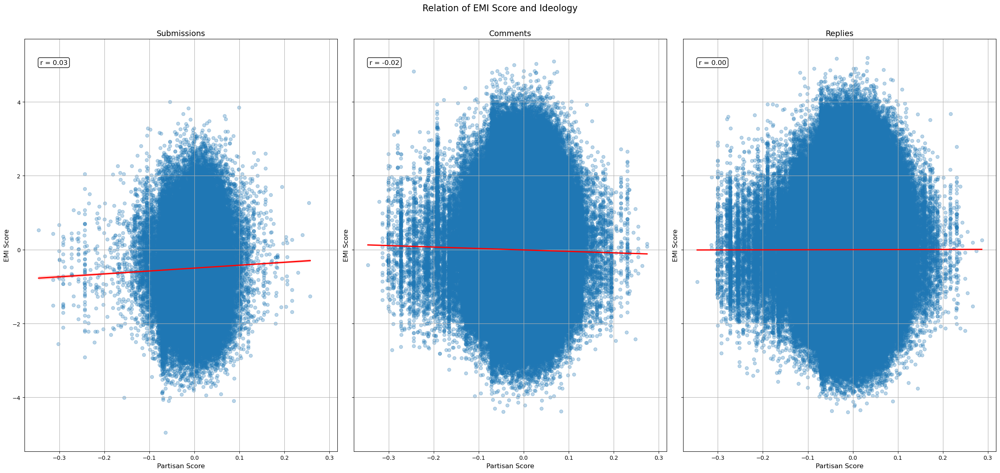

In [136]:




# plot
fig, axes = plt.subplots(1, 3, figsize=(25, 12), sharex=True, sharey=True)
fig.suptitle("Relation of EMI Score and Ideology", fontsize=16)

# --- Submissions ---
sns.regplot(
    data=texts[texts['type'] == 'submission'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[0],
    #label=f'Disagree ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'submission'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_ylabel("EMI Score", fontsize=12)
axes[0].set_xlabel("Partisan Score", fontsize=12)
#axes[0].legend()
axes[0].set_title(f"Submissions", fontsize=14)
axes[0].grid(True)

# --- Comments ---
sns.regplot(
    data=texts[texts['type'] == 'parent'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[1],
    #label=f'Disagree ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'parent'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_ylabel("EMI Score", fontsize=12)
axes[1].set_xlabel("Partisan Score", fontsize=12)
#axes[1].legend()
axes[1].set_title(f"Comments", fontsize=14)
axes[1].grid(True)

# --- Replies ---
sns.regplot(
    data=texts[texts['type'] == 'child'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[2],
    #label=f'Disagree ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'child'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, ha='left', va='top',
                 bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_ylabel("EMI Score", fontsize=12)
axes[2].set_xlabel("Partisan Score", fontsize=12)
#axes[2].legend()
axes[2].set_title(f"Replies", fontsize=14)
axes[2].grid(True)

#plt.savefig("plots/Scatter_EMI_Ideology.png", dpi = 600)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

**Interpretation**

* Among Submissions, right leaning users tend to speak more evidence based
* Among Comments, right leaning users tend to speak more intuition based
* Among Replies, there is no relation


## **Ideology and Stance**

In [84]:
all_submission_disagreement_stats

,submission_id,num_interactions,num_disagree,EMI_score,share_disagree
0,1001a3h,30,2,-0.584611,0.066667
1,1001mh,2,1,0.522836,0.500000
2,1003k02,65,26,-1.131063,0.400000
3,10045jv,7,3,0.422146,0.428571
4,1004fx,2,0,-1.040226,0.000000
...,...,...,...,...,...
100165,zzlqg,2,0,1.127682,0.000000
100166,zzmjp,1,1,-0.848453,1.000000
100167,zznjb,1,0,0.866848,0.000000
100168,zzpai,1,1,0.337770,1.000000


In [155]:
texts

# for submissions and parents, we need to get the share of disagree, they are part of
# merge with all_submission_disagreement_stats and all_parent_disagreement_stats

texts = texts.merge(all_submission_disagreement_stats[["submission_id", "share_disagree"]], left_on = "id", right_on = "submission_id", 
            how = "left").rename(columns = {"share_disagree" : "sub_share_disagree"})

texts = texts.merge(all_parent_disagreement_stats[["msg_id_parent", "share_disagree"]], left_on = "id", right_on = "msg_id_parent", 
            how = "left").rename(columns = {"share_disagree" : "parent_share_disagree"})

texts



,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,prob_disagree,type,...,ideology,emi,sure_ideology,E_speaking,right_leaning,sure_leaning,submission_id,sub_share_disagree,msg_id_parent,parent_share_disagree
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,...,right,E,None,1,1,indif,NaN,NaN,c7ecp8d,0.0
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,...,right,E,None,1,1,indif,NaN,NaN,c7efx8q,0.5
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,...,right,I,right,0,1,r,NaN,NaN,c7edr13,0.0
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,...,right,E,right,1,1,r,NaN,NaN,c7ee45j,0.0
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,...,right,I,None,0,1,indif,NaN,NaN,c7ejopx,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,...,left,I,None,0,0,indif,18letrx,0.000000,NaN,NaN
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,...,left,I,left,0,0,l,18m5lyo,0.000000,NaN,NaN
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,...,left,I,None,0,0,indif,18p9iet,0.076923,NaN,NaN
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,...,left,I,None,0,0,indif,18qmiau,0.000000,NaN,NaN


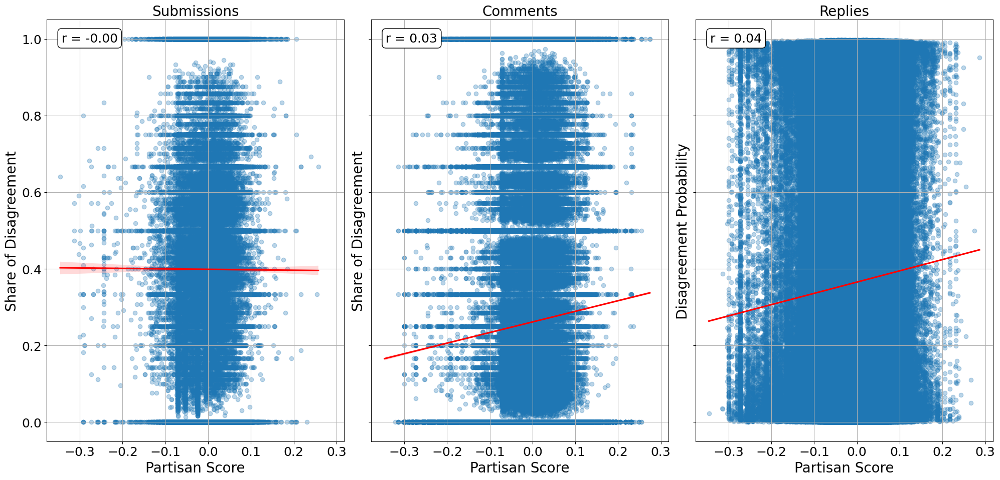

In [156]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of Disagreement Probability Score and Ideology", fontsize=16)

# --- Submissions ---
sns.regplot(
    data=texts[texts['type'] == 'submission'],
    y="sub_share_disagree", x="Partisan_Score", ax=axes[0],
    #label=f'Disagree ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'submission'][["prob_disagree", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["prob_disagree"], valid_data["Partisan_Score"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_ylabel("Share of Disagreement", fontsize=20)
axes[0].set_xlabel("Partisan Score", fontsize=20)
#axes[0].legend()
axes[0].set_title(f"Submissions", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)


# --- Comments ---
sns.regplot(
    data=texts[texts['type'] == 'parent'],
    y="parent_share_disagree", x="Partisan_Score", ax=axes[1],
    #label=f'Disagree ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'parent'][["prob_disagree", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["prob_disagree"], valid_data["Partisan_Score"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_ylabel("Share of Disagreement", fontsize=20)
axes[1].set_xlabel("Partisan Score", fontsize=20)
#axes[1].legend()
axes[1].set_title(f"Comments", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)


# --- Replies ---
sns.regplot(
    data=texts[texts['type'] == 'child'],
    y="prob_disagree", x="Partisan_Score", ax=axes[2],
    #label=f'Disagree ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'child'][["prob_disagree", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["prob_disagree"], valid_data["Partisan_Score"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_ylabel("Disagreement Probability", fontsize=20)
axes[2].set_xlabel("Partisan Score", fontsize=20)
#axes[2].legend()
axes[2].set_title(f"Replies", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)


plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Scatter_Disagree_Ideology.png", dpi = 300, bbox_inches='tight')

plt.show()

In [161]:
# get correlation and CIs

get_r_p_CI(texts[texts["type"] == "submission"], "prob_disagree", "Partisan_Score")
get_r_p_CI(texts[texts["type"] == "parent"], "prob_disagree", "Partisan_Score")
get_r_p_CI(texts[texts["type"] == "child"], "prob_disagree", "Partisan_Score")


r(98849) = -0.00, 95% CI [-0.01, 0.00], p = 0.340
r(1975871) = 0.03, 95% CI [0.03, 0.03], p < .001
r(4936033) = 0.04, 95% CI [0.03, 0.04], p < .001


**CAUTION**

* User ideology is user bind, stance is tecxt bind $\to$ can be distorted

In [95]:
author_texts = texts.groupby("author").agg(
    mean_disagree_prob = ('prob_disagree', 'mean'),
    mean_EMI = ('finetuned_len_EMI_z_trans', 'mean'),
    ideology = ("Partisan_Score", 'first')
).reset_index()

author_texts[['mean_disagree_prob',	'mean_EMI', 'ideology']].corr()

,mean_disagree_prob,mean_EMI,ideology
mean_disagree_prob,1.000000,-0.098566,0.018373
mean_EMI,-0.098566,1.000000,0.000599
ideology,0.018373,0.000599,1.000000


<Axes: xlabel='ideology', ylabel='mean_EMI'>

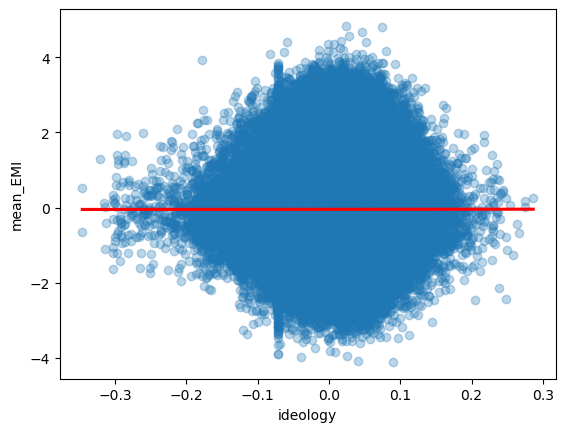

In [96]:
sns.regplot(
    data=author_texts,
    y="mean_EMI", x="ideology",
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)

In [108]:
author_texts['ideology'].value_counts().sort_values(ascending = False)

ideology
-0.071454    15246
-0.006818      106
 0.002976       75
-0.004402       64
-0.021834       63
             ...  
 0.032270        1
 0.029496        1
 0.034494        1
-0.008109        1
-0.004386        1
Name: count, Length: 780589, dtype: int64

In [111]:
author_texts[
    (author_texts['ideology'] >= -0.07146) &
    (author_texts['ideology'] <= -0.0714)
]

,author,mean_disagree_prob,mean_EMI,ideology
11,-----42-----,0.559997,-0.467844,-0.071454
58,---putin--,0.001351,-0.902097,-0.071454
102,--chimpeach--,0.570033,-0.407449,-0.071454
167,--politics--,0.515163,0.723686,-0.071454
209,--xenogears--,0.289255,-0.660929,-0.071454
...,...,...,...,...
799649,zuljin-and-tonic,0.088400,1.221833,-0.071454
799686,zumahelper,0.719700,-0.019289,-0.071454
799967,zxgljx,0.045380,-1.279301,-0.071454
800152,zz20back,0.052940,0.764793,-0.071454


***
# **Heatmap**

In [164]:
# Ideology labels
def ideology_category(row):
    p = row['parent_partisan']
    c = row['child_partisan']
    if p > 0 and c > 0:
        return 'CR & RR'
    elif p > 0 and c < 0:
        return 'CR & RL'
    elif p < 0 and c > 0:
        return 'CL & RR'
    elif p < 0 and c < 0:
        return 'CL & RL'
    else:
        return 'Mixed/Neutral'

# EMI labels
def emi_category(row):
    p = row['finetuned_parent_len_EMI_z_trans']
    c = row['finetuned_child_len_EMI_z_trans']
    if p > 0 and c > 0:
        return 'CE & RE'
    elif p > 0 and c < 0:
        return 'CE & RI'
    elif p < 0 and c > 0:
        return 'CI & RE'
    elif p < 0 and c < 0:
        return 'CI & RI'
    else:
        return 'Mixed/Neutral'


interactions['ideology_group'] = interactions.apply(ideology_category, axis=1)
interactions['emi_group'] = interactions.apply(emi_category, axis=1)

mod_interactions['ideology_group'] = mod_interactions.apply(ideology_category, axis=1)
mod_interactions['emi_group'] = mod_interactions.apply(emi_category, axis=1)

interactions_all['ideology_group'] = interactions_all.apply(ideology_category, axis=1)
interactions_all['emi_group'] = interactions_all.apply(emi_category, axis=1)


In [165]:
interactions_all["emi_group"].value_counts()

emi_group
CI & RI          1635211
CE & RE          1475615
CI & RE           914448
CE & RI           903851
Mixed/Neutral        227
Name: count, dtype: int64

In [166]:
interactions_all[interactions_all["emi_group"] == "Mixed/Neutral"] # those with NaNs or zero scores

,msg_id_parent,msg_id_child,submission_id,subreddit,exact_time_child,author_child,author_parent,author_submission,finetuned_child_E_norm,finetuned_child_I_norm,...,child_partisan,submission_partisan,prob_disagree,Mod_Dummy,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI,ideology_group,emi_group
23107,dndrvjw,dng4u4l,71v8rr,Ask_Politics,1506276675.0,ronald-hapchwarae,hifidelitycastro,precookedeagle,NaN,NaN,...,0.038115,0.032393,0.04745,0,NaN,NaN,NaN,NaN,CR & RR,Mixed/Neutral
42126,fy9qj9m,fya1dqt,hsbxhb,Ask_Politics,1594924260.0,floating_bells_down,lonelynarwhal,floating_bells_down,NaN,NaN,...,-0.022509,-0.022509,0.00574,0,NaN,NaN,NaN,NaN,CR & RL,Mixed/Neutral
72037,c5e1xcj,c5e3aop,wk4bv,PoliticalDiscussion,1342306631.0,impulse97,rustyarrowhead,thementatbashar,NaN,NaN,...,-0.042936,0.056987,0.21410,0,NaN,NaN,NaN,NaN,CR & RL,Mixed/Neutral
83045,c6qj5tk,c6qjfgb,11y2ua,PoliticalDiscussion,1351004371.0,newpolitics,txking12,newpolitics,-0.142458,-0.289626,...,0.058131,0.058131,0.02045,0,NaN,NaN,NaN,NaN,CR & RR,Mixed/Neutral
83046,c6qj5tk,c6qm3zn,11y2ua,PoliticalDiscussion,1351014524.0,herff,txking12,newpolitics,-0.089645,-0.201444,...,-0.002195,0.058131,0.01945,0,NaN,NaN,NaN,NaN,CR & RL,Mixed/Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4844003,jezpelx,jezpij3,12bqlrc,politics,1970-01-01 00:00:01.680655316,cardmechanic,poky2017,politicsmoderatorbot,NaN,NaN,...,0.018974,NaN,0.06964,1,NaN,NaN,NaN,NaN,CL & RR,Mixed/Neutral
4899200,k3bu54n,k3bub2y,16yy9i6,politics,1970-01-01 00:00:01.696362558,lucky-earther,szboy422,politicsmoderatorbot,NaN,NaN,...,-0.054135,NaN,0.45400,1,NaN,NaN,NaN,NaN,CR & RL,Mixed/Neutral
4903181,k3chis1,k3chugj,16z3s32,politics,1970-01-01 00:00:01.696370677,helooks2muuuch,nategrey,politicsmoderatorbot,NaN,NaN,...,-0.004803,NaN,0.30470,1,NaN,NaN,NaN,NaN,CL & RL,Mixed/Neutral
4907852,k5a3ejc,k5a3ib5,17a06s3,politics,1970-01-01 00:00:01.697561611,spaceelevatormusic,worriedjacket,politicsmoderatorbot,NaN,NaN,...,-0.069279,NaN,0.86500,1,NaN,NaN,NaN,NaN,CL & RL,Mixed/Neutral


### **Disagreement Shares**

In [167]:
subreddit_summary = (
    interactions
    .groupby('subreddit')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)
subreddit_summary.sort_values('disagreement_share', ascending=False)

,subreddit,disagreement_share,count
3,PoliticalDebate,0.518220,8425
4,PoliticalDiscussion,0.402881,655653
1,Askpolitics,0.399352,6170
0,Ask_Politics,0.384287,52237
2,NeutralPolitics,0.374799,42308
5,politics,0.275672,862618


In [168]:

same_speaking = ['CE & RE', 'CI & RI']
same_ideology = ['CL & RL', 'CR & RR']
different_speaking = ['CE & RI', 'CI & RE']
different_ideology = ['CR & RL', 'CL & RR']


# Add a new column to label alignment
interactions['emi_alignment'] = interactions['emi_group'].apply(
    lambda x: 'Same' if x in same_speaking else 'Different'
)

mod_interactions['emi_alignment'] = mod_interactions['emi_group'].apply(
    lambda x: 'Same' if x in same_speaking else 'Different'
)

interactions_all['emi_alignment'] = interactions_all['emi_group'].apply(
    lambda x: 'Same' if x in same_speaking else 'Different'
)



interactions['ideology_alignment'] = interactions['ideology_group'].apply(
    lambda x: 'Same' if x in same_ideology else 'Different'
)

mod_interactions['ideology_alignment'] = mod_interactions['ideology_group'].apply(
    lambda x: 'Same' if x in same_ideology else 'Different'
)

interactions_all['ideology_alignment'] = interactions_all['ideology_group'].apply(
    lambda x: 'Same' if x in same_ideology else 'Different'
)

In [169]:

# Humans
alignment_summary = (
    interactions
    .groupby('emi_alignment')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)

total_interactions = interactions.shape[0]
alignment_summary['interaction_share'] = alignment_summary['count'] / total_interactions
alignment_summary = alignment_summary.sort_values('disagreement_share', ascending=False)


alignment_summary = alignment_summary.sort_values('disagreement_share', ascending=False)
alignment_summary

,emi_alignment,disagreement_share,count,interaction_share
1,Same,0.347154,1057510,0.649811
0,Different,0.311619,569901,0.350189


In [170]:
# Compute disagreement share by alignment
alignment_summary_mods = (
    mod_interactions
    .groupby('emi_alignment')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)

total_interactions = mod_interactions.shape[0]
alignment_summary_mods['interaction_share'] = alignment_summary_mods['count'] / total_interactions
alignment_summary_mods = alignment_summary_mods.sort_values('disagreement_share', ascending=False)


alignment_summary_mods = alignment_summary_mods.sort_values('disagreement_share', ascending=False)
alignment_summary_mods

,emi_alignment,disagreement_share,count,interaction_share
1,Same,0.241630,2053316,0.621851
0,Different,0.222146,1248625,0.378149


In [171]:
# Compute disagreement share by alignment
alignment_summary_all = (
    interactions_all
    .groupby('emi_alignment')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)

total_interactions = interactions_all.shape[0]
alignment_summary_all['interaction_share'] = alignment_summary_all['count'] / total_interactions
alignment_summary_all = alignment_summary_all.sort_values('disagreement_share', ascending=False)


alignment_summary_all = alignment_summary_all.sort_values('disagreement_share', ascending=False)
alignment_summary_all

,emi_alignment,disagreement_share,count,interaction_share
1,Same,0.277502,3110826,0.631082
0,Different,0.250186,1818526,0.368918


In [172]:
emi_summary_humans = (
    interactions
    .groupby('emi_group')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)
total_interactions = interactions.shape[0]
emi_summary_humans['interaction_share'] = emi_summary_humans['count'] / total_interactions
emi_summary_humans = emi_summary_humans.sort_values('disagreement_share', ascending=False)

emi_summary_humans = emi_summary_humans[emi_summary_humans["emi_group"] != "Mixed/Neutral"]
emi_summary_humans

,emi_group,disagreement_share,count,interaction_share
3,CI & RI,0.359970,579957,0.356368
0,CE & RE,0.331590,477553,0.293443
2,CI & RE,0.322186,291769,0.179284
1,CE & RI,0.300562,278069,0.170866


In [173]:
emi_summary_mods= (
    mod_interactions
    .groupby('emi_group')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)
total_interactions = mod_interactions.shape[0]
emi_summary_mods['interaction_share'] = emi_summary_mods['count'] / total_interactions
emi_summary_mods = emi_summary_mods.sort_values('disagreement_share', ascending=False)

emi_summary_mods = emi_summary_mods[emi_summary_mods["emi_group"] != "Mixed/Neutral"]
emi_summary_mods

,emi_group,disagreement_share,count,interaction_share
3,CI & RI,0.281036,1055254,0.319586
2,CI & RE,0.230231,622679,0.188580
1,CE & RI,0.214121,625782,0.189519
0,CE & RE,0.199966,998062,0.302265


In [174]:
emi_summary_all = (
    interactions_all
    .groupby('emi_group')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)
total_interactions = interactions_all.shape[0]
emi_summary_all['interaction_share'] = emi_summary_all['count'] / total_interactions
emi_summary_all = emi_summary_all.sort_values('disagreement_share', ascending=False)

emi_summary_all = emi_summary_all[emi_summary_all["emi_group"] != "Mixed/Neutral"]
emi_summary_all

,emi_group,disagreement_share,count,interaction_share
3,CI & RI,0.309031,1635211,0.331729
2,CI & RE,0.259571,914448,0.185511
0,CE & RE,0.242563,1475615,0.299353
1,CE & RI,0.240714,903851,0.183361


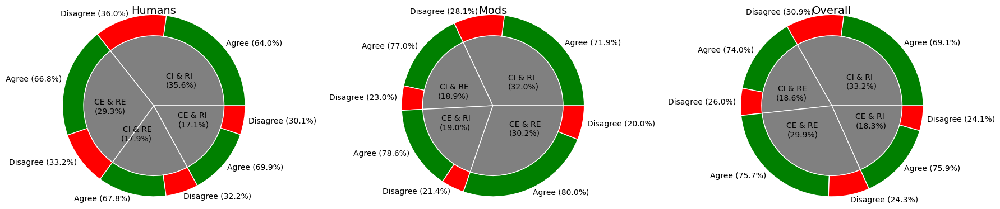

In [175]:
def get_outer_segments(df):
    """Prepare outer donut segments: sizes, labels, and colors."""
    outer_sizes = []
    outer_labels = []
    outer_colors = []

    for _, row in df.iterrows():
        group = row['emi_group']
        share = row['interaction_share']
        disagree = row['disagreement_share']
        agree = 1 - disagree

        outer_sizes += [share * agree, share * disagree]
        outer_labels += [
            f"Agree ({agree:.1%})",
            f"Disagree ({disagree:.1%})"
        ]

        # Colors
        outer_colors += ['green', 'red']
        
    return outer_sizes, outer_labels, outer_colors

def get_inner_segments(df):
    """Prepare inner pie data: sizes, labels, and colors."""
    inner_sizes = df['interaction_share']
    inner_labels = [
        f"{row['emi_group']}\n({row['interaction_share']:.1%})"
        for _, row in df.iterrows()
    ]

    inner_colors = []
    for group in df['emi_group']:
        if group == "PE & CE":
            inner_colors.append("#1F77B4")
        elif group == "PI & CI":
            inner_colors.append("#FF7F0E")
        else:
            inner_colors.append('gray')

    return inner_sizes, inner_labels, inner_colors

def plot_double_donut(ax, df, title):
    """Plot a double donut chart in the given Axes object."""
    inner_sizes, inner_labels, inner_colors = get_inner_segments(df)
    outer_sizes, outer_labels, outer_colors = get_outer_segments(df)

    # Inner pie (full pie chart)
    ax.pie(inner_sizes, radius=1, labels=inner_labels, labeldistance=0.4,
           colors=inner_colors, wedgeprops=dict(edgecolor='white'))

    # Outer donut
    ax.pie(outer_sizes, radius=1.3, labels=outer_labels, labeldistance=1.05,
           colors=outer_colors, wedgeprops=dict(width=0.3, edgecolor='white'))

    ax.set_title(title, fontsize=14)

# --- Plotting the 1x3 layout ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

plot_double_donut(axes[0], emi_summary_humans, "Humans")
plot_double_donut(axes[1], emi_summary_mods, "Mods")
plot_double_donut(axes[2], emi_summary_all, "Overall")

plt.tight_layout()
plt.show()

In [176]:
emi_summary_humans.rename(columns = {"disagreement_share" : "dis_share_humans"}, inplace = True)
emi_summary_mods.rename(columns = {"disagreement_share" : "dis_share_mods"}, inplace = True)
emi_summary_all.rename(columns = {"disagreement_share" : "dis_share_all"}, inplace = True)

emi_summary_plot = emi_summary_mods[["emi_group", "dis_share_mods"]].merge(emi_summary_all[["emi_group", "dis_share_all", "interaction_share"]], 
                                            on = "emi_group").merge(emi_summary_humans[["emi_group", "dis_share_humans"]], on = "emi_group")

emi_summary_plot = pd.melt(emi_summary_plot, id_vars='emi_group', value_vars=['dis_share_mods', 'dis_share_all', 'dis_share_humans'])

emi_summary_plot = emi_summary_plot[emi_summary_plot["emi_group"] != "Mixed/Neutral"].reset_index(drop=True)
emi_summary_plot

,emi_group,variable,value
0,CI & RI,dis_share_mods,0.281036
1,CI & RE,dis_share_mods,0.230231
2,CE & RI,dis_share_mods,0.214121
3,CE & RE,dis_share_mods,0.199966
4,CI & RI,dis_share_all,0.309031
5,CI & RE,dis_share_all,0.259571
6,CE & RI,dis_share_all,0.240714
7,CE & RE,dis_share_all,0.242563
8,CI & RI,dis_share_humans,0.359970
9,CI & RE,dis_share_humans,0.322186


In [177]:
emi_summary_all

,emi_group,dis_share_all,count,interaction_share
3,CI & RI,0.309031,1635211,0.331729
2,CI & RE,0.259571,914448,0.185511
0,CE & RE,0.242563,1475615,0.299353
1,CE & RI,0.240714,903851,0.183361


/tmp/ipykernel_551/2323658431.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, ha='center')


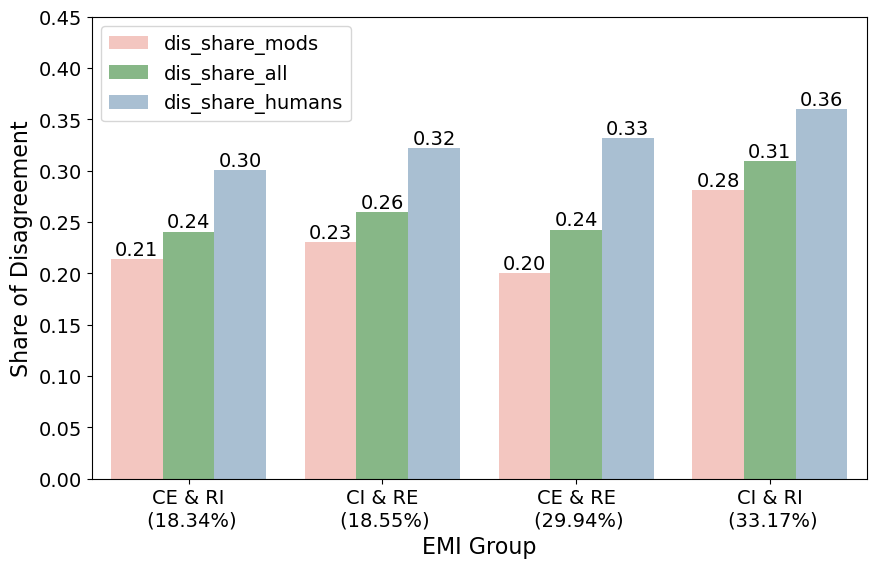

In [178]:
fig, ax = plt.subplots(figsize=(10, 6))  # You can adjust the size here

xtick_label_map = {
    "CE & RE": "CE & RE\n (29.94%)",
    "CI & RI": "CI & RI\n (33.17%)",
    "CE & RI": "CE & RI\n (18.34%)",
    "CI & RE": "CI & RE\n (18.55%)"
}

color_dict = {"dis_share_mods": "salmon",
             "dis_share_humans" : "steelblue",
             "dis_share_all" : "green"}

sorted_order = (
    emi_summary_plot[emi_summary_plot["variable"] == "dis_share_humans"]
    .sort_values("value")["emi_group"]
    .tolist()
) 

# Create barplot
sns.barplot(
    data=emi_summary_plot,
    x="emi_group",
    y="value",
    hue="variable",
    palette=color_dict,
    alpha=0.5,
    order=sorted_order,
    errorbar="sd",
    ax=ax
)

for container in ax.containers:
    for bar in container:
        height = bar.get_height()
        if not pd.isna(height):
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                height,
                f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=14,
                color='black'
            )

new_labels = [xtick_label_map.get(label.get_text(), label.get_text()) for label in ax.get_xticklabels()]
ax.set_xticklabels(new_labels, ha='center')
ax.tick_params(axis='both', labelsize=14)

ax.set_ylim(0, 0.45)
# Set axis labels and title using matplotlib
ax.set_xlabel("EMI Group", fontsize=16)
ax.set_ylabel("Share of Disagreement", fontsize=16)
#ax.set_title("Disagreement Share by EMI Group", fontsize=14)
ax.legend(title="", fontsize = 14)

plt.savefig("plots/Disagreement_EMI_Type_Bars.pdf", bbox_inches='tight')

In [179]:
ax.get_xticklabels()

[Text(0, 0, 'CE & RI\n (18.34%)'),
 Text(1, 0, 'CI & RE\n (18.55%)'),
 Text(2, 0, 'CE & RE\n (29.94%)'),
 Text(3, 0, 'CI & RI\n (33.17%)')]

**Interpretation**


* humans have higher shares of disagreement than mods
* humans: same type (E&E and I&I highest shares)
* mods and overall: when parent starting with I-speaking, highest shares of disagree while lower, when parent starting with E

* absolute minimum: mods, E and E
* absolute maximum: humans, I and I 

In [180]:

# Humans
ideology_alignment_summary = (
    interactions
    .groupby('ideology_alignment')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)
total_interactions = interactions.shape[0]
ideology_alignment_summary['interaction_share'] = ideology_alignment_summary['count'] / total_interactions
ideology_alignment_summary = ideology_alignment_summary.sort_values('disagreement_share', ascending=False)

ideology_alignment_summary

,ideology_alignment,disagreement_share,count,interaction_share
0,Different,0.342860,772785,0.474855
1,Same,0.327341,854626,0.525145


In [181]:

# Humans
ideology_alignment_summary = (
    mod_interactions
    .groupby('ideology_alignment')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)

total_interactions = mod_interactions.shape[0]
ideology_alignment_summary['interaction_share'] = ideology_alignment_summary['count'] / total_interactions
ideology_alignment_summary = ideology_alignment_summary.sort_values('disagreement_share', ascending=False)

ideology_alignment_summary

,ideology_alignment,disagreement_share,count,interaction_share
0,Different,0.239958,1580308,0.4786
1,Same,0.229033,1721633,0.5214


In [182]:

# Humans
ideology_alignment_summary = (
    interactions_all
    .groupby('ideology_alignment')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)
total_interactions = interactions_all.shape[0]
ideology_alignment_summary['interaction_share'] = ideology_alignment_summary['count'] / total_interactions
ideology_alignment_summary = ideology_alignment_summary.sort_values('disagreement_share', ascending=False)

ideology_alignment_summary

,ideology_alignment,disagreement_share,count,interaction_share
0,Different,0.273752,2353093,0.477364
1,Same,0.261645,2576259,0.522636


In [183]:
ideology_summary_humans = (
    interactions
    .groupby('ideology_group')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)

total_interactions = interactions.shape[0]
ideology_summary_humans['interaction_share'] = ideology_summary_humans['count'] / total_interactions
ideology_summary_humans = ideology_summary_humans.sort_values('disagreement_share', ascending=False)

ideology_summary_humans.sort_values('disagreement_share', ascending=False)

,ideology_group,disagreement_share,count,interaction_share
1,CL & RR,0.347790,381797,0.234604
3,CR & RR,0.347199,429399,0.263854
2,CR & RL,0.338046,390988,0.240252
0,CL & RL,0.307288,425227,0.261290


In [184]:
ideology_summary_mods = (
    mod_interactions
    .groupby('ideology_group')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)

total_interactions = mod_interactions.shape[0]
ideology_summary_mods['interaction_share'] = ideology_summary_mods['count'] / total_interactions
ideology_summary_mods = ideology_summary_mods.sort_values('disagreement_share', ascending=False)

ideology_summary_mods.sort_values('disagreement_share', ascending=False)

,ideology_group,disagreement_share,count,interaction_share
3,CR & RR,0.249498,724467,0.219406
2,CR & RL,0.240639,853690,0.258542
1,CL & RR,0.239159,726618,0.220058
0,CL & RL,0.214165,997166,0.301994


In [185]:
ideology_summary_all = (
    interactions_all
    .groupby('ideology_group')
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))
    .reset_index()
)
total_interactions = interactions_all.shape[0]
ideology_summary_all['interaction_share'] = ideology_summary_all['count'] / total_interactions
ideology_summary_all = ideology_summary_all.sort_values('disagreement_share', ascending=False)

ideology_summary_all.sort_values('disagreement_share', ascending=False)

,ideology_group,disagreement_share,count,interaction_share
3,CR & RR,0.285856,1153866,0.234081
1,CL & RR,0.276577,1108415,0.224860
2,CR & RL,0.271237,1244678,0.252503
0,CL & RL,0.242004,1422393,0.288556


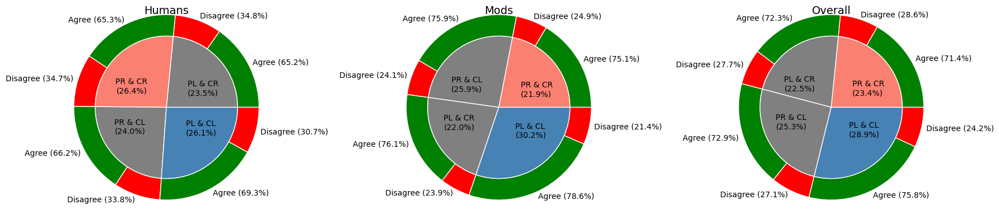

In [159]:
def get_outer_segments(df):
    """Prepare outer donut segments: sizes, labels, and colors."""
    outer_sizes = []
    outer_labels = []
    outer_colors = []

    for _, row in df.iterrows():
        group = row['ideology_group']
        share = row['interaction_share']
        disagree = row['disagreement_share']
        agree = 1 - disagree

        outer_sizes += [share * agree, share * disagree]
        outer_labels += [
            f"Agree ({agree:.1%})",
            f"Disagree ({disagree:.1%})"
        ]

        # Colors
        outer_colors += ['green', 'red']
        
    return outer_sizes, outer_labels, outer_colors

def get_inner_segments(df):
    """Prepare inner pie data: sizes, labels, and colors."""
    inner_sizes = df['interaction_share']
    inner_labels = [
        f"{row['ideology_group']}\n({row['interaction_share']:.1%})"
        for _, row in df.iterrows()
    ]

    inner_colors = []
    for group in df['ideology_group']:
        if group == "PL & CL":
            inner_colors.append('steelblue')
        elif group == "PR & CR":
            inner_colors.append('salmon')
        else:
            inner_colors.append('gray')

    return inner_sizes, inner_labels, inner_colors

def plot_double_donut(ax, df, title):
    """Plot a double donut chart in the given Axes object."""
    inner_sizes, inner_labels, inner_colors = get_inner_segments(df)
    outer_sizes, outer_labels, outer_colors = get_outer_segments(df)

    # Inner pie (full pie chart)
    ax.pie(inner_sizes, radius=1, labels=inner_labels, labeldistance=0.4,
           colors=inner_colors, wedgeprops=dict(edgecolor='white'))

    # Outer donut
    ax.pie(outer_sizes, radius=1.3, labels=outer_labels, labeldistance=1.05,
           colors=outer_colors, wedgeprops=dict(width=0.3, edgecolor='white'))

    ax.set_title(title, fontsize=14)

# --- Plotting the 1x3 layout ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

plot_double_donut(axes[0], ideology_summary_humans, "Humans")
plot_double_donut(axes[1], ideology_summary_mods, "Mods")
plot_double_donut(axes[2], ideology_summary_all, "Overall")

plt.tight_layout()
plt.show()

In [186]:
ideology_summary_humans.rename(columns = {"disagreement_share" : "dis_share_humans"}, inplace = True)
ideology_summary_mods.rename(columns = {"disagreement_share" : "dis_share_mods"}, inplace = True)
ideology_summary_all.rename(columns = {"disagreement_share" : "dis_share_all"}, inplace = True)

ideology_summary_plot = ideology_summary_mods.merge(ideology_summary_all[["ideology_group", "dis_share_all"]], 
                                            on = "ideology_group").merge(ideology_summary_humans[["ideology_group", "dis_share_humans"]], on = "ideology_group")

ideology_summary_plot = pd.melt(ideology_summary_plot, id_vars='ideology_group', value_vars=['dis_share_mods', 'dis_share_all', 'dis_share_humans'])

ideology_summary_plot 

,ideology_group,variable,value
0,CR & RR,dis_share_mods,0.249498
1,CR & RL,dis_share_mods,0.240639
2,CL & RR,dis_share_mods,0.239159
3,CL & RL,dis_share_mods,0.214165
4,CR & RR,dis_share_all,0.285856
5,CR & RL,dis_share_all,0.271237
6,CL & RR,dis_share_all,0.276577
7,CL & RL,dis_share_all,0.242004
8,CR & RR,dis_share_humans,0.347199
9,CR & RL,dis_share_humans,0.338046


In [187]:
ideology_summary_all

,ideology_group,dis_share_all,count,interaction_share
3,CR & RR,0.285856,1153866,0.234081
1,CL & RR,0.276577,1108415,0.224860
2,CR & RL,0.271237,1244678,0.252503
0,CL & RL,0.242004,1422393,0.288556


/tmp/ipykernel_551/2548640302.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, ha='center')


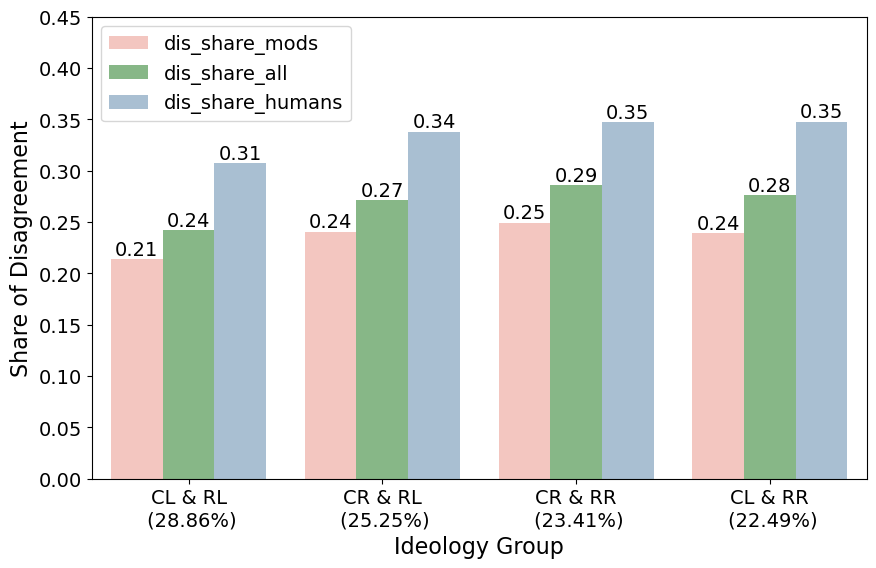

In [188]:
fig, ax = plt.subplots(figsize=(10, 6))  # You can adjust the size here

xtick_label_map = {
    "CR & RR": "CR & RR\n (23.41%)",
    "CL & RL": "CL & RL\n (28.86%)",
    "CR & RL": "CR & RL\n (25.25%)",
    "CL & RR": "CL & RR\n (22.49%)"
}
color_dict = {"dis_share_mods": "salmon",
             "dis_share_humans" : "steelblue",
             "dis_share_all" : "green"}

sorted_order = (
    ideology_summary_plot[ideology_summary_plot["variable"] == "dis_share_humans"]
    .sort_values("value")["ideology_group"]
    .tolist()
) 

# Create barplot
sns.barplot(
    data=ideology_summary_plot,
    x="ideology_group",
    y="value",
    hue="variable",
    palette=color_dict,
    alpha=0.5,
    order=sorted_order,
    errorbar="sd",
    ax=ax
)

for container in ax.containers:
    for bar in container:
        height = bar.get_height()
        if not pd.isna(height):
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                height,
                f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=14,
                color='black'
            )


new_labels = [xtick_label_map.get(label.get_text(), label.get_text()) for label in ax.get_xticklabels()]
ax.set_xticklabels(new_labels, ha='center')
ax.tick_params(axis='both', labelsize=14)


# Set axis labels and title using matplotlib
ax.set_ylim(0, 0.45)
ax.set_xlabel("Ideology Group", fontsize=16)
ax.set_ylabel("Share of Disagreement", fontsize=16)

#ax.set_title("Disagreement Share by Ideology Group", fontsize=14)
ax.legend(title="", loc = "upper left", fontsize = 14)

plt.savefig("plots/Disagreement_Ideology_Type_Bars.pdf", bbox_inches='tight')





**Interpretation**

* Left and left: lowest disagreement for humans and mods
* highest: PL&CR for humans; PR&CR for mods
* 

In [163]:
ideology_summary_humans

,ideology_group,dis_share_humans,count,interaction_share
1,PL & CR,0.347790,381797,0.234604
3,PR & CR,0.347199,429399,0.263854
2,PR & CL,0.338046,390988,0.240252
0,PL & CL,0.307288,425227,0.261290


/tmp/ipykernel_1350/723189130.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=emi_plot_data_humans, x='emi_group', y='dis_share_humans', palette=bar_palette, ax=axes[0])
/tmp/ipykernel_1350/723189130.py:20: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.barplot(data=emi_plot_data_humans, x='emi_group', y='dis_share_humans', palette=bar_palette, ax=axes[0])
/opt/conda/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.11/site-packages/seaborn/categorical.py:1273: FutureWarning: DataFrameGroupBy.apply operated on th

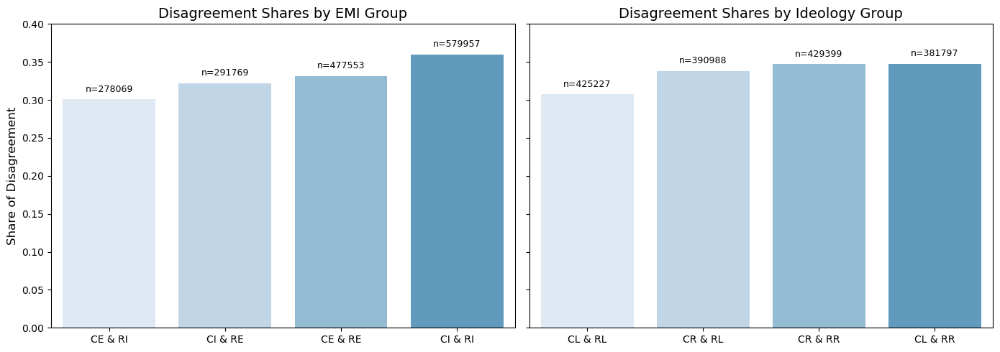

In [51]:
# Set color palette
bar_palette = sns.color_palette("Blues")

# Prepare data
emi_plot_data_humans = (
    emi_summary_humans[emi_summary_humans['emi_group'] != "Mixed/Neutral"]
    .sort_values('dis_share_humans', ascending=True)
    .reset_index(drop=True)
)
ideology_plot_data_humans = (
    ideology_summary_humans
    .sort_values('dis_share_humans', ascending=True)
    .reset_index(drop=True)
)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# --- EMI subplot ---
sns.barplot(data=emi_plot_data_humans, x='emi_group', y='dis_share_humans', palette=bar_palette, ax=axes[0])
axes[0].set_title('Disagreement Shares by EMI Group', fontsize = 14)
axes[0].set_ylabel('Share of Disagreement', fontsize = 12)
axes[0].set_xlabel('')
axes[0].set_ylim(0, 0.4)
axes[0].tick_params(axis='x')

# Annotate counts
for idx, row in emi_plot_data_humans.iterrows():
    axes[0].text(x=idx, y=row['dis_share_humans'] + 0.01, s=f"n={row['count']}", ha='center', fontsize=9)

# --- Ideology subplot ---
sns.barplot(data=ideology_plot_data_humans, x='ideology_group', y='dis_share_humans', palette=bar_palette, ax=axes[1])
axes[1].set_title('Disagreement Shares by Ideology Group', fontsize = 14)
axes[1].set_ylabel('')
axes[1].set_xlabel('')
axes[1].set_ylim(0, 0.4)
axes[1].tick_params(axis='x')

# Annotate counts
for idx, row in ideology_plot_data_humans.iterrows():
    axes[1].text(x=idx, y=row['dis_share_humans'] + 0.01, s=f"n={row['count']}", ha='center', fontsize=9)

plt.tight_layout()
plt.savefig("plots/Disagreement_Shares_EMI_Ideology_Bar.pdf")
plt.show()

In [111]:
test = (
    mod_interactions
    .groupby(['ideology_group'])
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))  # optional
    .reset_index()
)
test

test_hum = (
    interactions
    .groupby(['ideology_group'])
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))  # optional
    .reset_index()
)
test_hum

,ideology_group,disagreement_share,count
0,CL & RL,0.214165,997166
1,CL & RR,0.239159,726618
2,CR & RL,0.240639,853690
3,CR & RR,0.249498,724467


In [144]:
heatmap_table_humans = (
    interactions
    .groupby(['emi_group', 'ideology_group'])
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))  # optional
    .reset_index()
)

# Pivot to matrix form
heatmap_table_humans 


heatmap_table_mods = (
    mod_interactions
    .groupby(['emi_group', 'ideology_group'])
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))  # optional
    .reset_index()
)

# Pivot to matrix form
heatmap_table_mods 

heatmap_table_all = (
    interactions_all
    .groupby(['emi_group', 'ideology_group'])
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))  # optional
    .reset_index()
)

# Pivot to matrix form
heatmap_table_all 

,emi_group,ideology_group,disagreement_share,count
0,CE & RE,CL & RL,0.221018,420668
1,CE & RE,CL & RR,0.251992,330998
2,CE & RE,CR & RL,0.243740,372303
3,CE & RE,CR & RR,0.258217,351646
4,CE & RI,CL & RL,0.214702,275182
5,CE & RI,CL & RR,0.250872,208146
6,CE & RI,CR & RL,0.243932,219959
7,CE & RI,CR & RR,0.262335,200564
8,CI & RE,CL & RL,0.234247,260276
9,CI & RE,CL & RR,0.264038,201217


In [145]:

share_data_humans = heatmap_table_humans[heatmap_table_humans['emi_group'] != "Mixed/Neutral"].pivot(
    index='emi_group', columns='ideology_group', values='disagreement_share')

count_data_humans = heatmap_table_humans[heatmap_table_humans['emi_group'] != "Mixed/Neutral"].pivot(
    index='emi_group', columns='ideology_group', values='count')


share_data_mods = heatmap_table_mods[heatmap_table_mods['emi_group'] != "Mixed/Neutral"].pivot(
    index='emi_group', columns='ideology_group', values='disagreement_share')

count_data_mods = heatmap_table_mods[heatmap_table_mods['emi_group'] != "Mixed/Neutral"].pivot(
    index='emi_group', columns='ideology_group', values='count')


share_data_all = heatmap_table_all[heatmap_table_all['emi_group'] != "Mixed/Neutral"].pivot(
    index='emi_group', columns='ideology_group', values='disagreement_share')

count_data_all = heatmap_table_all[heatmap_table_all['emi_group'] != "Mixed/Neutral"].pivot(
    index='emi_group', columns='ideology_group', values='count')

In [146]:
annot_data_human = share_data_humans.copy().astype(str)

for i in annot_data_human.index:
    for j in annot_data_human.columns:
        share = share_data_humans.loc[i, j]
        count = count_data_humans.loc[i, j]
        if pd.notna(share) and pd.notna(count):
            annot_data_human.loc[i, j] = f"{share:.2f}\n(#{int(count):,})"
        else:
            annot_data_human.loc[i, j] = ""



annot_data_mod = share_data_mods.copy().astype(str)

for i in annot_data_mod.index:
    for j in annot_data_mod.columns:
        share = share_data_mods.loc[i, j]
        count = count_data_mods.loc[i, j]
        if pd.notna(share) and pd.notna(count):
            annot_data_mod.loc[i, j] = f"{share:.2f}\n(#{int(count):,})"
        else:
            annot_data_mod.loc[i, j] = ""


annot_data_all = share_data_all.copy().astype(str)

for i in annot_data_all.index:
    for j in annot_data_all.columns:
        share = share_data_all.loc[i, j]
        count = count_data_all.loc[i, j]
        if pd.notna(share) and pd.notna(count):
            annot_data_all.loc[i, j] = f"{share:.2f}\n(#{int(count):,})"
        else:
            annot_data_all.loc[i, j] = ""



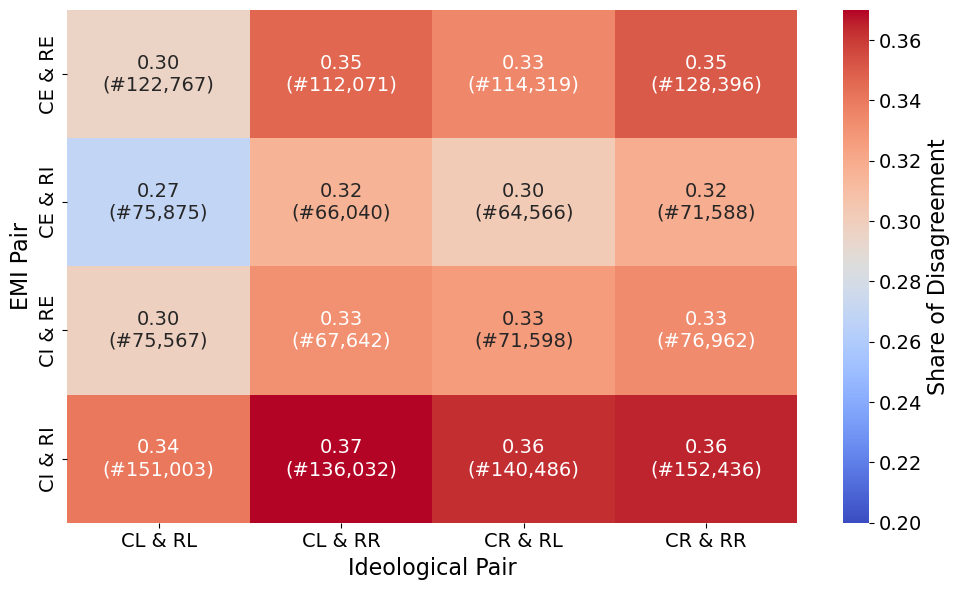

In [147]:
heatmap_data_humans = heatmap_table_humans[heatmap_table_humans['emi_group'] != "Mixed/Neutral"].pivot(index='emi_group', columns='ideology_group', values='disagreement_share')


plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    heatmap_data_humans,
    annot=annot_data_human,
    fmt="",
    cmap="coolwarm",
    #center=0,  # since share is between 0–1, center at 0.5
    cbar_kws={'label': 'Share of Disagreement'},
    vmin = 0.2,
    vmax = 0.37,
    annot_kws={"size": 14}
)

#plt.title("Disagreement Shares by EMI & Ideological Group\n Human Started Discussions", fontsize = 14)
plt.xlabel("Ideological Pair", fontsize = 16)
plt.ylabel("EMI Pair", fontsize = 16)
ax.tick_params(axis='both', labelsize=14)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)  # Change tick label font size
colorbar.set_label('Share of Disagreement', fontsize=16)  # Change label font size


plt.tight_layout()
#plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_humans.pdf")
plt.show()

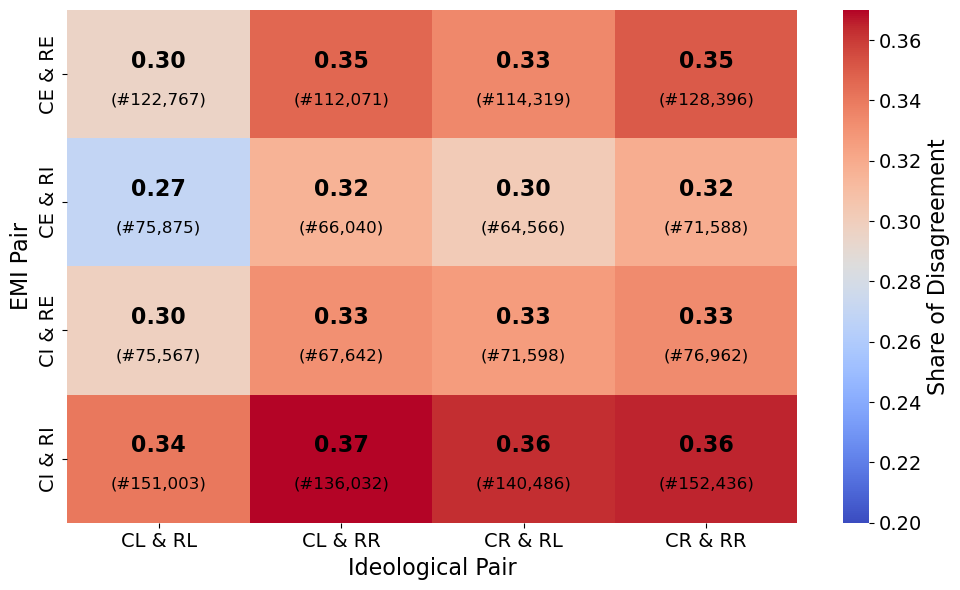

In [99]:
plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    share_data_humans,
    annot=False,  # Turn off default annotations
    cmap="coolwarm",
    cbar_kws={'label': 'Share of Disagreement'},
    vmin=0.2,
    vmax=0.37
)

# Draw custom annotations
for y in range(share_data_humans.shape[0]):
    for x in range(share_data_humans.shape[1]):
        share = share_data_humans.iloc[y, x]
        count = count_data_humans.iloc[y, x]

        if pd.notna(share) and pd.notna(count):
            ax.text(
                x + 0.5, y + 0.4,
                f"{share:.2f}",
                ha='center', va='center',
                fontsize=16, fontweight='bold', color='black'
            )
            ax.text(
                x + 0.5, y + 0.7,
                f"(#{int(count):,})",
                ha='center', va='center',
                fontsize=12, color='black'
            )

# Axis settings
plt.xlabel("Ideological Pair", fontsize=16)
plt.ylabel("EMI Pair", fontsize=16)
ax.tick_params(axis='both', labelsize=14)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)
colorbar.set_label('Share of Disagreement', fontsize=16)

plt.tight_layout()
plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_humans.pdf")
plt.show()

* Col-wise means
    * disagreement shares are the lowest, if both are left leaning
    * and the highest if child is right leaning (PL&CR and PR&CR)
    * if a right leaning user is answering (to same or other, child = r), the disagreement probability is higher
* Row-wise means
    * disagreement is highest, when both are I speaking
    * lowest when parent E and child I $\to$ then, parent evidence child answers with new/different perspektive not disagreeing

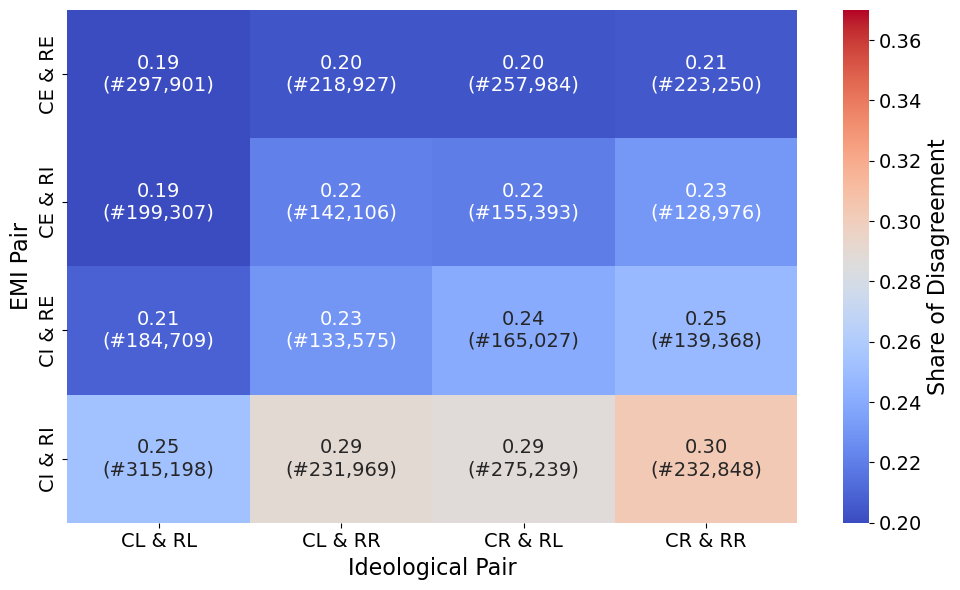

In [100]:
heatmap_data_mods = heatmap_table_mods[heatmap_table_mods['emi_group'] != "Mixed/Neutral"].pivot(index='emi_group', columns='ideology_group', values='disagreement_share')


plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    heatmap_data_mods,
    annot=annot_data_mod,
    fmt="",
    cmap="coolwarm",
    #center=0,  # since share is between 0–1, center at 0.5
    cbar_kws={'label': 'Share of Disagreement'},
    vmin = 0.2,
    vmax = 0.37,
    annot_kws={"size": 14} 
)

#plt.title("Disagreement Shares by EMI & Ideological Group\n Moderator Started Discussions", fontsize = 14)
plt.xlabel("Ideological Pair", fontsize = 16)
plt.ylabel("EMI Pair", fontsize = 16)
ax.tick_params(axis='both', labelsize=14)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)  # Change tick label font size
colorbar.set_label('Share of Disagreement', fontsize=16)  # Change label font size


plt.tight_layout()
#plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_mods.pdf")
plt.show()

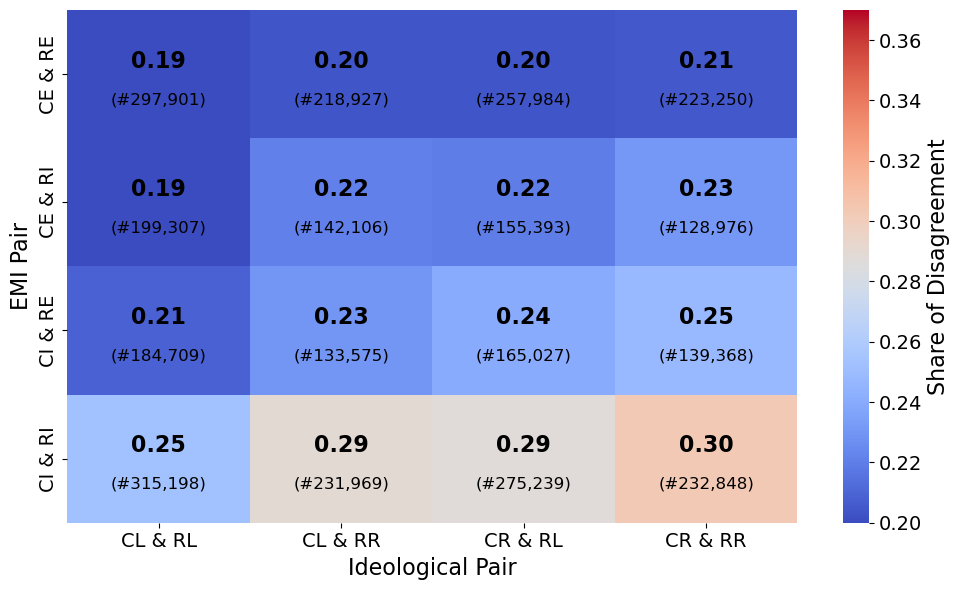

In [101]:
plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    share_data_mods,
    annot=False,  # Turn off default annotations
    cmap="coolwarm",
    cbar_kws={'label': 'Share of Disagreement'},
    vmin=0.2,
    vmax=0.37
)

# Draw custom annotations
for y in range(share_data_mods.shape[0]):
    for x in range(share_data_mods.shape[1]):
        share = share_data_mods.iloc[y, x]
        count = count_data_mods.iloc[y, x]

        if pd.notna(share) and pd.notna(count):
            ax.text(
                x + 0.5, y + 0.4,
                f"{share:.2f}",
                ha='center', va='center',
                fontsize=16, fontweight='bold', color='black'
            )
            ax.text(
                x + 0.5, y + 0.7,
                f"(#{int(count):,})",
                ha='center', va='center',
                fontsize=12, color='black'
            )

# Axis settings
plt.xlabel("Ideological Pair", fontsize=16)
plt.ylabel("EMI Pair", fontsize=16)
ax.tick_params(axis='both', labelsize=14)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)
colorbar.set_label('Share of Disagreement', fontsize=16)

plt.tight_layout()
plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_mods.pdf")
plt.show()

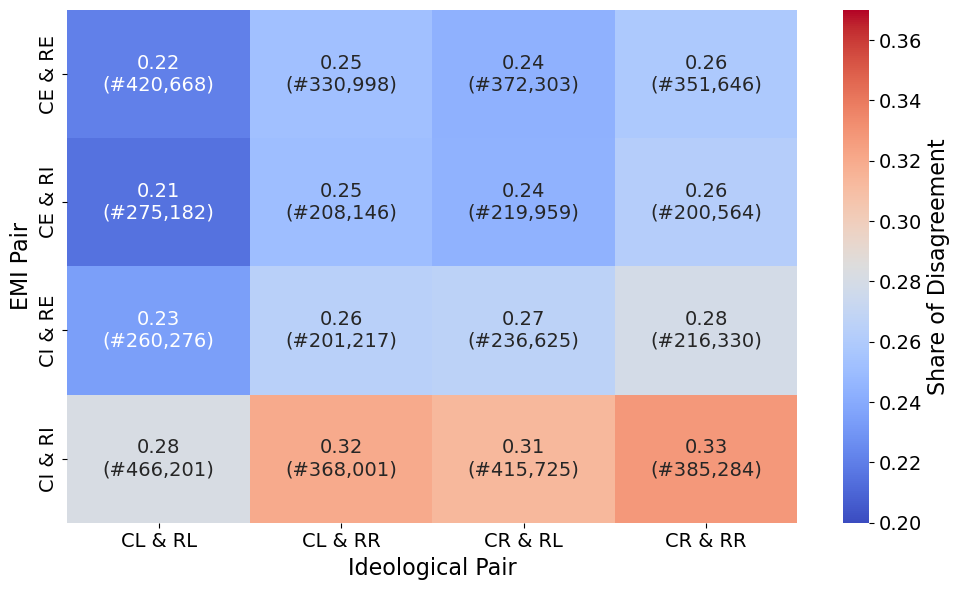

In [102]:
heatmap_data_all = heatmap_table_all[heatmap_table_all['emi_group'] != "Mixed/Neutral"].pivot(index='emi_group', columns='ideology_group', values='disagreement_share')


plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    heatmap_data_all,
    annot=annot_data_all,
    fmt="",
    cmap="coolwarm",
    #center=0,  # since share is between 0–1, center at 0.5
    cbar_kws={'label': 'Share of Disagreement'},
    vmin = 0.2,
    vmax = 0.37,
    annot_kws={"size": 14} 
)

#plt.title("Disagreement Shares by EMI & Ideological Group", fontsize = 14)
plt.xlabel("Ideological Pair", fontsize = 16)
plt.ylabel("EMI Pair", fontsize = 16)
ax.tick_params(axis='both', labelsize=14)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)  # Change tick label font size
colorbar.set_label('Share of Disagreement', fontsize=16)  # Change label font size


plt.tight_layout()
#plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_all.pdf")
plt.show()

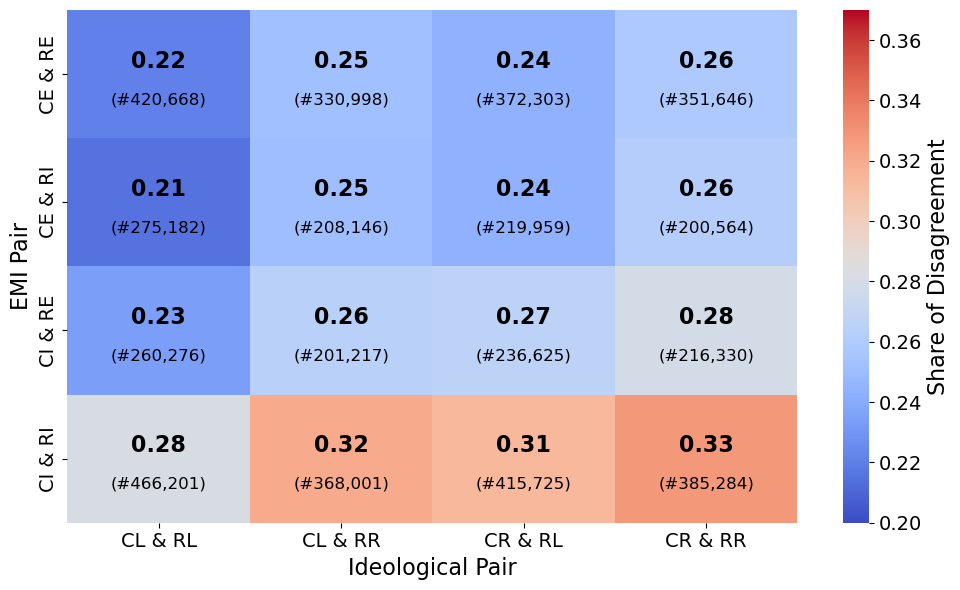

In [103]:
plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    share_data_all,
    annot=False,  # Turn off default annotations
    cmap="coolwarm",
    cbar_kws={'label': 'Share of Disagreement'},
    vmin=0.2,
    vmax=0.37
)

# Draw custom annotations
for y in range(share_data_all.shape[0]):
    for x in range(share_data_all.shape[1]):
        share = share_data_all.iloc[y, x]
        count = count_data_all.iloc[y, x]

        if pd.notna(share) and pd.notna(count):
            ax.text(
                x + 0.5, y + 0.4,
                f"{share:.2f}",
                ha='center', va='center',
                fontsize=16, fontweight='bold', color='black'
            )
            ax.text(
                x + 0.5, y + 0.7,
                f"(#{int(count):,})",
                ha='center', va='center',
                fontsize=12, color='black'
            )

# Axis settings
plt.xlabel("Ideological Pair", fontsize=16)
plt.ylabel("EMI Pair", fontsize=16)
ax.tick_params(axis='both', labelsize=14)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)
colorbar.set_label('Share of Disagreement', fontsize=16)

plt.tight_layout()
plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_all.pdf")
plt.show()

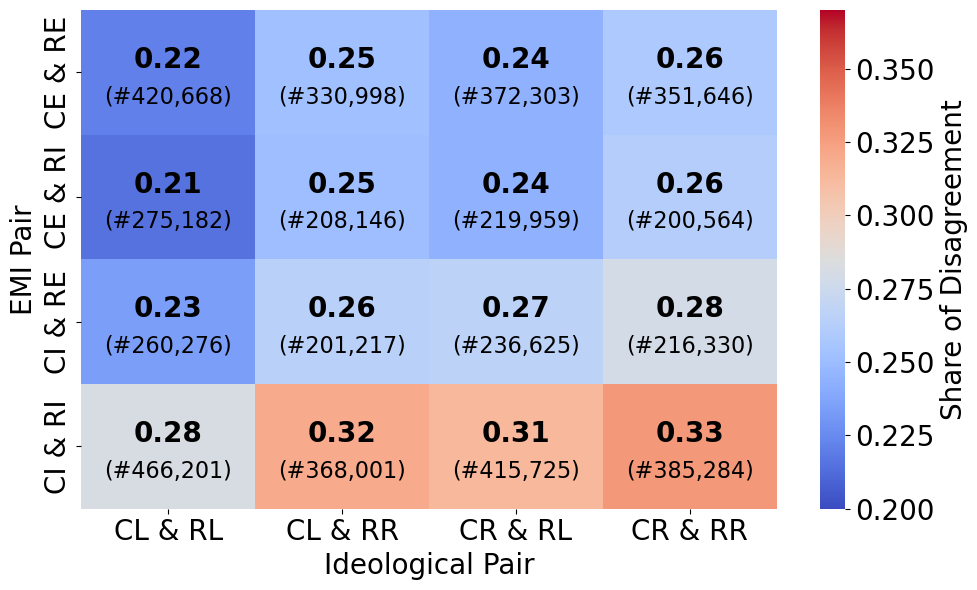

In [104]:
# Paper Version

plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    share_data_all,
    annot=False,  # Turn off default annotations
    cmap="coolwarm",
    cbar_kws={'label': 'Share of Disagreement'},
    vmin=0.2,
    vmax=0.37
)

# Draw custom annotations
for y in range(share_data_all.shape[0]):
    for x in range(share_data_all.shape[1]):
        share = share_data_all.iloc[y, x]
        count = count_data_all.iloc[y, x]

        if pd.notna(share) and pd.notna(count):
            ax.text(
                x + 0.5, y + 0.4,
                f"{share:.2f}",
                ha='center', va='center',
                fontsize=20, fontweight='bold', color='black'
            )
            ax.text(
                x + 0.5, y + 0.7,
                f"(#{int(count):,})",
                ha='center', va='center',
                fontsize=16, color='black'
            )

# Axis settings
plt.xlabel("Ideological Pair", fontsize=20)
plt.ylabel("EMI Pair", fontsize=20)
ax.tick_params(axis='both', labelsize=20)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=20)
colorbar.set_label('Share of Disagreement', fontsize=20)

plt.tight_layout()
plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_all_Paper.pdf")
plt.show()



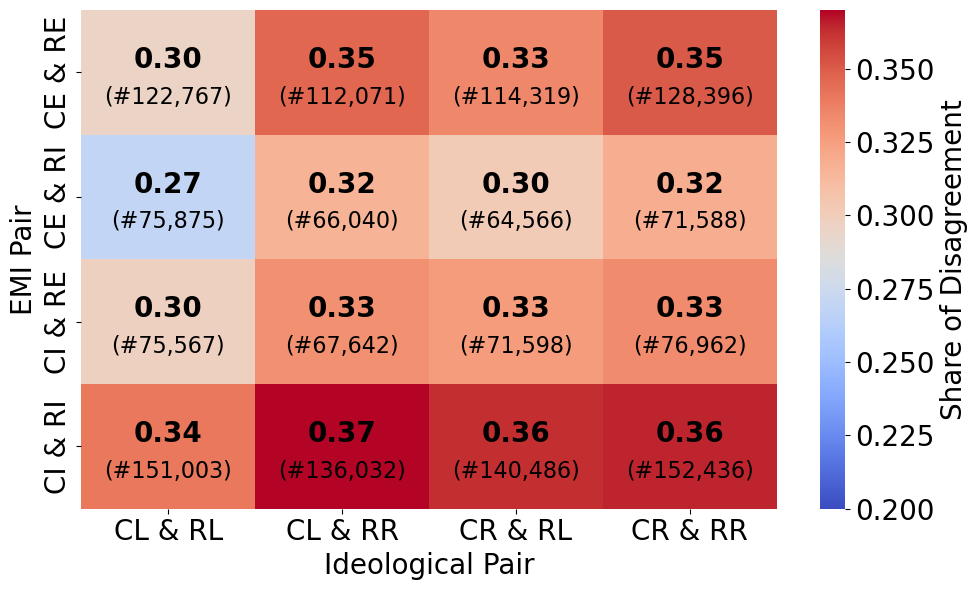

In [105]:
# Paper Version

plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    share_data_humans,
    annot=False,  # Turn off default annotations
    cmap="coolwarm",
    cbar_kws={'label': 'Share of Disagreement'},
    vmin=0.2,
    vmax=0.37
)

# Draw custom annotations
for y in range(share_data_humans.shape[0]):
    for x in range(share_data_humans.shape[1]):
        share = share_data_humans.iloc[y, x]
        count = count_data_humans.iloc[y, x]

        if pd.notna(share) and pd.notna(count):
            ax.text(
                x + 0.5, y + 0.4,
                f"{share:.2f}",
                ha='center', va='center',
                fontsize=20, fontweight='bold', color='black'
            )
            ax.text(
                x + 0.5, y + 0.7,
                f"(#{int(count):,})",
                ha='center', va='center',
                fontsize=16, color='black'
            )

# Axis settings
plt.xlabel("Ideological Pair", fontsize=20)
plt.ylabel("EMI Pair", fontsize=20)
ax.tick_params(axis='both', labelsize=20)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=20)
colorbar.set_label('Share of Disagreement', fontsize=20)

plt.tight_layout()
plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_humans_Paper.pdf")
plt.show()



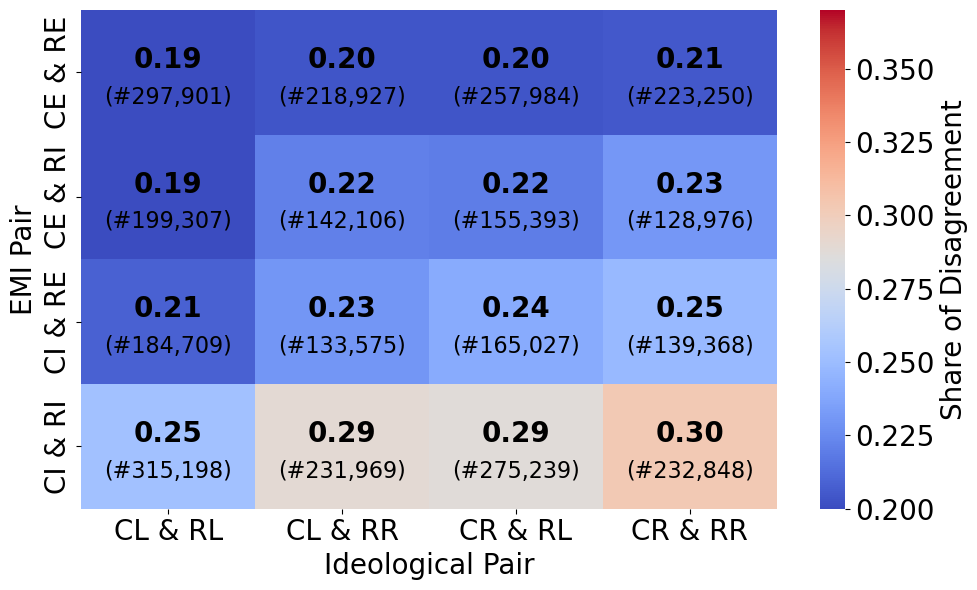

In [106]:
# Paper Version

plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    share_data_mods,
    annot=False,  # Turn off default annotations
    cmap="coolwarm",
    cbar_kws={'label': 'Share of Disagreement'},
    vmin=0.2,
    vmax=0.37
)

# Draw custom annotations
for y in range(share_data_mods.shape[0]):
    for x in range(share_data_mods.shape[1]):
        share = share_data_mods.iloc[y, x]
        count = count_data_mods.iloc[y, x]

        if pd.notna(share) and pd.notna(count):
            ax.text(
                x + 0.5, y + 0.4,
                f"{share:.2f}",
                ha='center', va='center',
                fontsize=20, fontweight='bold', color='black'
            )
            ax.text(
                x + 0.5, y + 0.7,
                f"(#{int(count):,})",
                ha='center', va='center',
                fontsize=16, color='black'
            )

# Axis settings
plt.xlabel("Ideological Pair", fontsize=20)
plt.ylabel("EMI Pair", fontsize=20)
ax.tick_params(axis='both', labelsize=20)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=20)
colorbar.set_label('Share of Disagreement', fontsize=20)

plt.tight_layout()
plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_mods_Paper.pdf")
plt.show()



**20% most active humans**

In [137]:
activity_by_submission = interactions.groupby("submission_id").agg(
    activity = ("msg_id_parent", 'count')
).reset_index().sort_values(by = "activity", ascending = False).reset_index(drop = True)

print(len(activity_by_submission)* 0.2)
text_x
active_submissions_humans = activity_by_submission.iloc[:19752]
active_submissions_humans

19752.0


,submission_id,activity
0,6g0srl,19941
1,9jcub5,16694
2,43ozro,12677
3,9jfa9a,9699
4,jn26hz,9450
...,...,...
19747,oulkck,12
19748,2becmo,12
19749,xjxqj,12
19750,3ssqvx,12


In [139]:

active_human_data = (
    interactions[interactions["submission_id"].isin(active_submissions_humans["submission_id"])]
    .groupby(['emi_group'])
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))  # optional
    .reset_index()
)
active_human_data

,emi_group,disagreement_share,count
0,CE & RE,0.310700,381957
1,CE & RI,0.283267,232138
2,CI & RE,0.305072,248358
3,CI & RI,0.344230,495087
4,Mixed/Neutral,0.148148,54


In [140]:
heatmap_table_humans_active = (
    interactions[interactions["submission_id"].isin(active_submissions_humans["submission_id"])]
    .groupby(['emi_group', 'ideology_group'])
    .agg(disagreement_share=('disagreement_label', 'mean'),
         count=('disagreement_label', 'count'))  # optional
    .reset_index()
)

heatmap_table_humans_active 


,emi_group,ideology_group,disagreement_share,count
0,CE & RE,CL & RL,0.221018,420668
1,CE & RE,CL & RR,0.251992,330998
2,CE & RE,CR & RL,0.243740,372303
3,CE & RE,CR & RR,0.258217,351646
4,CE & RI,CL & RL,0.214702,275182
5,CE & RI,CL & RR,0.250872,208146
6,CE & RI,CR & RL,0.243932,219959
7,CE & RI,CR & RR,0.262335,200564
8,CI & RE,CL & RL,0.234247,260276
9,CI & RE,CL & RR,0.264038,201217


In [141]:

share_data_humans = heatmap_table_humans_active[heatmap_table_humans_active['emi_group'] != "Mixed/Neutral"].pivot(
    index='emi_group', columns='ideology_group', values='disagreement_share')

count_data_humans = heatmap_table_humans_active[heatmap_table_humans_active['emi_group'] != "Mixed/Neutral"].pivot(
    index='emi_group', columns='ideology_group', values='count')

annot_data_human = share_data_humans.copy().astype(str)

for i in annot_data_human.index:
    for j in annot_data_human.columns:
        share = share_data_humans.loc[i, j]
        count = count_data_humans.loc[i, j]
        if pd.notna(share) and pd.notna(count):
            annot_data_human.loc[i, j] = f"{share:.2f}\n(#{int(count):,})"
        else:
            annot_data_human.loc[i, j] = ""


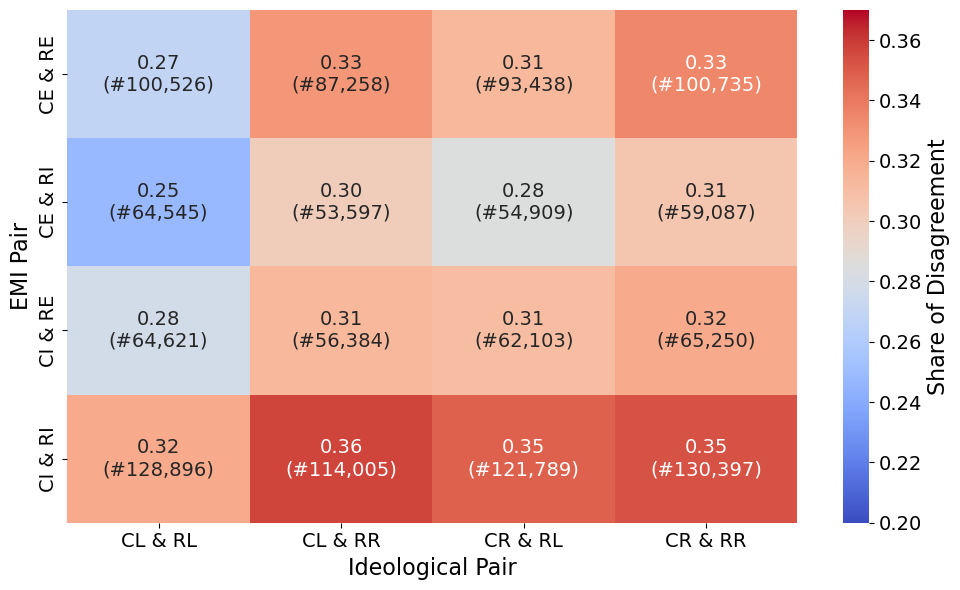

In [143]:
heatmap_data_humans = heatmap_table_humans[heatmap_table_humans['emi_group'] != "Mixed/Neutral"].pivot(index='emi_group', columns='ideology_group', values='disagreement_share')


plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    heatmap_table_humans_active,
    annot=annot_data_human,
    fmt="",
    cmap="coolwarm",
    #center=0,  # since share is between 0–1, center at 0.5
    cbar_kws={'label': 'Share of Disagreement'},
    vmin = 0.2,
    vmax = 0.37,
    annot_kws={"size": 14}
)

#plt.title("Disagreement Shares by EMI & Ideological Group\n Human Started Discussions", fontsize = 14)
plt.xlabel("Ideological Pair", fontsize = 16)
plt.ylabel("EMI Pair", fontsize = 16)
ax.tick_params(axis='both', labelsize=14)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)  # Change tick label font size
colorbar.set_label('Share of Disagreement', fontsize=16)  # Change label font size


plt.tight_layout()
#plt.savefig("plots/Disagreement_Confusion_EMI_Ideology_humans.pdf")
plt.show()

***
# **CORRELATIONS**
## **Impact of submission on parents and parents on childern**

In [169]:

corr = interactions[['finetuned_submission_len_EMI_z_trans', 'finetuned_parent_len_EMI_z_trans', 'finetuned_child_len_EMI_z_trans']].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Finetuned, len_EMI_z")


,finetuned_submission_len_EMI_z_trans,finetuned_parent_len_EMI_z_trans,finetuned_child_len_EMI_z_trans
finetuned_submission_len_EMI_z_trans,1.000000,0.197208,0.150160
finetuned_parent_len_EMI_z_trans,0.197208,1.000000,0.409885
finetuned_child_len_EMI_z_trans,0.150160,0.409885,1.000000


In [170]:

corr = interactions[['finetuned_submission_len_norm_z_trans_EMI', 'finetuned_parent_len_norm_z_trans_EMI', 'finetuned_child_len_norm_z_trans_EMI']].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Finetuned, len_z_EMI")



,finetuned_submission_len_norm_z_trans_EMI,finetuned_parent_len_norm_z_trans_EMI,finetuned_child_len_norm_z_trans_EMI
finetuned_submission_len_norm_z_trans_EMI,1.000000,0.187986,0.143008
finetuned_parent_len_norm_z_trans_EMI,0.187986,1.000000,0.412359
finetuned_child_len_norm_z_trans_EMI,0.143008,0.412359,1.000000


In [171]:

corr = interactions[['self_submission_len_EMI_z_trans', 'self_parent_len_EMI_z_trans', 'self_child_len_EMI_z_trans']].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Self, len_EMI_z")


,self_submission_len_EMI_z_trans,self_parent_len_EMI_z_trans,self_child_len_EMI_z_trans
self_submission_len_EMI_z_trans,1.000000,0.237225,0.180342
self_parent_len_EMI_z_trans,0.237225,1.000000,0.425778
self_child_len_EMI_z_trans,0.180342,0.425778,1.000000


In [172]:

corr = interactions[['self_submission_len_norm_z_trans_EMI', 'self_parent_len_norm_z_trans_EMI', 'self_child_len_norm_z_trans_EMI']].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Self, len_z_EMI")



,self_submission_len_norm_z_trans_EMI,self_parent_len_norm_z_trans_EMI,self_child_len_norm_z_trans_EMI
self_submission_len_norm_z_trans_EMI,1.000000,0.218787,0.166029
self_parent_len_norm_z_trans_EMI,0.218787,1.000000,0.422203
self_child_len_norm_z_trans_EMI,0.166029,0.422203,1.000000


**Interpretation**

* parents speaking on childs speaking: correlation of 0.3
* finetuned stronger than self

#### **Submission on discussions**

* Discussions EMI is mean of parent and child

In [173]:

corr = interactions[['finetuned_submission_len_EMI_z_trans', 'finetuned_submission_len_norm_z_trans_EMI', 'mean_EMI_interaction_ft_EMI_z', 'mean_EMI_interaction_ft_z_EMI']].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")



,finetuned_submission_len_EMI_z_trans,finetuned_submission_len_norm_z_trans_EMI,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI
finetuned_submission_len_EMI_z_trans,1.000000,0.992468,0.207006,0.205983
finetuned_submission_len_norm_z_trans_EMI,0.992468,1.000000,0.196425,0.197591
mean_EMI_interaction_ft_EMI_z,0.207006,0.196425,1.000000,0.993855
mean_EMI_interaction_ft_z_EMI,0.205983,0.197591,0.993855,1.000000


In [174]:
corr = interactions[['self_submission_len_EMI_z_trans', 'self_submission_len_norm_z_trans_EMI',  'mean_EMI_interaction_sb_EMI_z',  'mean_EMI_interaction_sb_z_EMI']].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")


,self_submission_len_EMI_z_trans,self_submission_len_norm_z_trans_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI
self_submission_len_EMI_z_trans,1.000000,0.982770,0.247366,0.251828
self_submission_len_norm_z_trans_EMI,0.982770,1.000000,0.220265,0.228617
mean_EMI_interaction_sb_EMI_z,0.247366,0.220265,1.000000,0.997036
mean_EMI_interaction_sb_z_EMI,0.251828,0.228617,0.997036,1.000000


**Interpretation**

* Finetuned model: higher correlation of submission on interactions (0.16-0.17).
* Order of EMI and z-trans not really

* $\to$ submission has a positive impact on interactiosn speaking, but only low (around 0.15 to 0.2)

## **Correlation of interactions mean-EMI with Stance**

* very small, negative correlation $\to$ higher EMI (E speaking), lower probability for disagreement

In [175]:
corr = interactions[['mean_EMI_interaction_ft_EMI_z', 'mean_EMI_interaction_ft_z_EMI', 'mean_EMI_interaction_sb_EMI_z', 'mean_EMI_interaction_sb_z_EMI', "prob_disagree"]].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")



,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI,prob_disagree
mean_EMI_interaction_ft_EMI_z,1.000000,0.993855,0.965681,0.962709,-0.042395
mean_EMI_interaction_ft_z_EMI,0.993855,1.000000,0.962743,0.955637,-0.037156
mean_EMI_interaction_sb_EMI_z,0.965681,0.962743,1.000000,0.997036,-0.037736
mean_EMI_interaction_sb_z_EMI,0.962709,0.955637,0.997036,1.000000,-0.042043
prob_disagree,-0.042395,-0.037156,-0.037736,-0.042043,1.000000


In [176]:
corr = mod_interactions[['mean_EMI_interaction_ft_EMI_z', 'mean_EMI_interaction_ft_z_EMI', 'mean_EMI_interaction_sb_EMI_z', 'mean_EMI_interaction_sb_z_EMI', "prob_disagree"]].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")



,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI,prob_disagree
mean_EMI_interaction_ft_EMI_z,1.000000,0.998002,0.961375,0.958784,-0.090607
mean_EMI_interaction_ft_z_EMI,0.998002,1.000000,0.962279,0.955364,-0.083099
mean_EMI_interaction_sb_EMI_z,0.961375,0.962279,1.000000,0.995496,-0.075777
mean_EMI_interaction_sb_z_EMI,0.958784,0.955364,0.995496,1.000000,-0.082229
prob_disagree,-0.090607,-0.083099,-0.075777,-0.082229,1.000000


In [177]:
corr = interactions_all[['mean_EMI_interaction_ft_EMI_z', 'mean_EMI_interaction_ft_z_EMI', 'mean_EMI_interaction_sb_EMI_z', 'mean_EMI_interaction_sb_z_EMI', "prob_disagree"]].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")



,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI,prob_disagree
mean_EMI_interaction_ft_EMI_z,1.000000,0.996561,0.962741,0.959930,-0.077900
mean_EMI_interaction_ft_z_EMI,0.996561,1.000000,0.962342,0.955283,-0.071042
mean_EMI_interaction_sb_EMI_z,0.962741,0.962342,1.000000,0.996021,-0.068918
mean_EMI_interaction_sb_z_EMI,0.959930,0.955283,0.996021,1.000000,-0.075223
prob_disagree,-0.077900,-0.071042,-0.068918,-0.075223,1.000000


**Needed**

* Significance test

## **Shift in EMI Styles correlation with Label**

* Make Style Shift:  EMI_child - parent
* Correlation to probability for disagreement

In [178]:
interactions["diff_EMI_interaction_ft_EMI_z"] = interactions["finetuned_child_len_EMI_z_trans"] - interactions["finetuned_parent_len_EMI_z_trans"]
interactions["diff_EMI_interaction_ft_z_EMI"] = interactions["finetuned_child_len_norm_z_trans_EMI"] - interactions["finetuned_parent_len_norm_z_trans_EMI"]

interactions["diff_EMI_interaction_sb_EMI_z"] = interactions["self_child_len_EMI_z_trans"] - interactions["self_parent_len_EMI_z_trans"]
interactions["diff_EMI_interaction_sb_z_EMI"] = interactions["self_child_len_norm_z_trans_EMI"] - interactions["self_parent_len_norm_z_trans_EMI"]


mod_interactions["diff_EMI_interaction_ft_EMI_z"] = mod_interactions["finetuned_child_len_EMI_z_trans"] - mod_interactions["finetuned_parent_len_EMI_z_trans"]
mod_interactions["diff_EMI_interaction_ft_z_EMI"] = mod_interactions["finetuned_child_len_norm_z_trans_EMI"] - mod_interactions["finetuned_parent_len_norm_z_trans_EMI"]

mod_interactions["diff_EMI_interaction_sb_EMI_z"] = mod_interactions["self_child_len_EMI_z_trans"] - mod_interactions["self_parent_len_EMI_z_trans"]
mod_interactions["diff_EMI_interaction_sb_z_EMI"] = mod_interactions["self_child_len_norm_z_trans_EMI"] - mod_interactions["self_parent_len_norm_z_trans_EMI"]

interactions_all["diff_EMI_interaction_ft_EMI_z"] = interactions_all["finetuned_child_len_EMI_z_trans"] - interactions_all["finetuned_parent_len_EMI_z_trans"]
interactions_all["diff_EMI_interaction_ft_z_EMI"] = interactions_all["finetuned_child_len_norm_z_trans_EMI"] - interactions_all["finetuned_parent_len_norm_z_trans_EMI"]

interactions_all["diff_EMI_interaction_sb_EMI_z"] = interactions_all["self_child_len_EMI_z_trans"] - interactions_all["self_parent_len_EMI_z_trans"]
interactions_all["diff_EMI_interaction_sb_z_EMI"] = interactions_all["self_child_len_norm_z_trans_EMI"] - interactions_all["self_parent_len_norm_z_trans_EMI"]


In [179]:
corr = interactions[["diff_EMI_interaction_ft_EMI_z", "diff_EMI_interaction_ft_z_EMI", "diff_EMI_interaction_sb_EMI_z", "diff_EMI_interaction_sb_z_EMI", "prob_disagree"]].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")


,diff_EMI_interaction_ft_EMI_z,diff_EMI_interaction_ft_z_EMI,diff_EMI_interaction_sb_EMI_z,diff_EMI_interaction_sb_z_EMI,prob_disagree
diff_EMI_interaction_ft_EMI_z,1.000000,0.991819,0.939047,0.935198,0.020465
diff_EMI_interaction_ft_z_EMI,0.991819,1.000000,0.934875,0.927285,0.024916
diff_EMI_interaction_sb_EMI_z,0.939047,0.934875,1.000000,0.996170,0.020931
diff_EMI_interaction_sb_z_EMI,0.935198,0.927285,0.996170,1.000000,0.019610
prob_disagree,0.020465,0.024916,0.020931,0.019610,1.000000


In [180]:
corr = mod_interactions[["diff_EMI_interaction_ft_EMI_z", "diff_EMI_interaction_ft_z_EMI", "diff_EMI_interaction_sb_EMI_z", "diff_EMI_interaction_sb_z_EMI", "prob_disagree"]].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")


,diff_EMI_interaction_ft_EMI_z,diff_EMI_interaction_ft_z_EMI,diff_EMI_interaction_sb_EMI_z,diff_EMI_interaction_sb_z_EMI,prob_disagree
diff_EMI_interaction_ft_EMI_z,1.000000,0.997105,0.940061,0.935042,0.022347
diff_EMI_interaction_ft_z_EMI,0.997105,1.000000,0.939390,0.930362,0.031938
diff_EMI_interaction_sb_EMI_z,0.940061,0.939390,1.000000,0.994887,0.027561
diff_EMI_interaction_sb_z_EMI,0.935042,0.930362,0.994887,1.000000,0.024891
prob_disagree,0.022347,0.031938,0.027561,0.024891,1.000000


In [181]:
corr = interactions_all[["diff_EMI_interaction_ft_EMI_z", "diff_EMI_interaction_ft_z_EMI", "diff_EMI_interaction_sb_EMI_z", "diff_EMI_interaction_sb_z_EMI", "prob_disagree"]].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")


,diff_EMI_interaction_ft_EMI_z,diff_EMI_interaction_ft_z_EMI,diff_EMI_interaction_sb_EMI_z,diff_EMI_interaction_sb_z_EMI,prob_disagree
diff_EMI_interaction_ft_EMI_z,1.000000,0.995434,0.939748,0.935082,0.022552
diff_EMI_interaction_ft_z_EMI,0.995434,1.000000,0.937979,0.929386,0.030637
diff_EMI_interaction_sb_EMI_z,0.939748,0.937979,1.000000,0.995276,0.026626
diff_EMI_interaction_sb_z_EMI,0.935082,0.929386,0.995276,1.000000,0.024708
prob_disagree,0.022552,0.030637,0.026626,0.024708,1.000000


**Interpretation**

* overall interaction tone more evidence $\to$ less disagreement
* large positive shift in EMI tone (more evidence in reply) $\to$ more disagreement
    * when reply diverges from parent (especially towards evidence) disagreement is more likely
 
* Tone Alignment $\to$ less disagreement
* Tone mismatch $\to$ more disagreement

In [182]:
interactions.to_csv(f"../../data/analysis_data/interactions_{scores}.csv", index = False)
mod_interactions.to_csv(f"../../data/analysis_data/mod_interactions_{scores}.csv", index = False)
interactions_all.to_csv(f"../../data/analysis_data/interactions_all_{scores}.csv", index = False)

In [9]:
interactions = pd.read_csv(f"../../data/analysis_data/interactions_{scores}.csv")
mod_interactions = pd.read_csv(f"../../data/analysis_data/mod_interactions_{scores}.csv")
interactions_all = pd.read_csv(f"../../data/analysis_data/interactions_all_{scores}.csv")
interactions

/tmp/ipykernel_433/2509166945.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactions = pd.read_csv("../data/analysis_data/interactions.csv")
/tmp/ipykernel_433/2509166945.py:3: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactions_all = pd.read_csv("../data/analysis_data/interactions_all.csv")


,msg_id_parent,msg_id_child,submission_id,subreddit,exact_time_child,author_child,author_parent,author_submission,finetuned_child_E_norm,finetuned_child_I_norm,...,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI,disagreement_label,ideology_group,emi_group,emi_alignment,diff_EMI_interaction_ft_EMI_z,diff_EMI_interaction_ft_z_EMI,diff_EMI_interaction_sb_EMI_z,diff_EMI_interaction_sb_z_EMI
0,c7ecp8d,c7ecs2n,14m325,Ask_Politics,1355166551.0,karmanaut,ramblin_dash,karmanaut,0.056203,0.047469,...,1.083606,0.869764,0,PR & CR,PE & CE,Same,-0.622399,-0.523370,-0.835601,-0.740570
1,c7ecp8d,c7ecxpk,14m325,Ask_Politics,1355167049.0,zoolander951,ramblin_dash,karmanaut,0.084537,0.065886,...,1.275952,1.050941,0,PR & CR,PE & CE,Same,-0.488626,-0.410665,-0.450910,-0.378217
2,c7ecp8d,c7eflag,14m325,Ask_Politics,1355175187.0,zossima,ramblin_dash,karmanaut,0.038321,-0.036267,...,1.384719,1.172071,0,PR & CL,PE & CE,Same,0.265927,0.142645,-0.233374,-0.135957
3,c7efx8q,c7ejh1d,14m325,Ask_Politics,1355187644.0,fathermocker,senatorskeletor,karmanaut,0.028981,-0.000700,...,1.092316,0.958027,1,PR & CL,PE & CE,Same,0.117898,0.080366,-0.495538,-0.458965
4,c7efx8q,c7f8140,14m325,Ask_Politics,1355286254.0,pkmkii,senatorskeletor,karmanaut,0.018974,-0.067049,...,1.419194,1.271953,0,PR & CL,PE & CE,Same,0.877917,0.652300,0.158219,0.168888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1627406,kfkh5ib,kfmd52k,18uirzt,politics,1970-01-01 00:00:01.703977996,knightforlife,freddiethebaer,optimalg,0.249565,0.178504,...,1.389137,1.147364,0,PL & CR,PE & CE,Same,-2.956617,-2.292891,-2.031503,-1.867457
1627407,kfklsb6,kforzbx,18uirzt,politics,1970-01-01 00:00:01.704023024,bakerfredricka,4blockhead,optimalg,0.152297,0.168448,...,0.977627,0.895692,0,PL & CL,PE & CI,Different,-2.458585,-1.891923,-0.880219,-1.159231
1627408,kfmq5kr,kfp6tzv,18uirzt,politics,1970-01-01 00:00:01.704032059,glassjar1,doubletfan,optimalg,0.059733,0.064333,...,NaN,NaN,1,PL & CL,PE & CI,Different,-0.811785,-0.614638,NaN,NaN
1627409,kfp3d4v,kfp8xh8,18uirzt,politics,1970-01-01 00:00:01.704033069,haulinboats,4blockhead,optimalg,0.111970,0.181527,...,0.355381,0.226370,0,PL & CR,PI & CI,Same,-0.580105,-0.381544,-1.445805,-1.483449


***
# **DISCUSSION LEVEL**

In [183]:
interactions_long = pd.melt(
    interactions,
    id_vars=["submission_id"],
    value_vars=["parent_partisan", "child_partisan"],
    value_name="ideology_score"
)

interactions_long

,submission_id,variable,ideology_score
0,14m325,parent_partisan,0.017145
1,14m325,parent_partisan,0.017145
2,14m325,parent_partisan,0.017145
3,14m325,parent_partisan,0.013507
4,14m325,parent_partisan,0.013507
...,...,...,...
3254817,18uirzt,child_partisan,0.013192
3254818,18uirzt,child_partisan,-0.066138
3254819,18uirzt,child_partisan,-0.019897
3254820,18uirzt,child_partisan,0.033772


In [184]:
mean_partisan_all = interactions_long.groupby("submission_id")["ideology_score"].mean().reset_index()
mean_partisan_all.rename(columns={"ideology_score": "mean_overall_partisan"}, inplace=True)
mean_partisan_all

,submission_id,mean_overall_partisan
0,1001a3h,-0.043253
1,1001mh,0.006824
2,1003k02,-0.007329
3,10045jv,0.008453
4,1004fx,0.008347
...,...,...
98755,zzlqg,0.027435
98756,zzmjp,0.058073
98757,zznjb,0.012120
98758,zzpai,-0.000736


In [185]:
discussions_ft = interactions.groupby(["submission_id", 'finetuned_submission_len_EMI_z_trans', 'finetuned_submission_len_norm_z_trans_EMI', 'submission_partisan'])[[
    'finetuned_parent_len_EMI_z_trans', 'finetuned_child_len_EMI_z_trans',
    'finetuned_parent_len_norm_z_trans_EMI', 'finetuned_child_len_norm_z_trans_EMI',
    'disagreement_label', 'parent_partisan', 'child_partisan', 'prob_disagree']].agg(
        
    mean_comment_EMI_z = ('finetuned_parent_len_EMI_z_trans', 'mean'),
    mean_comment_z_EMI = ('finetuned_parent_len_norm_z_trans_EMI', 'mean'),
    mean_reply_EMI_z = ('finetuned_child_len_EMI_z_trans', 'mean'),
    mean_reply_z_EMI = ('finetuned_child_len_norm_z_trans_EMI', 'mean'),
    mean_comment_partisan = ('parent_partisan', 'mean'),
    mean_reply_partisan = ('child_partisan', 'mean'),
    
    disagreement_share=('disagreement_label', 'mean'),
    disagreement_prob=('prob_disagree', 'mean'),
    count=('disagreement_label', 'count')
                                       ).reset_index()


discussions_ft

,submission_id,finetuned_submission_len_EMI_z_trans,finetuned_submission_len_norm_z_trans_EMI,submission_partisan,mean_comment_EMI_z,mean_comment_z_EMI,mean_reply_EMI_z,mean_reply_z_EMI,mean_comment_partisan,mean_reply_partisan,disagreement_share,disagreement_prob,count
0,1001a3h,-0.584611,-0.528297,-0.024883,0.574257,0.327630,-0.052909,-0.061474,-0.064894,-0.021611,0.066667,0.161273,30
1,1001mh,0.522836,0.301466,-0.064851,0.997137,0.688532,1.243207,0.855889,-0.011297,0.024944,0.500000,0.679300,2
2,1003k02,-1.131063,-0.972239,0.024446,-0.879966,-0.713918,-0.468992,-0.370956,-0.009656,-0.005001,0.400000,0.462520,65
3,10045jv,0.422146,0.340958,0.002140,0.001573,0.054011,0.540097,0.364103,0.015380,0.001526,0.428571,0.534057,7
4,1004fx,-1.040226,-0.667593,0.025923,-0.285864,-0.182684,-0.007247,0.120106,-0.009228,0.025923,0.000000,0.131000,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
98747,zzlqg,1.127682,0.761058,-0.038505,1.506575,0.997439,1.225454,0.832480,0.061682,-0.006812,0.000000,0.530750,2
98748,zzmjp,-0.848453,-0.633564,0.047185,0.450827,0.123490,0.047159,0.056649,0.068961,0.047185,1.000000,0.961400,1
98749,zznjb,0.866848,0.837495,0.032763,-0.461530,-0.277738,1.161839,0.861455,0.004935,0.019306,0.000000,0.025200,1
98750,zzpai,0.337770,0.161616,0.050234,1.027653,0.616629,1.164094,0.717769,-0.051705,0.050234,1.000000,0.653300,1


In [186]:
discussions_ft = discussions_ft.merge(mean_partisan_all, on="submission_id", how="left")
discussions_ft

,submission_id,finetuned_submission_len_EMI_z_trans,finetuned_submission_len_norm_z_trans_EMI,submission_partisan,mean_comment_EMI_z,mean_comment_z_EMI,mean_reply_EMI_z,mean_reply_z_EMI,mean_comment_partisan,mean_reply_partisan,disagreement_share,disagreement_prob,count,mean_overall_partisan
0,1001a3h,-0.584611,-0.528297,-0.024883,0.574257,0.327630,-0.052909,-0.061474,-0.064894,-0.021611,0.066667,0.161273,30,-0.043253
1,1001mh,0.522836,0.301466,-0.064851,0.997137,0.688532,1.243207,0.855889,-0.011297,0.024944,0.500000,0.679300,2,0.006824
2,1003k02,-1.131063,-0.972239,0.024446,-0.879966,-0.713918,-0.468992,-0.370956,-0.009656,-0.005001,0.400000,0.462520,65,-0.007329
3,10045jv,0.422146,0.340958,0.002140,0.001573,0.054011,0.540097,0.364103,0.015380,0.001526,0.428571,0.534057,7,0.008453
4,1004fx,-1.040226,-0.667593,0.025923,-0.285864,-0.182684,-0.007247,0.120106,-0.009228,0.025923,0.000000,0.131000,2,0.008347
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98747,zzlqg,1.127682,0.761058,-0.038505,1.506575,0.997439,1.225454,0.832480,0.061682,-0.006812,0.000000,0.530750,2,0.027435
98748,zzmjp,-0.848453,-0.633564,0.047185,0.450827,0.123490,0.047159,0.056649,0.068961,0.047185,1.000000,0.961400,1,0.058073
98749,zznjb,0.866848,0.837495,0.032763,-0.461530,-0.277738,1.161839,0.861455,0.004935,0.019306,0.000000,0.025200,1,0.012120
98750,zzpai,0.337770,0.161616,0.050234,1.027653,0.616629,1.164094,0.717769,-0.051705,0.050234,1.000000,0.653300,1,-0.000736


In [187]:
discussions_sb = interactions.groupby(["submission_id", 'self_submission_len_EMI_z_trans', 'self_submission_len_norm_z_trans_EMI','submission_partisan'])[[
    'self_parent_len_EMI_z_trans', 'self_child_len_EMI_z_trans',
    'self_parent_len_norm_z_trans_EMI', 'self_child_len_norm_z_trans_EMI', 
    'disagreement_label', 'parent_partisan', 'child_partisan', 'prob_disagree']].agg(
        
    mean_comment_EMI_z = ('self_parent_len_EMI_z_trans', 'mean'),
    mean_comment_z_EMI = ('self_parent_len_norm_z_trans_EMI', 'mean'),
    mean_reply_EMI_z = ('self_child_len_EMI_z_trans', 'mean'),
    mean_reply_z_EMI = ('self_child_len_norm_z_trans_EMI', 'mean'),
    mean_comment_partisan = ('parent_partisan', 'mean'),
    mean_reply_partisan = ('child_partisan', 'mean'),
    
    disagreement_share=('disagreement_label', 'mean'),
    disagreement_prob=('prob_disagree', 'mean'),
    count=('disagreement_label', 'count')
                                       ).reset_index()



discussions_sb = discussions_sb.merge(mean_partisan_all, on="submission_id", how="left")
discussions_sb

,submission_id,self_submission_len_EMI_z_trans,self_submission_len_norm_z_trans_EMI,submission_partisan,mean_comment_EMI_z,mean_comment_z_EMI,mean_reply_EMI_z,mean_reply_z_EMI,mean_comment_partisan,mean_reply_partisan,disagreement_share,disagreement_prob,count,mean_overall_partisan
0,1001a3h,-0.642891,-0.720936,-0.024883,0.397943,0.450679,-0.045016,-0.032103,-0.064894,-0.021611,0.066667,0.161273,30,-0.043253
1,1001mh,0.370980,0.357086,-0.064851,1.020301,0.917155,1.122525,0.960525,-0.011297,0.024944,0.500000,0.679300,2,0.006824
2,1003k02,-0.918382,-0.766941,0.024446,-0.706528,-0.611904,-0.394951,-0.326252,-0.009656,-0.005001,0.400000,0.462520,65,-0.007329
3,10045jv,0.348566,0.289971,0.002140,0.068324,0.046601,0.470394,0.403474,0.015380,0.001526,0.428571,0.534057,7,0.008453
4,1004fx,-0.851828,-0.845026,0.025923,-0.134897,-0.129631,0.420271,0.317104,-0.009228,0.025923,0.000000,0.131000,2,0.008347
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98747,zzlqg,0.846548,0.772088,-0.038505,1.226496,1.086878,1.106668,0.941368,0.061682,-0.006812,0.000000,0.530750,2,0.027435
98748,zzmjp,-1.201682,-1.088931,0.047185,0.233054,0.218449,0.230522,0.188434,0.068961,0.047185,1.000000,0.961400,1,0.058073
98749,zznjb,0.844035,0.772708,0.032763,-0.737981,-0.638559,0.691835,0.599543,0.004935,0.019306,0.000000,0.025200,1,0.012120
98750,zzpai,0.547704,0.536437,0.050234,1.019408,0.943110,1.409785,1.245189,-0.051705,0.050234,1.000000,0.653300,1,-0.000736


In [188]:
corr = discussions_ft[["finetuned_submission_len_EMI_z_trans", "mean_comment_EMI_z", "mean_reply_EMI_z", "submission_partisan", "mean_overall_partisan",  "disagreement_prob", "disagreement_share"]].corr()
corr.style.background_gradient(cmap='Blues').set_caption("Correlation Matrix")


,finetuned_submission_len_EMI_z_trans,mean_comment_EMI_z,mean_reply_EMI_z,submission_partisan,mean_overall_partisan,disagreement_prob,disagreement_share
finetuned_submission_len_EMI_z_trans,1.000000,0.455285,0.402895,0.031407,0.135717,-0.064682,-0.062277
mean_comment_EMI_z,0.455285,1.000000,0.580170,0.022144,0.051820,-0.085977,-0.077366
mean_reply_EMI_z,0.402895,0.580170,1.000000,0.019480,0.052022,-0.041590,-0.039196
submission_partisan,0.031407,0.022144,0.019480,1.000000,0.406802,-0.002232,-0.001518
mean_overall_partisan,0.135717,0.051820,0.052022,0.406802,1.000000,-0.006086,-0.006889
disagreement_prob,-0.064682,-0.085977,-0.041590,-0.002232,-0.006086,1.000000,0.895172
disagreement_share,-0.062277,-0.077366,-0.039196,-0.001518,-0.006889,0.895172,1.000000
